# DM-41460   Moon in ts_imsim

Using astroplan to probe different amounts of lunar illumination. Since imsim uses the real sky, and the moon stays close to the ecliptic, need to find times when moon is at different phases, while keeping airmass at similar magnitude. Want to probe eg. 0%,  50%, 100% , at the same lunar distance. 

What is the position of the moon from the default pointing (ra,dec = 0,0). , at the default time (mjd=59580.0)

In [1]:
from astroplan import Observer
from astropy.time import Time, TimezoneInfo
import astropy.units as u
import pytz

day = "2023-03-10"  # local day at time of sunset
noon_cerro_pachon = Time(day)+15*u.h
tz = pytz.timezone("America/Santiago")
rubin = Observer.at_site('cerro pachon')
print("sunalt      America/Santiago                     utc")
for alt in [0, -6, -12, -18]:
    at_utc = rubin.sun_set_time(noon_cerro_pachon, horizon=alt*u.deg, which='next')
    dt_utc = at_utc.to_datetime(timezone=pytz.utc)
    dt_local = dt_utc.astimezone(tz)
    print(f"   {alt:3d}   {dt_local.strftime('%Y-%m-%d %H:%M:%S')}     {dt_utc.strftime('%Y-%m-%d %H:%M:%S')}")

sunalt      America/Santiago                     utc
     0   2023-03-10 20:02:16     2023-03-10 23:02:16
    -6   2023-03-10 20:30:12     2023-03-10 23:30:12
   -12   2023-03-10 20:58:23     2023-03-10 23:58:23
   -18   2023-03-10 21:26:58     2023-03-11 00:26:58


'2022-08-10 03:26:00'

In [6]:
from astroplan import FixedTarget 
from astropy.coordinates import SkyCoord
target = FixedTarget(coord=SkyCoord(ra=0*u.deg, dec=0*u.deg))

In [5]:
from astroplan.plots import plot_sky

In [70]:
from astroplan import MoonSeparationConstraint


In [71]:
MoonSeparationConstraint?

Init signature: MoonSeparationConstraint(min=None, max=None, ephemeris=None)
Docstring:      Constrain the distance between the Earth's moon and some targets.
Init docstring:
Parameters
----------
min : `~astropy.units.Quantity` or `None` (optional)
    Minimum acceptable separation between moon and target (inclusive).
    `None` indicates no limit.
max : `~astropy.units.Quantity` or `None` (optional)
    Maximum acceptable separation between moon and target (inclusive).
    `None` indicates no limit.
ephemeris : str, optional
    Ephemeris to use.  If not given, use the one set with
    ``astropy.coordinates.solar_system_ephemeris.set`` (which is
    set to 'builtin' by default).
File:           ~/.local/lib/python3.11/site-packages/astroplan/constraints.py
Type:           type
Subclasses:     

In [12]:
rubin.target_rise_time(target=target, time=noon_cerro_pachon)

<Time object: scale='utc' format='jd' value=2460013.9811457545>

In [13]:
rubin.target_is_up(noon_cerro_pachon, target)

True

In [14]:
rubin.is_night(noon_cerro_pachon)

False

In [27]:
sunset_tonight = rubin.sun_set_time(noon_cerro_pachon, which='next')
sunset_datetime_utc = sunset_tonight.to_datetime(timezone=pytz.utc)
sunset_datetime_local = sunset_datetime_utc.astimezone(tz)
sunset_datetime_local.strftime('%Y-%m-%d %H:%M:%S')

'2023-03-10 20:02:16'

In [28]:
sunrise_tonight = rubin.sun_rise_time(noon_cerro_pachon, which='next')
sunrise_datetime_utc = sunrise_tonight.to_datetime(timezone=pytz.utc)
sunrise_datetime_local = sunrise_datetime_utc.astimezone(tz)
sunrise_datetime_local.strftime('%Y-%m-%d %H:%M:%S')

'2023-03-11 07:44:18'

<Axes: xlabel='Time from 2023-03-10 [UTC]', ylabel='Airmass'>

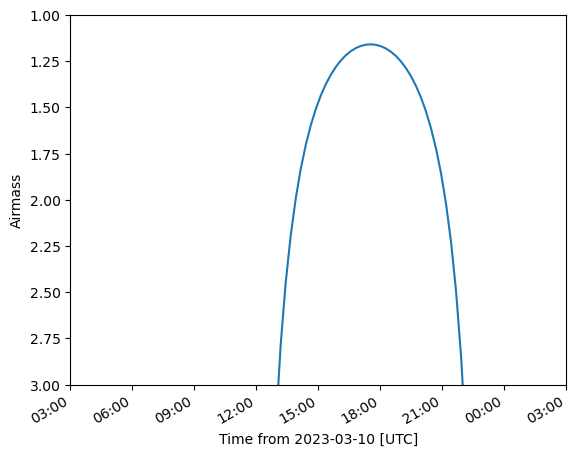

In [30]:
from astroplan.plots import plot_airmass 
plot_airmass(target, rubin, noon_cerro_pachon) 

In [40]:
import numpy as np
start = noon_cerro_pachon
stop = sunrise_tonight
time_window = start + (stop - start) * np.linspace(0, 1, 10)

In [41]:
time_window

<Time object: scale='utc' format='iso' value=['2023-03-10 15:00:00.000' '2023-03-10 17:11:35.352'
 '2023-03-10 19:23:10.704' '2023-03-10 21:34:46.056'
 '2023-03-10 23:46:21.408' '2023-03-11 01:57:56.760'
 '2023-03-11 04:09:32.112' '2023-03-11 06:21:07.464'
 '2023-03-11 08:32:42.816' '2023-03-11 10:44:18.168']>

<PolarAxes: >

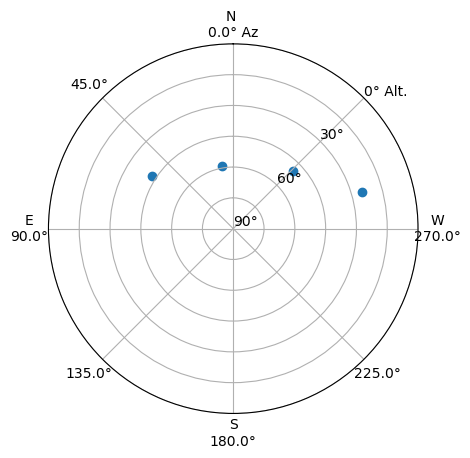

In [42]:
plot_sky(target, rubin, time_window)

In [44]:
imsim_default_time = Time(59580.0, format='mjd')

In [46]:
imsim_default_time.iso

'2022-01-01 00:00:00.000'

In [47]:
imsim_default_utc = imsim_default_time.to_datetime(timezone=pytz.utc)
imsim_default_local = imsim_default_utc.astimezone(tz)
imsim_default_local.strftime('%Y-%m-%d %H:%M:%S')

'2021-12-31 21:00:00'

it is 9pm local time on New Year's Eve. So it's actually the middle of the summer! What is the position of the moon?

In [49]:
rubin.moon_illumination(imsim_default_utc)

0.04736692503143297

Ok, so this means the moon is very close to New Moon at that time.  At what alt/az is the chosen direction at the time?

In [50]:
rubin.moon_phase(imsim_default_time)

<Quantity 2.70280209 rad>

In [57]:
moon_rise = rubin.moon_rise_time(imsim_default_time).to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')
moon_rise

'2022-01-01 05:20:54'

ok, so the new moon doesn't rise until after close to morning. 

In [59]:
rubin.location

<EarthLocation (1820193.06844603, -5208343.03427567, -3194842.50048343) m>

In [60]:
from astropy.coordinates import get_body
moon = get_body("moon", time_window, location=rubin.location, )#ephemeris=self.ephemerisr

In [72]:
moon = get_body("moon", imsim_default_time,location=rubin.location, )

In [73]:
moon

<SkyCoord (GCRS: obstime=59580.0, obsgeoloc=(4789940.95844208, 2726073.07628531, -3204988.26353444) m, obsgeovel=(-198.79135897, 349.78033991, 0.41432125) m / s): (ra, dec, distance) in (deg, deg, AU)
    (253.09184174, -23.16467582, 0.00241476)>

In [64]:
from  astroplan.target import get_skycoord

In [100]:
rubin.target_hour_angle(imsim_default_time, target)

<Longitude 1.99261573 hourangle>

In [65]:
targets = get_skycoord(target)

In [366]:
imsim_default_time.to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')

'2021-12-31 21:00:00'

Ok, so the default imsim time is 9pm local time. 

In [370]:
rubin.sun_set_time(imsim_default_time).to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')

'2021-12-31 20:43:36'

Yes, so that's a bit unfortunate! Why did we choose time 15 mins after  local sunset???

Change that to 2022-09-22,  which is the optimal obs time for that target. Then it peaks around midnight, and the moon is also very faint.  Show the difference in runtime... 

In [374]:
imsim_new_time = Time('2022-09-22 04:36:00', format='iso')

In [376]:
imsim_new_time.to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')

'2022-09-22 01:36:00'

ok, so this worked - I define the time in UTC, which for that date is 3 hrs ahead,  and converting it back to local timezone shows that it is correct. What would be the MJD?  

In [377]:
imsim_new_time.mjd

59844.191666666666

In [365]:
imsim_default_time.to_datetime()

datetime.datetime(2022, 1, 1, 0, 0)

In [362]:
rubin.target_meridian_transit_time(imsim_default_time, target)

<Time object: scale='utc' format='jd' value=2459580.4179711114>

In [84]:
#moon_separation = moon.separation(targets)

In [69]:
moon_separation.adeg

array([1.55965545e+20, 1.54530378e+20, 1.52973541e+20, 1.51410240e+20,
       1.49957428e+20, 1.48702344e+20, 1.47675830e+20, 1.46838804e+20,
       1.46090515e+20, 1.45300029e+20])

In [77]:
separation = moon.separation(targets)

In [78]:
separation.degree

105.50807052801785

In [ ]:
ok, so this tells me the separation between the moon at the `imsim_default_time`, and the target, being `0,0`. 




A few nights later, probably the moon illumination changes again:

In [79]:
new_time = imsim_default_time + 7 * u.day

In [81]:
new_time.to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')

'2022-01-07 21:00:00'

ok, this is indeed a week later! 

what is the illumination of the moon then? 

In [82]:
rubin.moon_illumination(new_time)

0.32560503306755506

ok, it's 30%. Where is ra,deg = `0,0`  at 9 pm then? 

In [83]:
moon = get_body("moon", new_time,location=rubin.location, )

In [85]:
moon.separation(get_skycoord(target)).degree

5.375360679630609

In [ ]:
ok, they're basically on top of each other.  Check when 

* airmass between
* moon separation between 
* moon illumination between 




In [91]:
from astroplan import (AltitudeConstraint, AirmassConstraint,
                       AtNightConstraint)
constraints = [AltitudeConstraint(30*u.deg, 80*u.deg),
               AirmassConstraint(max=2.2), AtNightConstraint.twilight_civil(),
               MoonSeparationConstraint(min=30 * u.deg, max=55 * u.deg)
              ]

In [275]:
from astroplan import months_observable

In [95]:
time_range = Time(["2021-01-01 06:00", "2022-01-01 12:00"])

In [97]:
best_months = months_observable(constraints, rubin, [target], time_range)

In [98]:
best_months

[{1, 5, 6, 7, 8, 9, 10, 11, 12}]

In [87]:
from astroplan import (AltitudeConstraint, AirmassConstraint,
                       AtNightConstraint)
AirmassConstraint?

Init signature: AirmassConstraint(max=None, min=1, boolean_constraint=True)
Docstring:     
Constrain the airmass of a target.

In the current implementation the airmass is approximated by the secant of
the zenith angle.

.. note::
    The ``max`` and ``min`` arguments appear in the order (max, min)
    in this initializer to support the common case for users who care
    about the upper limit on the airmass (``max``) and not the lower
    limit.

Parameters
----------
max : float or `None`
    Maximum airmass of the target. `None` indicates no limit.
min : float or `None`
    Minimum airmass of the target. `None` indicates no limit.
boolean_contstraint : bool

Examples
--------
To create a constraint that requires the airmass be "better than 2",
i.e. at a higher altitude than airmass=2::

    AirmassConstraint(2)
File:           ~/.local/lib/python3.11/site-packages/astroplan/constraints.py
Type:           type
Subclasses:     

I don't see how I could quickly figure out  at what time the 0,0 point would be close to 30% illuminated moon and above the hotizon...

Convert chosen times from UTC to MJDl; double check that they are indeed what I want them to be ... 

* Aug 10 , 2022 , 3:26 am local time (7:26 UT) :    target crosses meridian,  moon at 100% illumination   54 degrees awa
* Jul 20th,2022, 4:48 am (8:48am UT) local time : target crosses meridian, moon at 42% illumination, 37 deg away 
* Aug 4th, 2022  00:10  am local time  (04:10 UT) :  target at 30 deg alt, airmass=2.0 , moon at 47% illumination 140 deg away 
* Aug 25th, 2022., 02:26 am local time (06:26 UT): target crosses meridian , alt 59.6, airmass 1.16, new moon below horizon (140 deg away), 1%  illumination 


* Sept 22nd, 2022,  1:36 am local time (04:36 UT): target crosses meridian, alt 59.6, airmass 1.16, new moon away, 1% illum ... 

In [222]:
from astroplan import Observer
from astropy.time import Time, TimezoneInfo
import astropy.units as u
import pytz

tz = pytz.timezone("America/Santiago")
rubin = Observer.at_site('cerro pachon')

time_0 = Time(60115.33, format='mjd')
dt = time_0.to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')
mjd = time_0.mjd
print(dt)
print(mjd)

2023-06-20 03:55:12
60115.33


In [216]:
time_1 = Time("2022-08-10 07:26:00")
dt = time_1.to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')
mjd = time_1.mjd
print(dt)
print(mjd)

2022-08-10 03:26:00
59801.30972222222


In [217]:
time_2 = Time("2022-07-20 08:48:00")
dt = time_2.to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')
mjd = time_2.mjd
print(dt)
print(mjd)

2022-07-20 04:48:00
59780.36666666667


In [218]:
time_3 = Time("2022-08-04 04:10:00")
dt = time_3.to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')
mjd = time_3.mjd
print(dt)
print(mjd)

2022-08-04 00:10:00
59795.17361111111


In [219]:
time_4 = Time("2022-08-25 06:26:00")
dt = time_4.to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')
mjd = time_4.mjd
print(dt)
print(mjd)

2022-08-25 02:26:00
59816.268055555556


In [221]:
time_5 =  Time("2022-09-22 04:36:00")
dt = time_5.to_datetime(timezone=pytz.utc).astimezone(tz).strftime('%Y-%m-%d %H:%M:%S')
mjd = time_5.mjd
print(dt)
print(mjd)

2022-09-22 01:36:00
59844.191666666666


# Run img_closed_loop at these MJDs

In [228]:
from astropy.time import Time
import pytz
#tz = pytz.timezone("America/Santiago")
# times are defined in UTC 
time_0 = Time(60115.33, format='mjd')
time_1 = Time("2022-08-10 07:26:00")
time_2 = Time("2022-07-20 08:48:00")
time_3 = Time("2022-08-04 04:10:00")
time_4 = Time("2022-08-25 06:26:00")
time_5 =  Time("2022-09-22 04:36:00")

path_cwd = '/sdf/data/rubin/shared/scichris/DM-41460_moon'

partition='milano'
nodes = 2
mem=75
cpus_per_task=50
thrs=20

def write_to_file(out_file, content):
    with open(out_file, "w") as output:
        for line in content:
            output.write(line)

times = [time_0, time_1, time_2, time_3, time_4, time_5] 

In [158]:
for i in range(len(times)):

    idx = i+1
    time = times[i]
    mjd = time.mjd
    
    cmd = f"python /sdf/data/rubin/user/scichris/WORK/aos_packages/ts_imsim/bin.src/img_closed_loop.py \
    --num_proc 50 --log_level 10  --iter_num 5 --inst lsst  \
    --imsim_log_file /sdf/group/rubin/shared/scichris/DM-41460_moon/{idx}_imsim_log.txt  \
    --output /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}/  \
    --filter_type g --mjd {mjd}"


    slurm_file = os.path.join(path_cwd, f'runSlurm-{idx}.sl')
    slurm_log = os.path.join(path_cwd, f'{idx}_slurm_output.txt')
    content = ['#!/bin/bash -l \n',
              f'#SBATCH --partition {partition} \n',
              '#SBATCH --account rubin:default \n',
          f'#SBATCH --nodes {nodes} \n',
          f'#SBATCH --mem={mem}G \n',
          f'#SBATCH --cpus-per-task={cpus_per_task}\n',
          f'#SBATCH -t {thrs}:00:00 \n',
          f'#SBATCH --job-name m{idx} \n'
          f'#SBATCH --output={slurm_log} \n',
            'echo "starting at `date` on `hostname`" \n',
            "pwd \n",
            "source /cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/loadLSST-ext.bash \n",
            "setup lsst_distrib -t w_latest \n",
            "export IMSIM_HOME=/sdf/home/s/scichris/link_to_scichris/WORK/imsim_home \n",
            "export RUBIN_SIM_DATA_DIR=$IMSIM_HOME/rubin_sim_data \n",
            "export SIMS_SED_LIBRARY_DIR=$IMSIM_HOME/rubin_sim_data/sims_sed_library \n",
            "setup -k -r $IMSIM_HOME/imSim \n",
            "setup -k -r $IMSIM_HOME/skyCatalogs \n",
            "source  /sdf/data/rubin/user/scichris/WORK/aos_packages/setup_aos.sh  \n",
             cmd,
            '\n echo "ended at `date` on `hostname`" \n',
          ]
    write_to_file(slurm_file, content)
    print(slurm_file)
    
    idx += 1 

/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-1.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-2.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-3.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-4.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-5.sl


Also, run FAM for these (with all defaults apart from MJD). So only set `--inst lsstfam`


In [164]:
for i in range(len(times)):

    idx = i+1
    time = times[i]
    mjd = time.mjd
    
    cmd = f"python /sdf/data/rubin/user/scichris/WORK/aos_packages/ts_imsim/bin.src/img_closed_loop.py \
    --num_proc 50 --log_level 10  --iter_num 10 --inst lsstfam  \
    --imsim_log_file /sdf/group/rubin/shared/scichris/DM-41460_moon/{idx}_imsim_log_FAM.txt  \
    --output /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM/  \
    --filter_type g --mjd {mjd}"


    slurm_file = os.path.join(path_cwd, f'runSlurm-{idx}_FAM.sl')
    slurm_log = os.path.join(path_cwd, f'{idx}_slurm_output_FAM.txt')
    content = ['#!/bin/bash -l \n',
              f'#SBATCH --partition {partition} \n',
              '#SBATCH --account rubin:default \n',
          f'#SBATCH --nodes {nodes} \n',
          f'#SBATCH --mem={mem}G \n',
          f'#SBATCH --cpus-per-task={cpus_per_task}\n',
          f'#SBATCH -t {thrs}:00:00 \n',
          f'#SBATCH --job-name fam{idx} \n'
          f'#SBATCH --output={slurm_log} \n',
            'echo "starting at `date` on `hostname`" \n',
            "pwd \n",
            "source /cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/loadLSST-ext.bash \n",
            "setup lsst_distrib -t w_latest \n",
            "export IMSIM_HOME=/sdf/home/s/scichris/link_to_scichris/WORK/imsim_home \n",
            "export RUBIN_SIM_DATA_DIR=$IMSIM_HOME/rubin_sim_data \n",
            "export SIMS_SED_LIBRARY_DIR=$IMSIM_HOME/rubin_sim_data/sims_sed_library \n",
            "setup -k -r $IMSIM_HOME/imSim \n",
            "setup -k -r $IMSIM_HOME/skyCatalogs \n",
            "source  /sdf/data/rubin/user/scichris/WORK/aos_packages/setup_aos.sh  \n",
             cmd,
            '\n echo "ended at `date` on `hostname`" \n',
          ]
    write_to_file(slurm_file, content)
    print(slurm_file)
    
    idx += 1 

/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-1_FAM.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-2_FAM.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-3_FAM.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-4_FAM.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-5_FAM.sl


In [ ]:
Run default MJD for FAM:

In [165]:
idx=0
cmd = f"python /sdf/data/rubin/user/scichris/WORK/aos_packages/ts_imsim/bin.src/img_closed_loop.py \
--num_proc 50 --log_level 10  --iter_num 10 --inst lsstfam  \
--imsim_log_file /sdf/group/rubin/shared/scichris/DM-41460_moon/{idx}_imsim_log_FAM.txt  \
--output /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM/  \
--filter_type g "


slurm_file = os.path.join(path_cwd, f'runSlurm-{idx}_FAM.sl')
slurm_log = os.path.join(path_cwd, f'{idx}_slurm_output_FAM.txt')
content = ['#!/bin/bash -l \n',
          f'#SBATCH --partition {partition} \n',
          '#SBATCH --account rubin:default \n',
      f'#SBATCH --nodes {nodes} \n',
      f'#SBATCH --mem={mem}G \n',
      f'#SBATCH --cpus-per-task={cpus_per_task}\n',
      f'#SBATCH -t {thrs}:00:00 \n',
      f'#SBATCH --job-name fam{idx} \n'
      f'#SBATCH --output={slurm_log} \n',
        'echo "starting at `date` on `hostname`" \n',
        "pwd \n",
        "source /cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/loadLSST-ext.bash \n",
        "setup lsst_distrib -t w_latest \n",
        "export IMSIM_HOME=/sdf/home/s/scichris/link_to_scichris/WORK/imsim_home \n",
        "export RUBIN_SIM_DATA_DIR=$IMSIM_HOME/rubin_sim_data \n",
        "export SIMS_SED_LIBRARY_DIR=$IMSIM_HOME/rubin_sim_data/sims_sed_library \n",
        "setup -k -r $IMSIM_HOME/imSim \n",
        "setup -k -r $IMSIM_HOME/skyCatalogs \n",
        "source  /sdf/data/rubin/user/scichris/WORK/aos_packages/setup_aos.sh  \n",
         cmd,
        '\n echo "ended at `date` on `hostname`" \n',
      ]
write_to_file(slurm_file, content)
print(slurm_file)


/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-0_FAM.sl


## Debugging  OFC error with that:

parts of `img_closed_loop`:

In [297]:
from lsst.ts.imsim.utils import (
    CamType,
    SensorWavefrontError,
    WepEstimator,
    get_camera,
    get_config_dir,
    make_dir,
    plot_fwhm_of_iters,
)
from lsst.ts.ofc import OFC, OFCData
from pathlib import Path
inst = 'lsstfam'
cam_type = CamType(inst)
controller_config_file = 'oic_controller.yaml'
ofc_data = OFCData(cam_type.value)
ofc_data.controller_filename = (
        Path(get_config_dir()) / "controllers" / controller_config_file
    )
ofc_calc = OFC(ofc_data)
ofc_calc.ofc_data.znmin = 4
ofc_calc.ofc_data.zn_selected = np.arange(
    ofc_calc.ofc_data.znmin, max_noll_index + 1
)




In [213]:
for inst in[ 'comcam', 'lsst', 'lsstfam']:
    cam_type = CamType(inst)
    ofc_name = 'lsst' if cam_type.value.startswith('l') else 'comcam'
    print(inst, '-->',  ofc_name)

comcam --> comcam
lsst --> lsst
lsstfam --> lsst


In [218]:
from lsst.obs.lsst import LsstCam
from lsst.daf import butler as dafButler
butler_root_path  = '/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_0_FAM_direct/imsimData'
butler = dafButler.Butler(butler_root_path)

In [232]:
dataset_refs = butler.registry.queryDatasets(
    datasetType="donutCatalog", collections=[f"ts_imsim_{seq_num}"]
).expanded()
len(list(dataset_refs))
refs=[]
for ref  in dataset_refs:
    refs.append(ref)

In [234]:
for ref in refs:
    donutCat = butler.get('donutCatalog', dataId=refs[0].dataId, collections=[f"ts_imsim_{seq_num}"])


all donut catalogs are there ! And what about the stamps?  There too! What about `zernikeEstimateAvg`? 

In [268]:
dataset_refs = butler.registry.queryDatasets(
    datasetType="zernikeEstimateRaw", collections=[f"ts_imsim_{seq_num}"]
).expanded()
len(list(dataset_refs))
refs = []
for ref in dataset_refs:
    refs.append(ref)

In [270]:
#refs

In [272]:
zks = []
for ref in refs:
    zkRaw = butler.get(
        "zernikeEstimateAvg",
        dataId=ref.dataId,
        collections=[f"ts_imsim_{seq_num}"],
    )
    zks.append(zkRaw)


In [279]:
zk[0]

array([-0.33260636,  0.18808394,  0.03837215,  0.17981118, -0.02869652,
       -0.10656868, -0.04212284,  0.01813535, -0.03818194,  0.0380069 ,
        0.05218968,  0.09102957,  0.0096425 , -0.00065048,  0.01384338,
        0.0029629 , -0.0354726 ,  0.01378525, -0.00523842,  0.00114408,
       -0.00917188, -0.01361617, -0.0116169 , -0.00056215,  0.00813063])

Text(0.5, 1.0, 'Raw Zks')

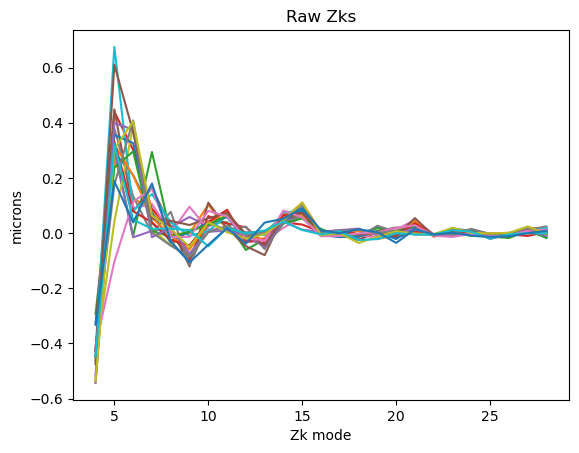

In [289]:
for zk in zks:
#    print(zk)
    plt.plot(np.arange(4,29), zk[0])
plt.xlabel('Zk mode')
plt.ylabel('microns')
plt.title('Raw Zks')

ok, so all `raw` zernikes are there! What about `zernikeEstimateAvg` ? 

In [285]:
dataset_refs = butler.registry.queryDatasets(
    datasetType="zernikeEstimateAvg", collections=[f"ts_imsim_{seq_num}"]
).expanded()
refs = []
for ref in dataset_refs:
    refs.append(ref)

In [287]:
zkavgs = []
for ref in refs:
    zkavgs.append(butler.get(
        "zernikeEstimateAvg",
        dataId=ref.dataId,
        collections=[f"ts_imsim_{seq_num}"],
    )
                 )


Text(0.5, 1.0, 'Avg Zks')

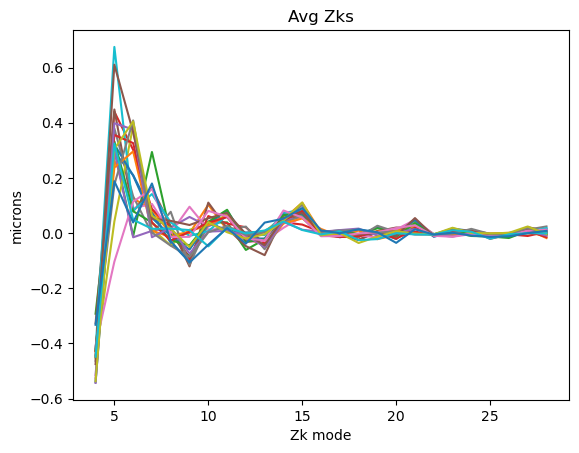

In [290]:
for zk in zkavgs:
#    print(zk)
    plt.plot(np.arange(4,29), zk[0])
plt.xlabel('Zk mode')
plt.ylabel('microns')
plt.title('Avg Zks')

Here we pick up `img_closed_loop` to find out what's going on:

In [291]:
seq_num = 1002
butler_inst_name = 'Cam'

dataset_refs = butler.registry.queryDatasets(
    datasetType="zernikeEstimateAvg", collections=[f"ts_imsim_{seq_num}"]
)

# Get the map for detector Id to detector name
camera = butler.get(
    "camera",
    {"instrument": f"LSST{butler_inst_name}"},
    collections=[f"LSST{butler_inst_name}/calib/unbounded"],
)
det_id_map = camera.getIdMap()
det_name_map = camera.getNameMap()

In [300]:
len(zer_coeff)

1

In [301]:
list_of_wf_err = []
max_noll_index=28
for dataset in dataset_refs:
    data_id = {
        "instrument": dataset.dataId["instrument"],
        "detector": dataset.dataId["detector"],
        "visit": dataset.dataId["visit"],
    }

    zer_coeff = butler.get(
        "zernikeEstimateAvg",
        dataId=data_id,
        collections=[f"ts_imsim_{seq_num}"],
    )

    sensor_wavefront_data = SensorWavefrontError(
        num_of_zk=max_noll_index - ofc_calc.ofc_data.znmin + 1
    )
    sensor_name = det_id_map[dataset.dataId["detector"]].getName()
    sensor_wavefront_data.sensor_name = sensor_name
    sensor_wavefront_data.sensor_id = det_name_map[sensor_name].getId()
    sensor_wavefront_data.annular_zernike_poly = zer_coeff[0]

    list_of_wf_err.append(sensor_wavefront_data)


In [302]:
list_of_wf_err

In [8]:
inst = 'lsstfam'
cam_type = CamType(inst)
if cam_type in [CamType.LsstCam, CamType.LsstFamCam, CamType.ComCam]:
    list_of_wf_err = self._calc_wf_err_from_img(
        obs_metadata,
        butler_root_path=butler_root_path,
        cam_type=cam_type,
        wep_estimator=wep_estimator,
        num_pro=num_pro,
        pipeline_file=pipeline_file,
    )


# Get the PSSN from file
pssn = self.imsim_cmpt.get_opd_pssn_from_file(opd_pssn_file_name)
self.log.info("Calculated PSSN is %s." % pssn)

# Get the GQ effective FWHM from file
gq_eff_fwhm = self.imsim_cmpt.get_opd_gq_eff_fwhm_from_file(
    opd_pssn_file_name
)
self.log.info("GQ effective FWHM is %.4f." % gq_eff_fwhm)

# Set the FWHM data
fwhm = self.imsim_cmpt.get_list_of_fwhm_sensor_data(opd_pssn_file_name)

self.imsim_cmpt.reorder_and_save_wf_err_file(
    list_of_wf_err,
    ref_sensor_name_list,
    get_camera(cam_type),
    zk_file_name=wfs_zk_file_name,
)

# Calculate the DOF
wfe = np.array(
    [sensor_wfe.annular_zernike_poly for sensor_wfe in list_of_wf_err]
)

sensor_ids = np.array(
    [sensor_wfe.sensor_id for sensor_wfe in list_of_wf_err]
)

# Only include the fwhm data from sensor we are simulating
# (e.g. only raft centers instead of full FAM).
if self.use_ccd_img:
    fwhm_idx = [ref_sensor_id_list.index(sens_id) for sens_id in sensor_ids]
    fwhm = fwhm[fwhm_idx]


self.ofc_calc.set_fwhm_data(fwhm, sensor_ids)





Also, run the default for `inst lsst` (corner sensors)

In [261]:
path_cwd = '/sdf/data/rubin/shared/scichris/DM-41460_moon'

partition='milano'
nodes = 2
mem=75
cpus_per_task=50
thrs=20

def write_to_file(out_file, content):
    with open(out_file, "w") as output:
        for line in content:
            output.write(line)
idx=0

cmd = f"python /sdf/data/rubin/user/scichris/WORK/aos_packages/ts_imsim/bin.src/img_closed_loop.py \
--num_proc 50 --log_level 10  --iter_num 5 --inst lsst  \
--imsim_log_file /sdf/group/rubin/shared/scichris/DM-41460_moon/{idx}_imsim_log.txt  \
--output /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_base/  \
--filter_type g "


slurm_file = os.path.join(path_cwd, f'runSlurm-{idx}.sl')
slurm_log = os.path.join(path_cwd, f'{idx}_slurm_output.txt')
content = ['#!/bin/bash -l \n',
          f'#SBATCH --partition {partition} \n',
          '#SBATCH --account rubin:default \n',
      f'#SBATCH --nodes {nodes} \n',
      f'#SBATCH --mem={mem}G \n',
      f'#SBATCH --cpus-per-task={cpus_per_task}\n',
      f'#SBATCH -t {thrs}:00:00 \n',
      f'#SBATCH --job-name m{idx} \n'
      f'#SBATCH --output={slurm_log} \n',
        'echo "starting at `date` on `hostname`" \n',
        "pwd \n",
        "source /cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/loadLSST-ext.bash \n",
        "setup lsst_distrib -t w_latest \n",
        "export IMSIM_HOME=/sdf/home/s/scichris/link_to_scichris/WORK/imsim_home \n",
        "export RUBIN_SIM_DATA_DIR=$IMSIM_HOME/rubin_sim_data \n",
        "export SIMS_SED_LIBRARY_DIR=$IMSIM_HOME/rubin_sim_data/sims_sed_library \n",
        "setup -k -r $IMSIM_HOME/imSim \n",
        "setup -k -r $IMSIM_HOME/skyCatalogs \n",
        "source  /sdf/data/rubin/user/scichris/WORK/aos_packages/setup_aos.sh  \n",
         cmd,
        '\n echo "ended at `date` on `hostname`" \n',
      ]
write_to_file(slurm_file, content)
print(slurm_file)


/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-0.sl


Also, run with direct detect to avoid any possible issues with  WCS ... 

pipeline config : `/sdf/data/rubin/shared/scichris/DM-41460_moon/lsstPipelineDirect.yaml` 

In [208]:
path_cwd = '/sdf/data/rubin/shared/scichris/DM-41460_moon'
path_pipeline = os.path.join(path_cwd , 'lsstPipelineDirect.yaml')
partition='milano'
nodes = 2
mem=75
cpus_per_task=50
thrs=20
method='direct'
itern = 10
def write_to_file(out_file, content):
    with open(out_file, "w") as output:
        for line in content:
            output.write(line)


for i in range(len(times)):

    idx = i+1
    time = times[i]
    mjd = time.mjd
    
    cmd = f"python /sdf/data/rubin/user/scichris/WORK/aos_packages/ts_imsim/bin.src/img_closed_loop.py \
    --num_proc 50 --log_level 10  --iter_num {itern} --inst lsst  \
    --imsim_log_file /sdf/group/rubin/shared/scichris/DM-41460_moon/{idx}_imsim_log_{method}_long.txt  \
    --output /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_{method}_long/  \
    --filter_type g --mjd {mjd} \
    --pipeline_file {path_pipeline} --clobber \n"


    slurm_file = os.path.join(path_cwd, f'runSlurm-{idx}-{method}.sl')
    slurm_log = os.path.join(path_cwd, f'{idx}_slurm_output_{method}_long.txt')
    content = ['#!/bin/bash -l \n',
              f'#SBATCH --partition {partition} \n',
              '#SBATCH --account rubin:default \n',
          f'#SBATCH --nodes {nodes} \n',
          f'#SBATCH --mem={mem}G \n',
          f'#SBATCH --cpus-per-task={cpus_per_task}\n',
          f'#SBATCH -t {thrs}:00:00 \n',
          f'#SBATCH --job-name m{idx} \n'
          f'#SBATCH --output={slurm_log} \n',
            'echo "starting at `date` on `hostname`" \n',
            "pwd \n",
            "source /cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/loadLSST-ext.bash \n",
            "setup lsst_distrib -t w_latest \n",
            "export IMSIM_HOME=/sdf/home/s/scichris/link_to_scichris/WORK/imsim_home \n",
            "export RUBIN_SIM_DATA_DIR=$IMSIM_HOME/rubin_sim_data \n",
            "export SIMS_SED_LIBRARY_DIR=$IMSIM_HOME/rubin_sim_data/sims_sed_library \n",
            "setup -k -r $IMSIM_HOME/imSim \n",
            "setup -k -r $IMSIM_HOME/skyCatalogs \n",
            "source  /sdf/data/rubin/user/scichris/WORK/aos_packages/setup_aos.sh  \n",
             cmd,
             
            'echo "ended at `date` on `hostname`" \n',
          ]
    write_to_file(slurm_file, content)
    print(slurm_file)
    
    idx += 1 

/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-1-direct.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-2-direct.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-3-direct.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-4-direct.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-5-direct.sl


Also, try running more stars than the default, perhaps a grid. Make eg. 10 stars per CCD of brightness between 13.5 and 15.5... 

21


(0.0, 2000.0)

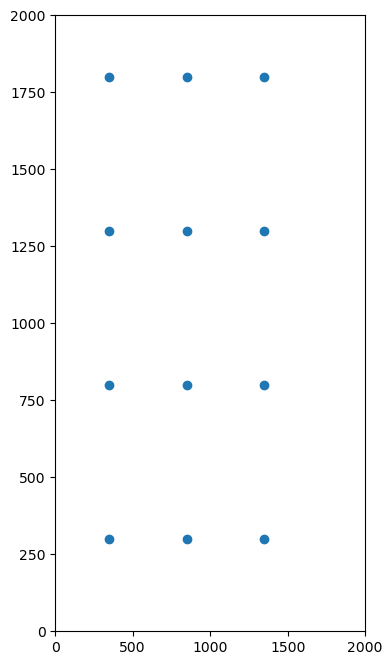

In [174]:
import matplotlib.pyplot as plt
def get_donut_grid(radius = 100, margin = 40, xmax = 4000, ymax = 2000,
                  xmin=None, ymin=None):
    if xmin == None:
        xmin = margin+radius
    if ymin == None: 
        
        ymin = xmin

    xlist = np.arange(xmin,xmax-margin, 2*(radius+margin))
    ylist = np.arange(ymin,ymax-margin, 2*(radius+margin))

    x_,y_ = np.meshgrid(xlist,ylist)

    xs = np.ravel(x_)
    ys = np.ravel(y_)

    return xs,ys
    
xs, ys = get_donut_grid(radius=200, xmin=350, ymin=300, xmax=1700, ymax=3700, margin=50)

print(len(xs))
plt.figure(figsize=(4,8))
plt.scatter(xs,ys)
plt.xlim(0,2000)
plt.ylim(0,2000)

Note: for each obstime need to make a separate grid due to slightly different parallactic angle at each obstime, if we want them to be identically aligned within each sensor. 

In [176]:
import lsst.obs.lsst as obs_lsst
from lsst.afw.cameraGeom import PIXELS, FIELD_ANGLE
from lsst.geom import Point2D
import astropy
from astroplan import Observer
from lsst.ts.wep.utils import rotMatrix
from astropy.table import Table


camera =  obs_lsst.LsstCam().getCamera()
detectors = list(camera.getNameMap().keys())
fieldX, fieldY = list(), list()
#fieldXrad, fieldYrad = list(), list()
detName = list()
xps, yps = [],[]
for name in detectors:
    if 'SW' in name:
        detector = camera.get(name)
        transform = detector.getTransform(PIXELS, FIELD_ANGLE)
    
        # make a list of points in pixels 
        #print(len(xs), len(ys))
        fps = [Point2D(fpx,fpy) for fpx, fpy in zip(xs,ys)]
    
        # transform from pixels to radians 
        pixels = transform.applyForward(fps)
    
        # this is now in field angle coords, i.e. radians
        fpxRad = [pixel.x for pixel in pixels]
        fpyRad = [pixel.y for pixel in pixels]
    
        # radians to degrees
        fpyDeg = [np.rad2deg(fp) for fp in fpyRad]
        fpxDeg = [np.rad2deg(fp) for fp in fpxRad]
    
        #fieldXrad = np.append(fieldXrad, fpxRad)
        #fieldYrad = np.append(fieldYrad, fpyRad)
        fieldX = np.append(fieldX, fpxDeg)
        fieldY = np.append(fieldY, fpyDeg)
        names = [name for i in range(len(fpxDeg))]
        detName = np.append(detName, names)

    # this is enough information:  fieldX, fieldY in degrees
    # to save the star catalog file 

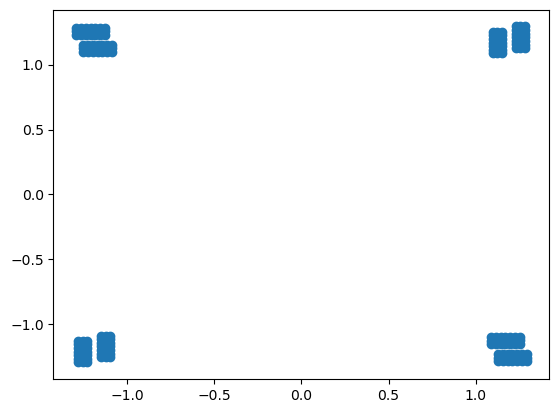

In [177]:
plt.scatter(fieldX, fieldY)

rotate by the parallactic angle : this is different for each MJD 

In [227]:
times[0].mjd

59801.30972222222

In [181]:
for i in range(5):
    idx = i+1 
    print(idx)

1
2
3
4
5


## Display parallactic angle for all  used times: 

In [229]:
from astropy.coordinates import SkyCoord
ra = 0.0
dec = 0.0
rotator = 0.0

rubin_observer = Observer.at_site("cerro pachon")
boresight = SkyCoord(
            f"{ra}d", f"{dec}d", frame="icrs"
        )

for idx in range(5):
    time = times[idx]
    parallactic = rubin_observer.parallactic_angle(time, boresight).deg
    print(idx, time.mjd, parallactic)

0 60115.33 -130.1781932025212
1 59801.30972222222 -179.18795934937043
2 59780.36666666667 -178.9435024163646
3 59795.17361111111 -125.26767128110936
4 59816.268055555556 -178.7484772129415


1 59801.30972222222 -179.18795934937043
saved as lsstCam_grid_1.txt
2 59780.36666666667 -178.9435024163646
saved as lsstCam_grid_2.txt
3 59795.17361111111 -125.26767128110936
saved as lsstCam_grid_3.txt
4 59816.268055555556 -178.7484772129415
saved as lsstCam_grid_4.txt
5 59844.191666666666 -178.78770457305225
saved as lsstCam_grid_5.txt


Text(0, 0.5, 'Dec [deg]')

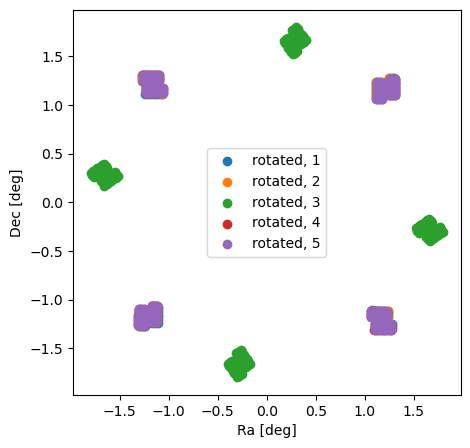

In [206]:
ra = 0.0
dec = 0.0
rotator = 0.0
# creating a grid in this magnitude range 
min_mag = 13
max_mag = 15 
rubin_observer = Observer.at_site("cerro pachon")
boresight = astropy.coordinates.SkyCoord(
            f"{ra}d", f"{dec}d", frame="icrs"
        )

plt.figure(figsize=(5,5))


for i in range(5):
    idx = i+1 
    time = times[i]

    parallactic = rubin_observer.parallactic_angle(time, boresight).deg
    print(idx, time.mjd, parallactic)
    rotation = rotMatrix(
                rotator - parallactic + 180
            )
    
    fieldXrot = []
    fieldYrot = []
    for ra_in_deg, dec_in_deg in zip(fieldX, fieldY):
        # It is noted that the field position might be < 0. But it is
        # not the same case for ra (0 <= ra <= 360).
        ra_in_deg, dec_in_deg = np.dot(rotation, np.array([ra_in_deg, dec_in_deg]))
    
        if ra_in_deg < 0:
            ra_in_deg += 360.0
    
        fieldXrot.append(ra_in_deg)
        fieldYrot.append(dec_in_deg)
    
    
    # Save the input catalog 
    
    # make an inst catalog 
    coords = Table(data=[fieldXrot, fieldYrot],  names=['Ra','Dec'])
    
    # add a column with object id 
    coords['Id'] = np.arange(len(coords))
    magspace = np.linspace(min_mag, max_mag,len(coords))
    mags_random = np.random.choice(magspace, size=len(coords), replace=True)
    coords['Mag'] = mags_random
    
    path_cwd = '/sdf/data/rubin/shared/scichris/DM-41460_moon'
    fname = f'lsstCam_grid_{idx}.txt'
    fpath = os.path.join(path_cwd, fname) 
    coords[['Id','Ra','Dec','Mag']].write(fpath, 
                                           format='ascii.commented_header',
                                          overwrite=True)
    print(f'saved as {fname}')
    
    
    # move to +/- 180 for plotting 
    fieldXrot = np.array(fieldXrot)
    m = fieldXrot>180
    fieldXrot[m] = fieldXrot[m] - 360
    
    #[plt.scatter(fieldX, fieldY, label='unrotated') 
    plt.scatter(fieldXrot, fieldYrot, label=f'rotated, {idx}')
#plt.xlim(1.1,1.2)
#plt.ylim(1.0,1.25)
plt.legend()
plt.xlabel('Ra [deg]')
plt.ylabel('Dec [deg]')


    



In [199]:
mags_random = np.random.choice(np.linspace(min_mag, max_mag,len(coords)), size=len(coords), replace=True)

Text(0, 0.5, 'mag')

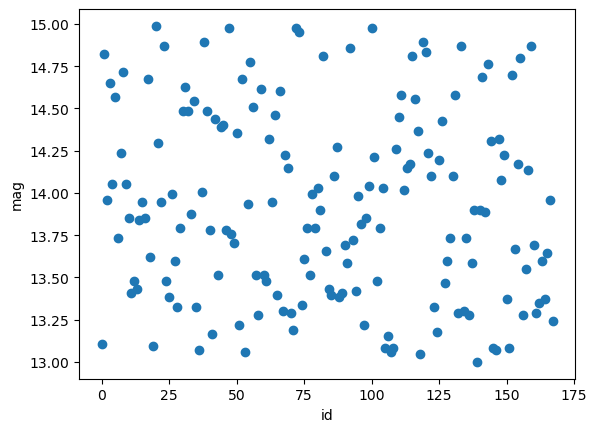

In [201]:
plt.scatter(ID, mags_random)
plt.xlabel('id')
plt.ylabel('mag')

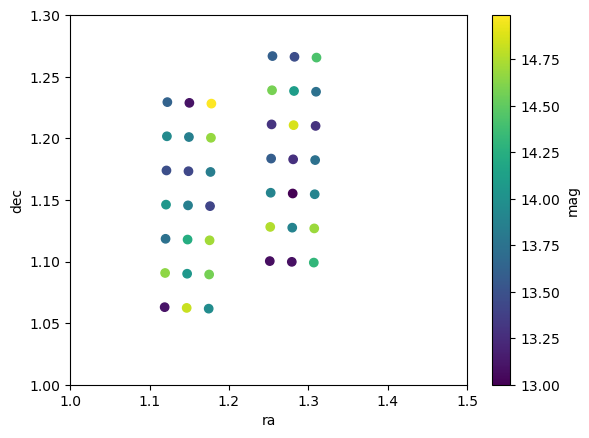

In [205]:
plt.scatter(fieldXrot, fieldYrot, c=mags_random)
plt.xlabel('ra')
plt.ylabel('dec')
plt.xlim(1,1.5)
plt.ylim(1,1.3) 
plt.colorbar(label='mag')

okk, this shows that indeed the magnitudes are scattered at random, which was the intention, to make sure that no corner is preferentially treated. 

In [209]:
path_cwd = '/sdf/data/rubin/shared/scichris/DM-41460_moon'
path_pipeline = os.path.join(path_cwd , 'lsstPipelineDirect.yaml')

partition='milano'
nodes = 2
mem=75
cpus_per_task=50
thrs=20
method='direct'
itern = 10
def write_to_file(out_file, content):
    with open(out_file, "w") as output:
        for line in content:
            output.write(line)

#times = [time_1, time_2, time_3, time_4] 

for i in range(len(times)):

    idx = i+1
    time = times[i]
    mjd = time.mjd

    path_instcat = os.path.join(path_cwd, f'lsstCam_grid_{idx}.txt')
    
    cmd = f"python /sdf/data/rubin/user/scichris/WORK/aos_packages/ts_imsim/bin.src/img_closed_loop.py \
    --num_proc 50 --log_level 10  --iter_num {itern} --inst lsst  --sky_file {path_instcat}\
    --imsim_log_file /sdf/group/rubin/shared/scichris/DM-41460_moon/{idx}_imsim_log_{method}_long_grid.txt  \
    --output /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_{method}_long_grid/  \
    --filter_type g --mjd {mjd} \
    --pipeline_file {path_pipeline} --clobber \n"


    slurm_file = os.path.join(path_cwd, f'runSlurm-{idx}-{method}_grid.sl')
    slurm_log = os.path.join(path_cwd, f'{idx}_slurm_output_{method}_long_grid.txt')
    content = ['#!/bin/bash -l \n',
              f'#SBATCH --partition {partition} \n',
              '#SBATCH --account rubin:default \n',
          f'#SBATCH --nodes {nodes} \n',
          f'#SBATCH --mem={mem}G \n',
          f'#SBATCH --cpus-per-task={cpus_per_task}\n',
          f'#SBATCH -t {thrs}:00:00 \n',
          f'#SBATCH --job-name m{idx}_g \n'
          f'#SBATCH --output={slurm_log} \n',
            'echo "starting at `date` on `hostname`" \n',
            "pwd \n",
            "source /cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/loadLSST-ext.bash \n",
            "setup lsst_distrib -t w_latest \n",
            "export IMSIM_HOME=/sdf/home/s/scichris/link_to_scichris/WORK/imsim_home \n",
            "export RUBIN_SIM_DATA_DIR=$IMSIM_HOME/rubin_sim_data \n",
            "export SIMS_SED_LIBRARY_DIR=$IMSIM_HOME/rubin_sim_data/sims_sed_library \n",
            "setup -k -r $IMSIM_HOME/imSim \n",
            "setup -k -r $IMSIM_HOME/skyCatalogs \n",
            "source  /sdf/data/rubin/user/scichris/WORK/aos_packages/setup_aos.sh  \n",
             cmd,
             
            'echo "ended at `date` on `hostname`" \n',
          ]
    write_to_file(slurm_file, content)
    print(slurm_file)
    
    idx += 1 

/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-1-direct_grid.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-2-direct_grid.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-3-direct_grid.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-4-direct_grid.sl
/sdf/data/rubin/shared/scichris/DM-41460_moon/runSlurm-5-direct_grid.sl


getting 


    lsst.ctrl.mpexec.singleQuantumExecutor INFO: Constructing task and executing quantum for label=cutOutDonutsCwfsTask dataId={instrument: 'LSSTCam', exposure: 7022071901000, band: '
    g', day_obs: 20220719, group: '1000', physical_filter: 'g_6'}.
    lsst.cutOutDonutsCwfsTask INFO: Median Recentering Shift: (1.0, 1.0)
    lsst.ctrl.mpexec.singleQuantumExecutor ERROR: Execution of task 'cutOutDonutsCwfsTask' on quantum {instrument: 'LSSTCam', exposure: 7022071901000, band: 'g', day_obs: 20220719, gr
    oup: '1000', physical_filter: 'g_6'} failed. Exception UnboundLocalError: cannot access local variable 'intraCatalog' where it is not associated with a value
    Process task-{instrument: 'LSSTCam', exposure: 7022071901000, band: 'g', day_obs: 20220719, group: '1000', physical_filter: 'g_6'}:

trying to update ts_ofc,  ts_wep,  ts_imsim rerunning runSlurm-1-direct       to see if that helps.... 

Look at the simulated postISR images - are the donuts there? What's going on ? 

I get 

                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/share/eups/Linux64/ctrl_mpexec/g366e7aaf77+272fe60019/python/lsst/ctrl/mpexec
    /singleQuantumExecutor.py", line 296, in _execute
        self.runQuantum(task, quantum, task_node, limited_butler)
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/share/eups/Linux64/ctrl_mpexec/g366e7aaf77+272fe60019/python/lsst/ctrl/mpexec
    /singleQuantumExecutor.py", line 524, in runQuantum
        task.runQuantum(butlerQC, inputRefs, outputRefs)
      File "/sdf/data/rubin/user/scichris/WORK/aos_packages/ts_wep/python/lsst/ts/wep/task/cutOutDonutsCwfsTask.py", line 124, in runQuantum
        raise ValueError("Unequal number of intra and extra focal detectors.")

and with most up-to-date AOS packages  , and w_2024_32 , I still get 

      File "/sdf/data/rubin/user/scichris/WORK/aos_packages/ts_wep/python/lsst/ts/wep/task/cutOutDonutsCwfsTask.py", line 124, in runQuantum
        raise ValueError("Unequal number of intra and extra focal detectors.")
    ValueError: Unequal number of intra and extra focal detectors.

ok, I was getting an issue with direct detect, probably because of the background level donuts were not getting detected... Lets ensure that they do in the actual run... 

Run direct detect on different grids:

postISRCCD@{instrument: 'LSSTCam', detector: 196, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=f0f8d1fc-5b0f-4836-92d9-1385aba85336)
postISRCCD@{instrument: 'LSSTCam', detector: 199, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=abfcab68-6529-488d-bf34-b053688c55ac)
postISRCCD@{instrument: 'LSSTCam', detector: 192, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=7f24c4b9-41b1-48cc-822a-e41a52c5d720)
postISRCCD@{instrument: 'LSSTCam', detector: 203, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=afa8a3d9-0ca3-4a52-8196-7a52d62c38fb)
postISRCCD@{instrument: 'LSSTCam', detector: 195, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical

INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 23 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 23 of 23 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 16 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 16 of 16 sources in exposure


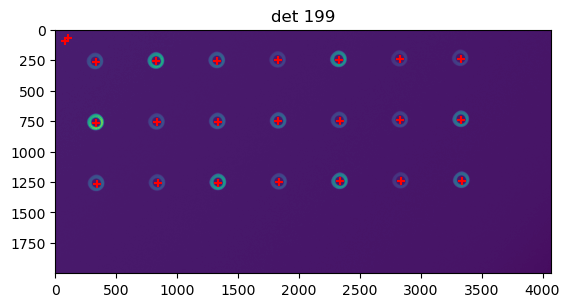

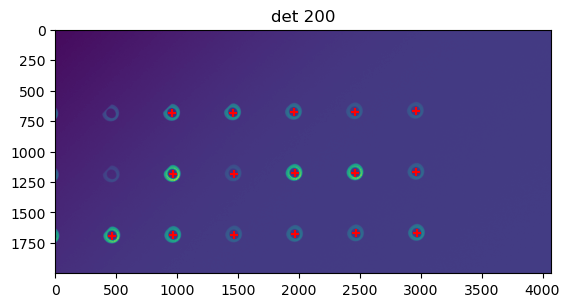

In [196]:
from lsst.ts.wep.task.generateDonutDirectDetectTask import (GenerateDonutDirectDetectTask,GenerateDonutDirectDetectTaskConfig)
from copy import copy
from lsst.obs.lsst import LsstCam
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt

idx = 1
img_dir = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct_long_grid/"
path_to_repo = os.path.join(img_dir, 'imsimData')
butler = dafButler.Butler(path_to_repo)

dataRefs = butler.registry.queryDatasets('postISRCCD', collections = ['ts_imsim_1000']).expanded()
exps = {}
for ref in dataRefs:
    print(ref)
    detId = ref.dataId.detector.id
    if detId in (199, 200):
        exps[detId] = butler.get('postISRCCD', dataId = ref.dataId,  collections = ['ts_imsim_1000'])


camera = LsstCam().getCamera()

config = GenerateDonutDirectDetectTaskConfig()
config.measurementTask.nPixMinDetection = 2 # instead of 10
config.measurementTask.nSigmaDetection = 2
config.donutSelector.useCustomMagLimit = True
config.doDonutSelection = False

donutCats = {}
for detId in exps.keys():
    exp = exps[detId]
    fig = plt.figure()
    plt.imshow(exp.image.array)
    
    # detect donuts and overplot 
    task = GenerateDonutDirectDetectTask(config=config)
    taskOut = task.run(copy(exp), camera)
    donutCats[detId] = taskOut.donutCatalog
    plt.scatter(taskOut.donutCatalog['centroid_x'], taskOut.donutCatalog['centroid_y'], c='r', marker='+')
    plt.title(f'det {detId}')

Try feeding that to cutOutDonutsCwfsTask: 

In [195]:
donutCats[200]

,coord_ra,coord_dec,centroid_x,centroid_y,detector,source_flux,blend_centroid_x,blend_centroid_y,finalDonutX,finalDonutY,xCorner,yCorner,xShift,yShift,recenterFlags
0,0.019692,-0.022311,2464.202120,1172.385086,R40_SW1,3.328377e+07,,,2465,1174,2385,1094,1,2,0
1,0.021143,-0.022339,964.604788,1186.691348,R40_SW1,3.307721e+07,,,965,1187,885,1107,1,1,0
2,0.020176,-0.022320,1964.195375,1177.252215,R40_SW1,3.285886e+07,,,1965,1178,1885,1098,1,1,0
3,0.021638,-0.021864,468.690640,1691.533891,R40_SW1,3.002577e+07,,,469,1692,389,1612,1,1,0
4,0.021153,-0.021856,969.860871,1685.531832,R40_SW1,2.395676e+07,,,969,1687,889,1607,0,2,0
5,0.020648,-0.022813,1460.381392,682.404714,R40_SW1,1.767563e+07,,,1460,682,1380,602,0,0,0
6,0.019219,-0.021818,2968.196993,1668.184945,R40_SW1,1.691300e+07,,,2970,1669,2890,1589,2,1,0
7,0.021132,-0.022822,960.716553,686.843629,R40_SW1,1.526514e+07,,,960,687,880,607,0,1,0
8,0.020166,-0.022804,1959.278247,677.210725,R40_SW1,1.365135e+07,,,1960,678,1880,598,1,1,0
9,0.020187,-0.021837,1968.143911,1677.130824,R40_SW1,1.251510e+07,,,1969,1678,1889,1598,1,1,0


In [197]:
from lsst.ts.wep.task.cutOutDonutsCwfsTask import (
    CutOutDonutsCwfsTask,
    CutOutDonutsCwfsTaskConfig,
)
config = CutOutDonutsCwfsTaskConfig()
config.maxRecenterDistance = 35

cutoutTask = CutOutDonutsCwfsTask(config=config)


cutoutResults = cutoutTask.run([exps[199], exps[200]],
                  [donutCats[199],donutCats[200]],
                  camera)



INFO:lsst.CutOutDonutsCwfsTask:Median Recentering Shift: (1.0, 1.0)
INFO:lsst.CutOutDonutsCwfsTask:Median Recentering Shift: (1.0, 1.0)


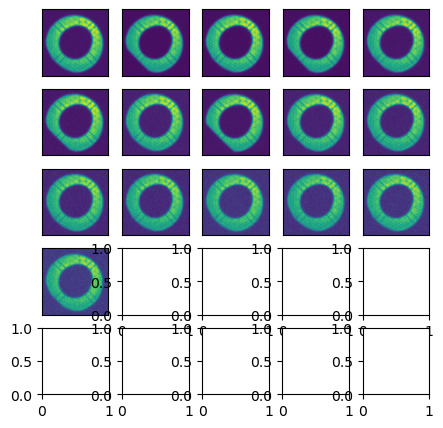

In [199]:
ncols=5
nrows=5 # n detectors which is 8 ... 
w=1
fig,axs= plt.subplots(nrows, ncols,
                      figsize=(ncols*w, nrows*w))
ax = np.ravel(axs)
donutStamps = cutoutResults.donutStampsExtra
donutStamps = cutoutResults.donutStampsIntra
for i in range(len(donutStamps)):

    stamp = donutStamps[i]

    ax[i].imshow(stamp.stamp_im.image.array, origin='lower')
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    i += 1 


that was only the case for idx=1  (full moon) .  For idx=2,3  it's working fine. Show the difference in background levels:

In [6]:
dataRefs = butler.registry.queryDatasets('donutStampsExtra', collections = ['ts_imsim_1000']).expanded()
donutStampsExtra = {}
for ref in dataRefs:
    print(ref)
    donutStampsExtra[ref.dataId.detector.id] = butler.get('donutStampsExtra', dataId=ref.dataId,  collections = ['ts_imsim_1000'])

donutStampsExtra@{instrument: 'LSSTCam', detector: 191, visit: 7022080901000, band: 'g', day_obs: 20220809, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=0d0378cd-bc5e-4b42-a2ac-d6b126dac684)
donutStampsExtra@{instrument: 'LSSTCam', detector: 195, visit: 7022080901000, band: 'g', day_obs: 20220809, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=260f86cc-1ad8-4228-9a7e-f4cc77c0d498)
donutStampsExtra@{instrument: 'LSSTCam', detector: 199, visit: 7022080901000, band: 'g', day_obs: 20220809, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=9560504e-7ed0-4a78-9b32-9897763352cf)
donutStampsExtra@{instrument: 'LSSTCam', detector: 203, visit: 7022080901000, band: 'g', day_obs: 20220809, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=60dd3012-8179-41e5-b5c0-9a1ad407311c)


In [14]:
donutStampsExtra[191][0].stamp_im.image.array

array([[  63.04785  ,   -0.4790039,  -67.74512  , ...,    2.6264648,
         -14.785156 , -101.9917   ],
       [  11.853027 ,   55.509766 ,  -26.711914 , ...,  -26.13379  ,
           1.3212891,  -17.337402 ],
       [  -5.939453 , -108.10205  ,  -20.824707 , ...,   13.404785 ,
         134.33398  ,    8.491699 ],
       ...,
       [  59.628906 ,   60.910645 ,  -42.49756  , ...,  -45.63672  ,
          55.351562 ,  -63.012695 ],
       [ -18.23584  ,  -66.80664  ,   32.93506  , ...,  -12.578613 ,
           3.659668 ,   -3.7822266],
       [-103.57861  ,  -46.212402 ,  -31.220215 , ...,  -19.40332  ,
          45.441406 ,   50.462402 ]], dtype=float32)

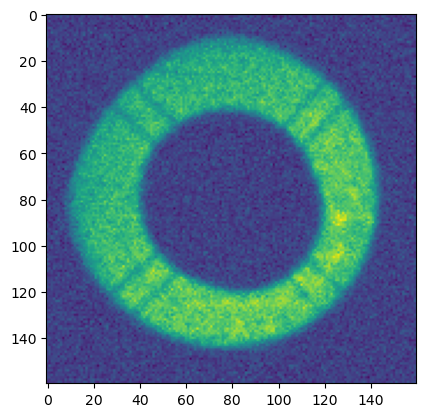

In [16]:
stamp = donutStampsExtra[191][0]
plt.imshow(stamp.stamp_im.image.array)

## Plot donuts from different runs, one per detector

I envisage 8 rows, with nrows=ndetectors. Each successive column would be next iteration...  

In [295]:
#butler.registry.queryCollections()

In [306]:
idx=5
iterRange = 10
dir_name  = f'imgClosedLoop_{idx}_direct_long/'
img_dir = os.path.join(f"/sdf/group/rubin/shared/scichris/DM-41460_moon/",dir_name)

path_to_repo = os.path.join(img_dir, 'imsimData')
butler = dafButler.Butler(path_to_repo)

iterdic = {}

for itern in range(iterRange):
    collection = f'ts_imsim_10{itern}0'
    dataRefs = butler.registry.queryDatasets('donutStampsExtra', collections = [collection]).expanded()
    donutStampsExtra = {}
    donutStampsIntra = {}
    for ref in dataRefs:  # both intra and extra are keyed under the same dataId
        #print(ref)
        donutStampsExtra[ref.dataId.detector.id] = butler.get('donutStampsExtra', 
                                                              dataId=ref.dataId,  collections = [collection])
        donutStampsIntra[ref.dataId.detector.id] = butler.get('donutStampsIntra', 
                                                              dataId=ref.dataId,  collections = [collection])
    iterdic[itern] = {'donutStampsExtra':donutStampsExtra, 'donutStampsIntra':donutStampsIntra}

Illustrate 5 iterations of extra-focal donuts:

Text(0.5, 0.98, 'imgClosedLoop_5_direct_long/')

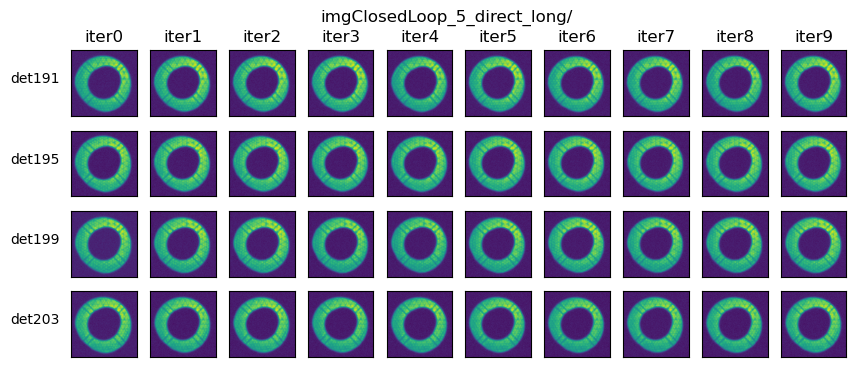

In [307]:
ncols=len(iterdic)
nrows=4 # n detectors which is 8 ... 
w=1
fig,axs= plt.subplots(nrows, ncols,
                      figsize=(ncols*w, nrows*w))
for itern in iterdic.keys():
    col = itern

    i = 0 

    #for pre in ['Ex','In']:
    pre='In'
    donutStamps = iterdic[itern][f'donutStamps{pre}tra']
    
    for detId in donutStamps.keys():
        stamp_array = donutStamps[detId][0].stamp_im.image.array
        row = i
        axs[row,col].imshow(stamp_array, origin='lower')
        axs[row,col].set_xticks([])
        axs[row,col].set_yticks([])
        i += 1 
    axs[0,col].set_title(f'iter{itern}')
i=0
#for pre in ['Ex','In']:
donutStamps = iterdic[itern][f'donutStampsIntra']
for detId in donutStamps.keys():
    row=i
    axs[row,0].text(-150,80, f'det{detId}')
    i+=1
   
fig.suptitle(dir_name)

In [ ]:
donutStamps

In this run (idx=1), the problematic detector was 

    lsst.generateDonutDirectDetectTask.measurementTask INFO: Found 2 sources in exposure
    lsst.generateDonutDirectDetectTask.measurementTask INFO: Measured 2 of 2 sources in exposure
    lsst.generateDonutDirectDetectTask INFO: Running Donut Selector
    lsst.generateDonutDirectDetectTask.donutSelector INFO: Selected 0/2 references
    lsst.ctrl.mpexec.singleQuantumExecutor INFO: Execution of task 'generateDonutDirectDetectTask' on quantum {instrument: 'LSSTCam', detector: 195, visit: 7022080901040, band: 'g', d
    ay_obs: 20220809, physical_filter: 'g_6'} took 2.826 seconds
    
    


show what it looked likeL

In [263]:
collection = f'ts_imsim_1040'
exposure = butler.get('postISRCCD', dataId={'instrument': 'LSSTCam', 'detector': 195, 'exposure': 7022080901040,},
          collections=[collection])


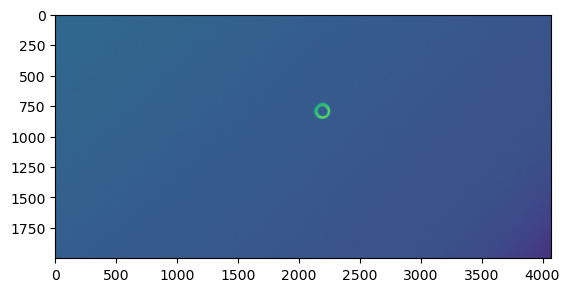

In [264]:
plt.imshow(exposure.image.array)

Looks very clean! Why would `directDetect` have issues here?? 

In [277]:
from lsst.ts.wep.task.generateDonutDirectDetectTask import (GenerateDonutDirectDetectTask,GenerateDonutDirectDetectTaskConfig)
from copy import copy


config = GenerateDonutDirectDetectTaskConfig()
#config.measurementTask.nPixMinDetection = 5 # instead of 10
config.measurementTask.nSigmaDetection = 5
config.donutSelector.useCustomMagLimit = True
config.doDonutSelection = False

task = GenerateDonutDirectDetectTask(config=config)

taskOut = task.run(copy(exposure), camera)

INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure


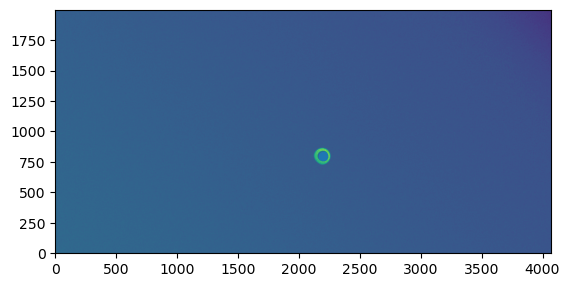

In [278]:
plt.imshow(exposure.image.array, origin='lower')
plt.scatter(taskOut.donutCatalog['centroid_x'], taskOut.donutCatalog['centroid_y'])

Ok, so perhaps when using too low of a sigma for direct detection we're getting donuts detected twice due to low threshold for convolution peaks... In reality, we'll probably have more than one donut per corner sensor, so this shouldn't be an iussue ... 

In [342]:
I get the same even with 3 sigma detection! 

In [387]:



config = GenerateDonutDirectDetectTaskConfig()
#config.measurementTask.nPixMinDetection = 5 # instead of 10
config.measurementTask.nSigmaDetection = 3
config.donutSelector.useCustomMagLimit = True
task = GenerateDonutDirectDetectTask(config=config)


# iterate over all moon illumination levels...

illumination_dic = {0:"default, 0 perc, 105 deg, 9pm local, am=1.35 (alt 47.8 deg)", 
                   1:"100 perc, 54 deg, 3:26 am local, am=1.16 (meridian)",
                   2: "42 perc, 37 deg, 4:48 am local, am=1.16 (meridian)",
                   3: "47 perc, 140 deg, 00:10 am local, am=2.0 (alt 30 deg)}",
                   4: "0 perc, 140 deg, 02:26 local, am=1.16 (meridian) "
                   }
illum_cats = {}
illum_exps = {}
for idx in range(5):
    img_dir = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}/"
    path_to_repo = os.path.join(img_dir, 'imsimData')
    butler = dafButler.Butler(path_to_repo)
    dataRefs = butler.registry.queryDatasets('postISRCCD', collections = ['ts_imsim_1000']).expanded()
    exps = {}
    for ref in dataRefs:
        print(ref)
        exps[ref.dataId.detector.id] = butler.get('postISRCCD', dataId = ref.dataId,  collections = ['ts_imsim_1000'])
    illum_exps[idx] = exps 
    
    # iterate over all exposures, jsut to make sure that everything works 
    donutCatsDirect = {}
    for detId in exps.keys():
        taskOut = task.run(copy(exps[196]), camera)
        print(f'\n For {detId} we detected {len(taskOut.donutCatalog)}')
        donutCatsDirect[detId] = taskOut.donutCatalog
    illum_cats[idx]= donutCatsDirect

postISRCCD@{instrument: 'LSSTCam', detector: 204, exposure: 7023061901000, band: 'g', day_obs: 20230619, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=157291e1-14fc-4fc2-a0f7-2e02a7dfe3e1)
postISRCCD@{instrument: 'LSSTCam', detector: 196, exposure: 7023061901000, band: 'g', day_obs: 20230619, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=dcb92234-b570-4340-89a4-c4f4cdc2c0e9)
postISRCCD@{instrument: 'LSSTCam', detector: 203, exposure: 7023061901000, band: 'g', day_obs: 20230619, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=7d80401a-7f52-4b10-bbbf-76d667f08a11)
postISRCCD@{instrument: 'LSSTCam', detector: 192, exposure: 7023061901000, band: 'g', day_obs: 20230619, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=a5ecc3b3-ce4b-4c1f-bf12-ec671d3624c3)
postISRCCD@{instrument: 'LSSTCam', detector: 195, exposure: 7023061901000, band: 'g', day_obs: 20230619, group: '1000', physical

INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 204 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 196 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 203 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 192 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 195 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 200 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 199 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 191 we detected 1
postISRCCD@{instrument: 'LSSTCam', detector: 204, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=58838fd9-eb1c-465f-b0b4-64e294cca866)
postISRCCD@{instrument: 'LSSTCam', detector: 199, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=173c7240-03d7-40f7-a417-9f5df195fac9)
postISRCCD@{instrument: 'LSSTCam', detector: 203, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=bae58d5e-0cbe-4754-86dc-800a4387bc75)
postISRCCD@{instrument: 'LSSTCam', detector: 195, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=11cd0fdf-e2c3-4b44-938b-f4546233d910)
postISRCCD@{instrument: 'LSSTCam', detector: 192, exposure: 7022080901000, band: 'g', day_obs: 20220809,

INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 204 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 199 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 203 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 195 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 192 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 196 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 191 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 200 we detected 1
postISRCCD@{instrument: 'LSSTCam', detector: 192, exposure: 7022071901000, band: 'g', day_obs: 20220719, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=cea8afb6-ddaa-47d0-8f6c-6b2c5df9fdb2)
postISRCCD@{instrument: 'LSSTCam', detector: 191, exposure: 7022071901000, band: 'g', day_obs: 20220719, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=e8a72cba-bc2b-4ee8-9eb2-d7675797a202)
postISRCCD@{instrument: 'LSSTCam', detector: 199, exposure: 7022071901000, band: 'g', day_obs: 20220719, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=9412e0d0-391e-41f5-b9df-e4523b7a3b1f)
postISRCCD@{instrument: 'LSSTCam', detector: 196, exposure: 7022071901000, band: 'g', day_obs: 20220719, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=a451131a-4616-462f-9337-445368377efe)
postISRCCD@{instrument: 'LSSTCam', detector: 204, exposure: 7022071901000, band: 'g', day_obs: 20220719,

INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 192 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 191 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 199 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 196 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 204 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 195 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 203 we detected 1


INFO:lsst.generateDonutDirectDetectTask.measurementTask:Found 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask.measurementTask:Measured 1 of 1 sources in exposure
INFO:lsst.generateDonutDirectDetectTask:Running Donut Selector
INFO:lsst.generateDonutDirectDetectTask.donutSelector:Selected 1/1 references



 For 200 we detected 1


FileNotFoundError: Config location file:///sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_3/imsimData does not exist. (given '/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_3/imsimData' and known aliases: /repo/ops-rehearsal-3-prep.sasquatch_dev, embargo_new, /repo/ops-rehearsal-3-prep, ops-rehearsal-3-prep, /repo/ops-rehearsal-3-prep+sasquatch_dev, /repo/embargo+sasquatch_dev, LATISS, /repo/embargo_new, embargo_or4+sasquatch_dev, embargo_new+sasquatch_dev, /repo/oga, /repo/dc2+sasquatch_dev, /repo/tts, /repo/main+sasquatch_dev, /repo/embargo_old.sasquatch_dev, /repo/dc2, /repo/ir2, embargo_old+sasquatch_dev, /repo/embargo_old+sasquatch_dev, embargo, /repo/main.sasquatch_dev, embargo_or4, LSSTCam, embargo_or4.sasquatch_dev, /repo/embargo_new+sasquatch_dev, embargo_old, /repo/hsc-temp, embargo_new.sasquatch_dev, /repo/bts, /repo/embargo, LSSTComCam, /repo/ucd, embargo_old.sasquatch_dev, /repo/aos_imsim, /repo/embargo.sasquatch_dev, /repo/main, /repo/embargo_new.sasquatch_dev, /repo/embargo_old)

In [356]:
taskOut.donutCatalog

,coord_ra,coord_dec,centroid_x,centroid_y,detector,source_flux,blend_centroid_x,blend_centroid_y
0,6.262876,0.022329,1826.071119,1172.085283,R04_SW1,6.360752e+06,[],[]


ok, so all donuts are there! Why do we not get any selected? 

Look at donut catalogs:

In [390]:
dataRefs = butler.registry.queryDatasets('donutCatalog', collections = ['ts_imsim_1000']).expanded()
donutCats = {}
for ref in dataRefs:
    print(ref)
    donutCats[ref.dataId.detector.id] = butler.get('donutCatalog', dataId=ref.dataId,  collections = ['ts_imsim_1000'])

donutCatalog@{instrument: 'LSSTCam', detector: 192, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=1bec2abb-309b-4d3b-9749-91f950ff6205)
donutCatalog@{instrument: 'LSSTCam', detector: 199, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=8636f360-0ed5-4cd0-9c1d-b2520d6d832a)
donutCatalog@{instrument: 'LSSTCam', detector: 204, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=f12a45c5-2fb1-424e-af79-edfa3ed70a64)
donutCatalog@{instrument: 'LSSTCam', detector: 191, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=c05781f7-cfe0-4e96-91d2-6990b18aa5b4)
donutCatalog@{instrument: 'LSSTCam', detector: 196, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=c51d117c-b239-4c26-87b4

In [392]:
donutCats[200]


,coord_ra,coord_dec,centroid_x,centroid_y,source_flux,blend_centroid_x,blend_centroid_y,detector
0,0.020357,-0.02227,1685.074557,1325.523446,3.630781e+06,[],[],R40_SW1


In [391]:
for detId in donutCats.keys():
    print(detId, len(donutCats[detId]))

192 1
199 1
204 1
191 1
196 1
195 1
203 1
200 1


ok, so all donut catalogs have at least one donut! So why am I getting the error? 

Print location of each donut from the catalog 

Figures below show that all donut catalog locations are off. How about the instance catalog created by imsim? 

In [283]:
from astropy.table import Table
path_inst_cat  = os.path.join(img_dir, 'sky_info.txt')
inst_cat =  Table.read(path_inst_cat, format='ascii')

In [176]:
inst_cat

Id,Ra,Dec,Mag
int64,float64,float64,float64
0,358.858111,-1.17363,15.0
1,358.729011,-1.171809,15.0
2,358.82637,1.141889,15.0
3,358.828191,1.270989,15.0
4,1.17363,-1.141889,15.0
5,1.171809,-1.270989,15.0
6,1.141889,1.17363,15.0
7,1.270989,1.171809,15.0


In [178]:
np.rad2deg(donutCats[detId]['coord_ra'])

0    1.171809
Name: coord_ra, dtype: float64

In [179]:
np.rad2deg(donutCats[detId]['coord_dec'])

0   -1.270989
Name: coord_dec, dtype: float64

Using the WCS, convert the inst_cat to px coords and overplot:

In [180]:
wcs = exp.getWcs()
x,y = wcs.skyToPixelArray(donutCats[detId]['coord_ra'],donutCats[detId]['coord_dec'],degrees=False)
    

In [181]:
x

array([1683.16889092])

In [182]:
y

array([1327.3966969])

In [183]:
wcs.skyToPixelArray?

Signature: wcs.skyToPixelArray(ra, dec, degrees=False)
Docstring:
Convert numpy array sky (ra, dec) positions to numpy array
pixels (x, y).

Parameters
----------
ra : `np.ndarray`
    Array of Right Ascension.  Units are radians unless
    degrees=True.
dec : `np.ndarray`
    Array of Declination.  Units are radians unless
    degrees=True.
degrees : `bool`, optional
    Input ra, dec arrays are degrees if True.

Returns
-------
x : `np.ndarray`
    Array of x values.
y : `np.ndarray`
    Array of y values.
File:      /sdf/group/rubin/sw/conda/envs/lsst-scipipe-9.0.0/share/eups/Linux64/afw/g3bc1096a96+da0d0eec6b/python/lsst/afw/geom/skyWcs.py
Type:      method

In [195]:
np.sort(list(exps.keys()))

array([191, 192, 195, 196, 199, 200, 203, 204])

donutCatalog@{instrument: 'LSSTCam', detector: 196, visit: 7023061901000, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=c8c43219-3274-48af-8d0c-a8141dea623d)
donutCatalog@{instrument: 'LSSTCam', detector: 203, visit: 7023061901000, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=fec1001c-726e-4363-ad9b-9d986d2a1857)
donutCatalog@{instrument: 'LSSTCam', detector: 195, visit: 7023061901000, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=bc872035-dc7f-4ff6-a67f-4f580ea746c4)
donutCatalog@{instrument: 'LSSTCam', detector: 192, visit: 7023061901000, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=c7c7c6d0-0d09-40c9-9ae3-db4c69019f96)
donutCatalog@{instrument: 'LSSTCam', detector: 200, visit: 7023061901000, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1000 id=14813f37-03dd-4857-a768

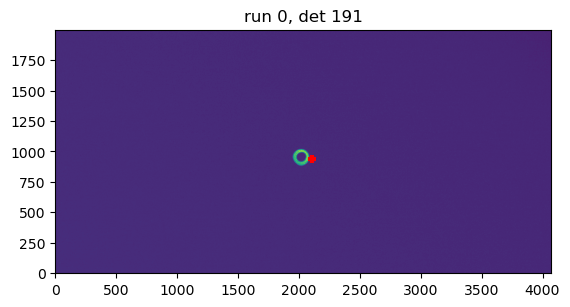

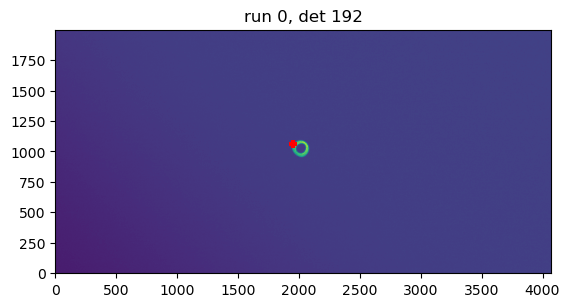

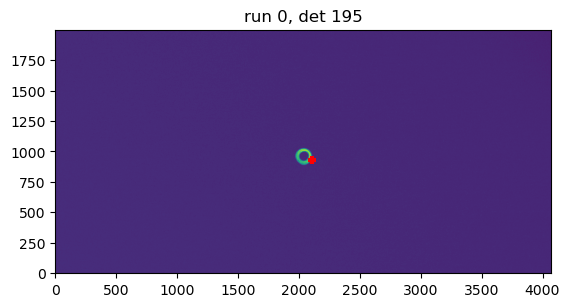

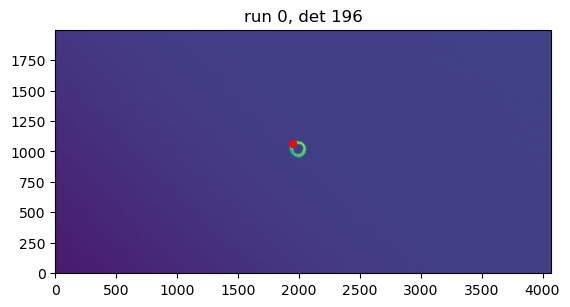

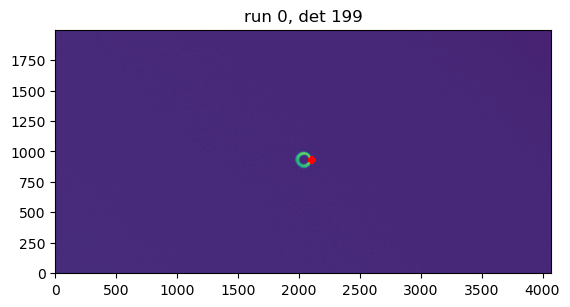

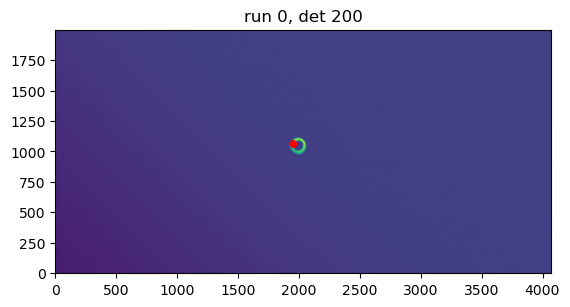

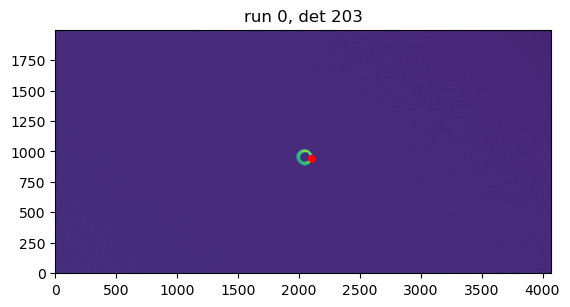

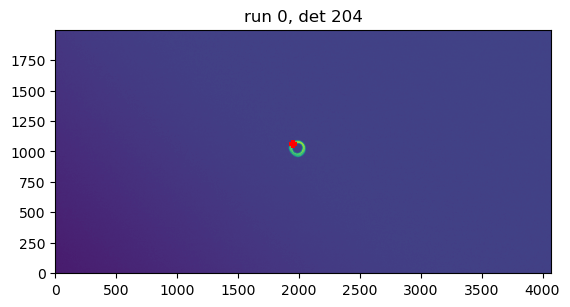

In [138]:
idx = 0
repo_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}/imsimData/' 
butler = Butler(repo_dir)
dataRefs = butler.registry.queryDatasets('donutCatalog', collections = ['ts_imsim_1000']).expanded()
donutCats = {}
exps = {}
for ref in dataRefs:
    print(ref)
    detId = ref.dataId.detector.id
    expId = ref.dataId.visit.id
    donutCats[detId] = butler.get('donutCatalog', dataId=ref.dataId,  collections = ['ts_imsim_1000'])
    #if detId == 191:
    dataId = {'instrument': 'LSSTCam', 'detector': detId, 'visit': expId,'exposure': expId,}
    exps[detId] =  butler.get('postISRCCD', dataId=dataId, collections=['ts_imsim_1000'])

i=0
for detId in np.sort(list(exps.keys())):
    exp = exps[detId]
    fig = plt.figure()
    plt.imshow(exp.image.array, origin='lower')
    plt.scatter(donutCats[detId]['centroid_x'], donutCats[detId]['centroid_y'], marker='+', 
                lw=3,c='red', )

    #wcs = exp.getWcs()
    #x1,y1 = wcs.skyToPixelArray(donutCats[detId]['coord_ra'],donutCats[detId]['coord_dec'],degrees=False)
    #x2,y2 = wcs.skyToPixelArray(inst_cat['Ra'][i], inst_cat['Dec'][i], degrees=True )
    #plt.scatter(x1,y1,marker='o', facecolors="None", edgecolors="orange", lw=2,s=160)
    #plt.scatter(x2,y2,marker='o', facecolors="None", edgecolors="brown", lw=2,s=130)
    plt.title(f'run {idx}, det {detId}')
    i += 1 

Plot just one corner, but for different MJDs; each will have different exposure number as it's on a different day:

In [65]:
ref.dataId.exposure.id

7023061901000

In [67]:


exp_191 = {}
cat_191 = {}
for idx in range(3):
    img_dir = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}/"
    path_to_repo = os.path.join(img_dir, 'imsimData')
    butler = dafButler.Butler(path_to_repo)
    dataRefs = butler.registry.queryDatasets('postISRCCD', collections = ['ts_imsim_1000']).expanded()
    for ref in dataRefs:
        detId = ref.dataId.detector.id
        expId = ref.dataId.exposure.id
        dataId = {'instrument': 'LSSTCam', 'detector': detId, 'visit': expId,'exposure': expId,}
        if detId == 191:
            print(ref)
            exp_191[idx] =  butler.get('postISRCCD', dataId=dataId, collections=['ts_imsim_1000'])
            cat_191[idx] =  butler.get('donutCatalog', dataId=dataId, collections=['ts_imsim_1000'])



postISRCCD@{instrument: 'LSSTCam', detector: 191, exposure: 7023061901000, band: 'g', day_obs: 20230619, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=52a0c54a-abda-4171-9ba8-9432bd90c80c)
postISRCCD@{instrument: 'LSSTCam', detector: 191, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=1bdbf5b3-87b4-450c-89d3-9828b0fe8442)
postISRCCD@{instrument: 'LSSTCam', detector: 191, exposure: 7022071901000, band: 'g', day_obs: 20220719, group: '1000', physical_filter: 'g_6'} [sc=Exposure] (run=ts_imsim_1000 id=e8a72cba-bc2b-4ee8-9eb2-d7675797a202)


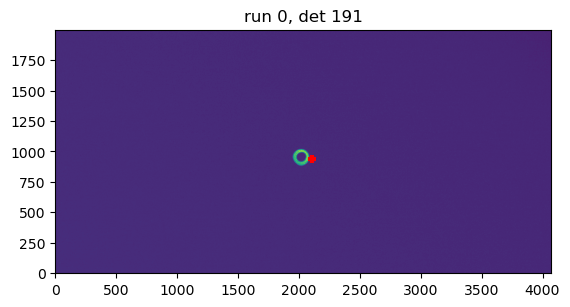

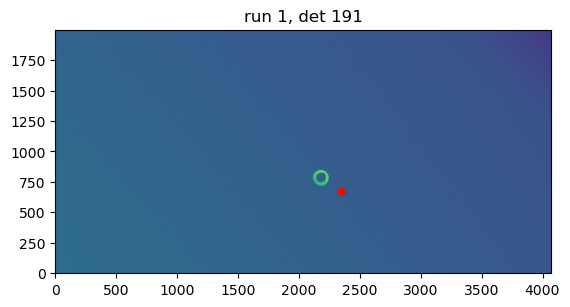

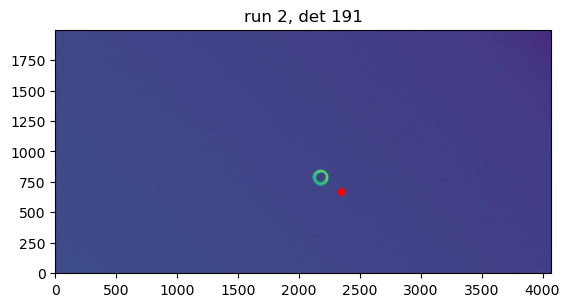

In [70]:
for idx in range(3):
    fig = plt.figure()
    plt.imshow(exp_191[idx].image.array, origin='lower')
    plt.scatter(cat_191[idx]['centroid_x'], cat_191[idx]['centroid_y'], marker='+', 
            lw=3,c='red', )

    #wcs = exp.getWcs()
    #x1,y1 = wcs.skyToPixelArray(donutCats[detId]['coord_ra'],donutCats[detId]['coord_dec'],degrees=False)
    #x2,y2 = wcs.skyToPixelArray(inst_cat['Ra'][i], inst_cat['Dec'][i], degrees=True )
    #plt.scatter(x1,y1,marker='o', facecolors="None", edgecolors="orange", lw=2,s=160)
    #plt.scatter(x2,y2,marker='o', facecolors="None", edgecolors="brown", lw=2,s=130)
    plt.title(f'run {idx}, det 191')

Take output of `imgClosedLoop_{idx}_direct` , which has idx in 1,2,3,4,5.  Run `generateDonutCatalogWcsTask` on it. 

Use just 


    description: generate donut catalogs
    instrument: lsst.obs.lsst.LsstCam
    tasks:
      generateDonutCatalogWcsTask:
        class: lsst.ts.wep.task.generateDonutCatalogWcsTask.GenerateDonutCatalogWcsTask

because I'm not sure what refcat would be used... 


Try 


       f"pipetask run -b {butler_root_path} "
                f"-i refcats,LSST{butler_inst_name}/raw/all,LSST{butler_inst_name}/calib/unbounded "
                f"--instrument lsst.obs.lsst.Lsst{butler_inst_name} "
                f"--register-dataset-types --output-run ts_imsim_{seq_num} -p {pipeline_yaml_path} -d "
                f'"visit.seq_num IN ({seq_num})" -j {num_pro}'
(from https://github.com/lsst-ts/ts_imsim/blob/926bdb5e7dc905009411276d2e0076d1fc8f5e3d/python/lsst/ts/imsim/closed_loop_task.py#L869  ) 



Confirm that a single exposure is there for 191:

In [74]:
exp_191 = {}
cat_direct_191 = {}
for idx in range(1,6):
    img_dir = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct/"
    path_to_repo = os.path.join(img_dir, 'imsimData')
    butler = dafButler.Butler(path_to_repo)
    dataRefs = butler.registry.queryDatasets('postISRCCD', collections = ['ts_imsim_1000']).expanded()
    for ref in dataRefs:
        detId = ref.dataId.detector.id
        expId = ref.dataId.exposure.id
        if detId == 191:
            dataId = {'instrument': 'LSSTCam', 'detector': detId, 'visit': expId,'exposure': expId,}
            exp_191[idx] =  butler.get('postISRCCD', dataId=dataId, collections=['ts_imsim_1000'])
            cat_direct_191[idx] = butler.get('donutCatalog', dataId=dataId, collections=['ts_imsim_1000'])

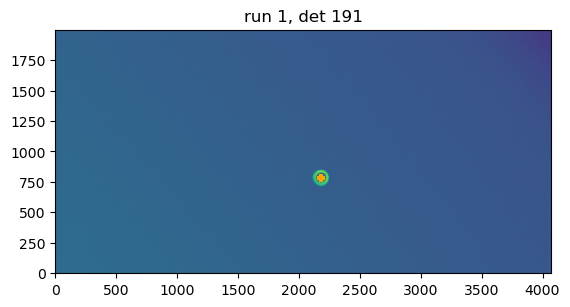

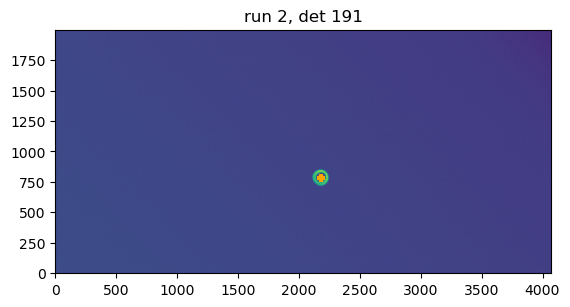

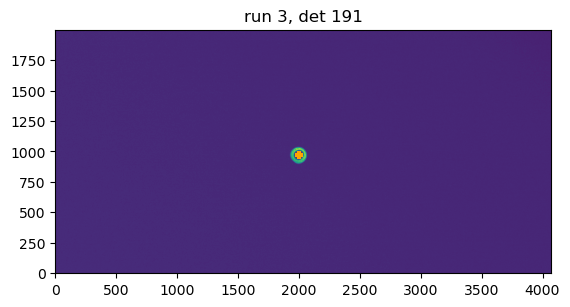

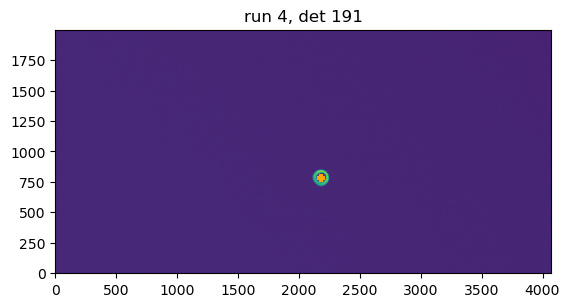

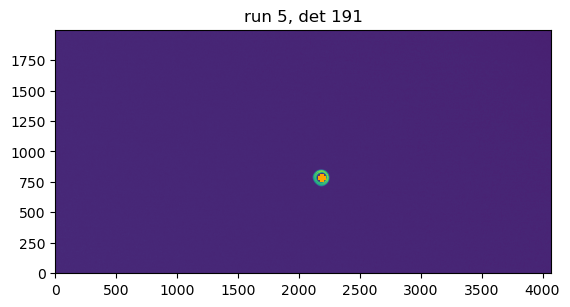

In [75]:
for idx in range(1,6):
    fig = plt.figure()
    plt.imshow(exp_191[idx].image.array, origin='lower')
    plt.scatter(cat_direct_191[idx]['centroid_x'], cat_direct_191[idx]['centroid_y'], marker='+', 
            lw=3,c='orange', )
    plt.title(f'run {idx}, det 191')

This also illustrates different illumination levels - plot a cross section given `centroid_x` 

In [97]:

illumination_dic = {0:"def:0 perc, 105 deg, 9pm local, am=1.35 (alt 47.8 deg)", 
                   1:"100 perc, 54 deg, 3:26 am local, am=1.16 (meridian)",
                   2: "42 perc, 37 deg, 4:48 am local, am=1.16 (meridian)",
                   3: "47 perc, 140 deg, 00:10 am local, am=2.0 (alt 30 deg)}",
                   4: "0 perc, 140 deg, 02:26 local, am=1.16 (meridian) ",
                   5: "1 perc, 140 deg+, 1:36 am am=1.16 (meridian)"}

In [98]:
s = illumination_dic[0]

In [99]:
s.split(',')

['def:0 perc', ' 105 deg', ' 9pm local', ' am=1.35 (alt 47.8 deg)']

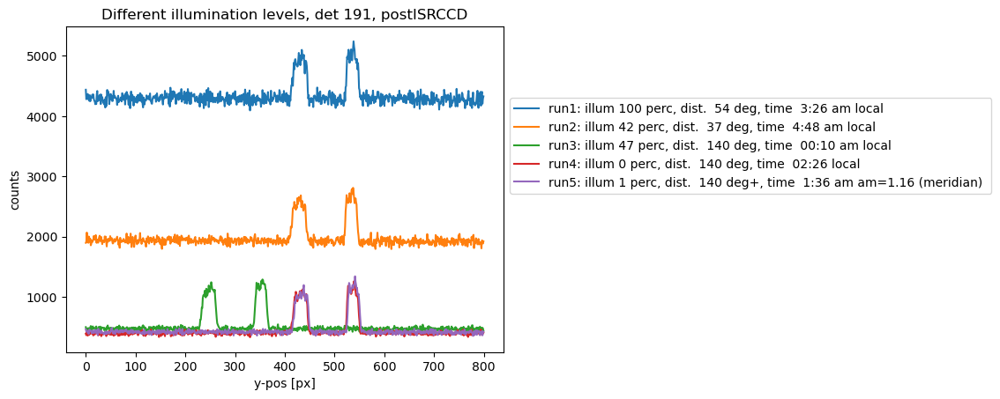

In [106]:
fig = plt.figure()
for idx in range(1,6):  
    x = int(cat_direct_191[idx]['centroid_x'][0])
    y = int(cat_direct_191[idx]['centroid_y'][0])
    s = illumination_dic[idx].split(',')
    plt.plot(exp_191[idx].image.array[y,1700:2500], 
             label=f"run{idx}: illum {s[0]}, dist. {s[1]}, time {s[2]} ")
    plt.xlabel('y-pos [px]')
    plt.ylabel('counts')
    plt.title(f'Different illumination levels, det 191, postISRCCD')
plt.legend(bbox_to_anchor=[1,0.8])

Run WCS as a pipetask for each of these donuts:

In [118]:
idx=1
img_dir = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct_long_grid/"
butler_root_path = os.path.join(img_dir, 'imsimData')
butler = Butler(butler_root_path)

In [125]:
dataRefs = butler.registry.queryDatasets('postISRCCD', collections=['ts_imsim_1000'], 
           where="instrument = 'LSSTCam' and exposure.seq_num = 1000 and detector.id = 191").expanded()
for ref in dataRefs:
    print(ref.dataId)

{instrument: 'LSSTCam', detector: 191, exposure: 7022080901000, band: 'g', day_obs: 20220809, group: '1000', physical_filter: 'g_6'}


In [126]:
from lsst.ts.wep.utils import runProgram
butler_inst_name='Cam'
seq_num = '1000'
output = f'ts_imsim_{seq_num}_wcs_191'
num_pro = 6
pipeline_yaml_path = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/lsstPipelineWcsOnly.yaml"
for idx in range(1,6):
    img_dir = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct_long_grid/"
    butler_root_path = os.path.join(img_dir, 'imsimData')
    #butler = dafButler.Butler(path_to_repo)
    
    cmd = f"pipetask run -b {butler_root_path} "+\
                f"-i refcats,LSST{butler_inst_name}/calib/unbounded,ts_imsim_{seq_num} "+\
                f"--instrument lsst.obs.lsst.Lsst{butler_inst_name} "+\
                f"--register-dataset-types --output-run {output} -p {pipeline_yaml_path} -d "+\
                f'"visit.seq_num IN ({seq_num}) and detector.id = 191" -j {num_pro}'
    print(cmd, '\n')
    
    runProgram(cmd)

pipetask run -b /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_1_direct_long_grid/imsimData -i refcats,LSSTCam/calib/unbounded,ts_imsim_1000 --instrument lsst.obs.lsst.LsstCam --register-dataset-types --output-run ts_imsim_1000_wcs_191 -p /sdf/group/rubin/shared/scichris/DM-41460_moon/lsstPipelineWcsOnly.yaml -d "visit.seq_num IN (1000) and detector.id = 191" -j 6 



lsst.pipe.base.quantum_graph_builder INFO: Processing pipeline subgraph 1 of 1 with 1 task(s).
lsst.pipe.base.quantum_graph_builder INFO: Iterating over query results to associate quanta with datasets.
lsst.pipe.base.quantum_graph_builder INFO: Initial bipartite graph has 1 quanta, 6 dataset nodes, and 4 edges from 1 query row(s).
lsst.pipe.base.quantum_graph_builder INFO: Generated 1 quantum for task generateDonutCatalogWcsTask.
lsst.ctrl.mpexec.cmdLineFwk INFO: QuantumGraph contains 1 quantum for 1 task, graph ID: '1727976671.476831-86575'
Quanta            Tasks           
------ ---------------------------
     1 generateDonutCatalogWcsTask
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Preparing execution of quantum for label=generateDonutCatalogWcsTask dataId={instrument: 'LSSTCam', detector: 191, visit: 7022080901000, band: 'g', day_obs: 20220809, physical_filter: 'g_6'}.
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Constructing task and executing quantum for label=generateDonutCa

pipetask run -b /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_2_direct_long_grid/imsimData -i refcats,LSSTCam/calib/unbounded,ts_imsim_1000 --instrument lsst.obs.lsst.LsstCam --register-dataset-types --output-run ts_imsim_1000_wcs_191 -p /sdf/group/rubin/shared/scichris/DM-41460_moon/lsstPipelineWcsOnly.yaml -d "visit.seq_num IN (1000) and detector.id = 191" -j 6 



lsst.pipe.base.quantum_graph_builder INFO: Processing pipeline subgraph 1 of 1 with 1 task(s).
lsst.pipe.base.quantum_graph_builder INFO: Iterating over query results to associate quanta with datasets.
lsst.pipe.base.quantum_graph_builder INFO: Initial bipartite graph has 1 quanta, 6 dataset nodes, and 4 edges from 1 query row(s).
lsst.pipe.base.quantum_graph_builder INFO: Generated 1 quantum for task generateDonutCatalogWcsTask.
lsst.ctrl.mpexec.cmdLineFwk INFO: QuantumGraph contains 1 quantum for 1 task, graph ID: '1727976694.355846-86594'
Quanta            Tasks           
------ ---------------------------
     1 generateDonutCatalogWcsTask
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Preparing execution of quantum for label=generateDonutCatalogWcsTask dataId={instrument: 'LSSTCam', detector: 191, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'}.
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Constructing task and executing quantum for label=generateDonutCa

pipetask run -b /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_3_direct_long_grid/imsimData -i refcats,LSSTCam/calib/unbounded,ts_imsim_1000 --instrument lsst.obs.lsst.LsstCam --register-dataset-types --output-run ts_imsim_1000_wcs_191 -p /sdf/group/rubin/shared/scichris/DM-41460_moon/lsstPipelineWcsOnly.yaml -d "visit.seq_num IN (1000) and detector.id = 191" -j 6 



lsst.pipe.base.quantum_graph_builder INFO: Processing pipeline subgraph 1 of 1 with 1 task(s).
lsst.pipe.base.quantum_graph_builder INFO: Iterating over query results to associate quanta with datasets.
lsst.pipe.base.quantum_graph_builder INFO: Initial bipartite graph has 1 quanta, 6 dataset nodes, and 4 edges from 1 query row(s).
lsst.pipe.base.quantum_graph_builder INFO: Generated 1 quantum for task generateDonutCatalogWcsTask.
lsst.ctrl.mpexec.cmdLineFwk INFO: QuantumGraph contains 1 quantum for 1 task, graph ID: '1727976718.8597143-86607'
Quanta            Tasks           
------ ---------------------------
     1 generateDonutCatalogWcsTask
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Preparing execution of quantum for label=generateDonutCatalogWcsTask dataId={instrument: 'LSSTCam', detector: 191, visit: 7022080301000, band: 'g', day_obs: 20220803, physical_filter: 'g_6'}.
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Constructing task and executing quantum for label=generateDonutC

pipetask run -b /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_4_direct_long_grid/imsimData -i refcats,LSSTCam/calib/unbounded,ts_imsim_1000 --instrument lsst.obs.lsst.LsstCam --register-dataset-types --output-run ts_imsim_1000_wcs_191 -p /sdf/group/rubin/shared/scichris/DM-41460_moon/lsstPipelineWcsOnly.yaml -d "visit.seq_num IN (1000) and detector.id = 191" -j 6 



lsst.pipe.base.quantum_graph_builder INFO: Processing pipeline subgraph 1 of 1 with 1 task(s).
lsst.pipe.base.quantum_graph_builder INFO: Iterating over query results to associate quanta with datasets.
lsst.pipe.base.quantum_graph_builder INFO: Initial bipartite graph has 1 quanta, 6 dataset nodes, and 4 edges from 1 query row(s).
lsst.pipe.base.quantum_graph_builder INFO: Generated 1 quantum for task generateDonutCatalogWcsTask.
lsst.ctrl.mpexec.cmdLineFwk INFO: QuantumGraph contains 1 quantum for 1 task, graph ID: '1727976743.500179-86621'
Quanta            Tasks           
------ ---------------------------
     1 generateDonutCatalogWcsTask
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Preparing execution of quantum for label=generateDonutCatalogWcsTask dataId={instrument: 'LSSTCam', detector: 191, visit: 7022082401000, band: 'g', day_obs: 20220824, physical_filter: 'g_6'}.
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Constructing task and executing quantum for label=generateDonutCa

pipetask run -b /sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_5_direct_long_grid/imsimData -i refcats,LSSTCam/calib/unbounded,ts_imsim_1000 --instrument lsst.obs.lsst.LsstCam --register-dataset-types --output-run ts_imsim_1000_wcs_191 -p /sdf/group/rubin/shared/scichris/DM-41460_moon/lsstPipelineWcsOnly.yaml -d "visit.seq_num IN (1000) and detector.id = 191" -j 6 



lsst.pipe.base.quantum_graph_builder INFO: Processing pipeline subgraph 1 of 1 with 1 task(s).
lsst.pipe.base.quantum_graph_builder INFO: Iterating over query results to associate quanta with datasets.
lsst.pipe.base.quantum_graph_builder INFO: Initial bipartite graph has 1 quanta, 6 dataset nodes, and 4 edges from 1 query row(s).
lsst.pipe.base.quantum_graph_builder INFO: Generated 1 quantum for task generateDonutCatalogWcsTask.
lsst.ctrl.mpexec.cmdLineFwk INFO: QuantumGraph contains 1 quantum for 1 task, graph ID: '1727976766.088374-86634'
Quanta            Tasks           
------ ---------------------------
     1 generateDonutCatalogWcsTask
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Preparing execution of quantum for label=generateDonutCatalogWcsTask dataId={instrument: 'LSSTCam', detector: 191, visit: 7022092101000, band: 'g', day_obs: 20220921, physical_filter: 'g_6'}.
lsst.ctrl.mpexec.singleQuantumExecutor INFO: Constructing task and executing quantum for label=generateDonutCa

In [ ]:
Plot the results: single donut per detector, one per MJD to illustrate.... 

In [132]:
ref.dataId.visit.kd

AttributeError: kd

In [133]:
cat_wcs_191 = {}
#output = 'ts_imsim_1000_wcs'
output = f'ts_imsim_1000_wcs_191'
for idx in range(1,6):
    #img_dir = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct/"
    img_dir = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct_long/"
    butler_root_path = os.path.join(img_dir, 'imsimData')
    dataRefs = butler.registry.queryDatasets('donutCatalog', 
                                             collections = [output]).expanded()
    # collect catalogs just for one detecvtor 
    for ref in dataRefs:
        detId = ref.dataId.detector.id
        expId = ref.dataId.visit.id
        if detId == 191:
            dataId = {'instrument': 'LSSTCam', 'detector': detId, 'visit': expId,'exposure': expId,}
            exp_191[idx] =  butler.get('postISRCCD', dataId=dataId, collections=['ts_imsim_1000'])
            cat_wcs_191[idx] = butler.get('donutCatalog', dataId=ref.dataId, collections=[output])


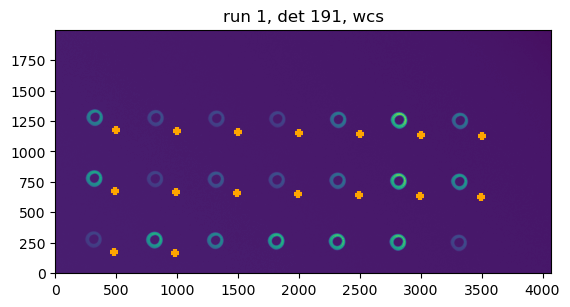

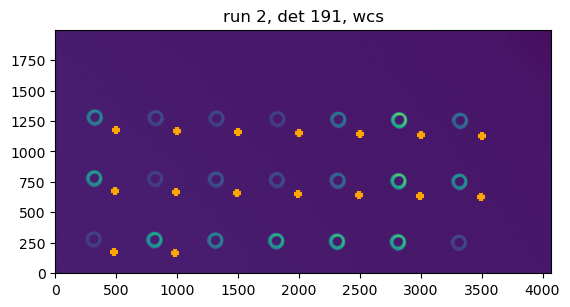

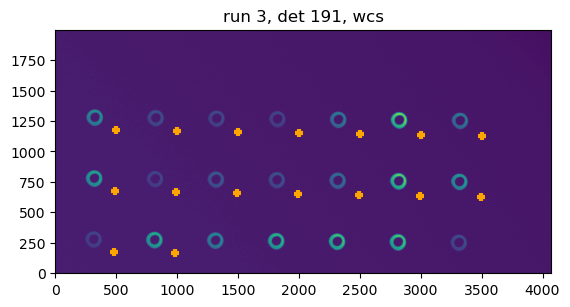

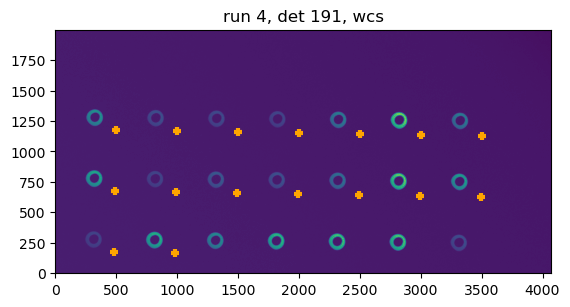

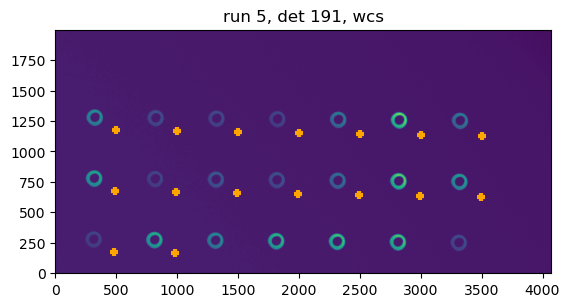

In [134]:
for idx in range(1,6):
    fig = plt.figure()
    plt.imshow(exp_191[idx].image.array, origin='lower')
    plt.scatter(cat_wcs_191[idx]['centroid_x'], cat_wcs_191[idx]['centroid_y'], marker='+', 
            lw=3,c='orange', )
    plt.title(f'run {idx}, det 191, wcs')

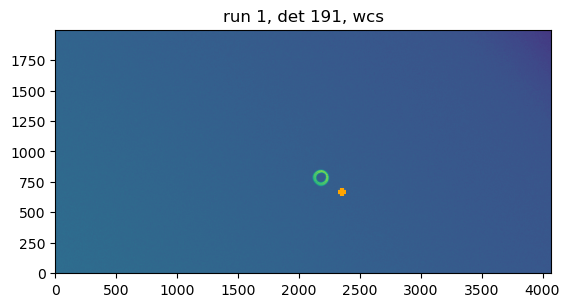

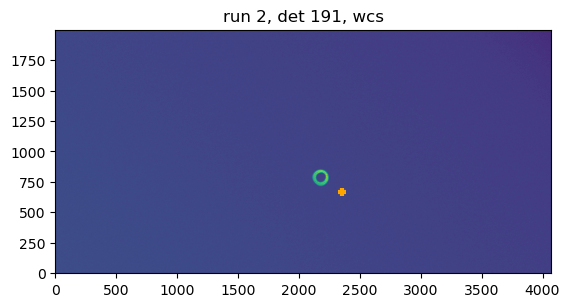

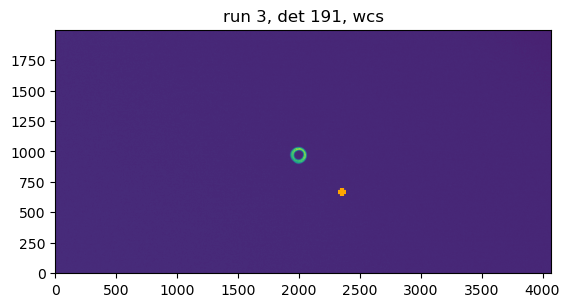

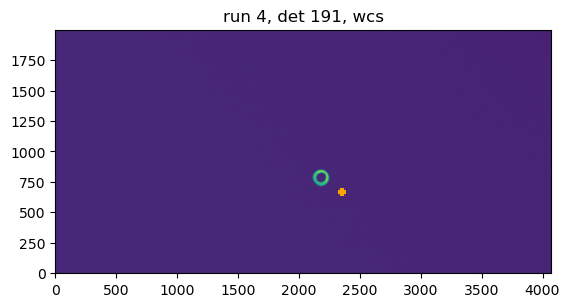

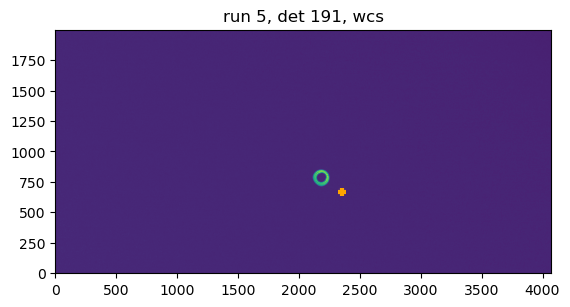

In [117]:
for idx in range(1,6):
    fig = plt.figure()
    plt.imshow(exp_191[idx].image.array, origin='lower')
    plt.scatter(cat_wcs_191[idx]['centroid_x'], cat_wcs_191[idx]['centroid_y'], marker='+', 
            lw=3,c='orange', )
    plt.title(f'run {idx}, det 191, wcs')

In [ ]:
Given that the donut grid ones were rotated by the parallactic angle, perhaps WCS task on these would work just fine (?) 

NEXT:   Try running WCS task as above, but for the grid simulations... 





## FAM

Plot the WCS location of donuts for FAM simulation. Given that the iterations succeeded, it must have worked... 

In [171]:
from lsst.daf.butler import Butler 
idx = 0
repo_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM/imsimData/' 
butler = Butler(repo_dir)

In [172]:
butler.registry.queryCollections()

['refcats',
 'LSSTCam/raw/all',
 'LSSTCam/calib',
 'LSSTCam/calib/unbounded',
 'LSSTCam/calib/curated/20240419T101118Z',
 'LSSTCam/calib/curated/20240419T101135Z',
 'LSSTCam/calib/curated/20240419T101216Z',
 'LSSTCam/calib/curated/20240419T101224Z',
 'LSSTCam/calib/curated/20240419T101219Z',
 'LSSTCam/calib/curated/20240419T101139Z',
 'LSSTCam/calib/curated/20240419T101322Z',
 'LSSTCam/calib/curated/20240419T101127Z',
 'LSSTCam/calib/curated/20240419T101145Z',
 'LSSTCam/calib/curated/20240419T101126Z',
 'LSSTCam/calib/curated/20240419T101338Z',
 'LSSTCam/calib/curated/20240419T101206Z',
 'LSSTCam/calib/curated/20240419T101331Z',
 'LSSTCam/calib/curated/20240419T101309Z',
 'LSSTCam/calib/curated/20240419T101326Z',
 'LSSTCam/calib/curated/20240419T101159Z',
 'LSSTCam/calib/curated/20240419T101341Z',
 'LSSTCam/calib/curated/20240419T101114Z',
 'LSSTCam/calib/curated/20240419T101343Z',
 'LSSTCam/calib/curated/20240419T101257Z',
 'LSSTCam/calib/curated/20240419T101339Z',
 'LSSTCam/calib/cur

In [173]:

dataRefs = butler.registry.queryDatasets('donutCatalog', collections = ['ts_imsim_1002']).expanded()
donutCats = {}
exps = {}
for ref in dataRefs:
    print(ref)

donutCatalog@{instrument: 'LSSTCam', detector: 175, visit: 7023061901001, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=ab17ecd6-301e-4f34-a9ae-eedac010ff0f)
donutCatalog@{instrument: 'LSSTCam', detector: 49, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=3fda97cf-79d6-47c0-97a0-d982831b13f1)
donutCatalog@{instrument: 'LSSTCam', detector: 67, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=a002f60e-7602-4a2e-bec1-708740fa7fcd)
donutCatalog@{instrument: 'LSSTCam', detector: 58, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=20394f9e-5873-48c2-a817-ed1b3caab90e)
donutCatalog@{instrument: 'LSSTCam', detector: 112, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=d8f33c2b-7365-4dfd-9fdf-83

This loads all postISRCCDs and all donuts. Shows the location of each star as believed by the WCS. Since each donut is at the center of each CCD,  plot only the region around each donut (not the donut stamp, as that is recentered etc.):

In [ ]:
idx = 0
repo_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM/imsimData/' 
collection = 'ts_imsim_1002'
butler = Butler(repo_dir)
dataRefs = butler.registry.queryDatasets('donutCatalog', collections = [collection]).expanded()

donutCats = {}
exps = {}
for ref in dataRefs:
    print(ref)
    detId = ref.dataId.detector.id
    expId = ref.dataId.visit.id
    donutCats[detId] = butler.get('donutCatalog', dataId=ref.dataId,  collections = [collection])
    #if detId == 191:
    dataId = {'instrument': 'LSSTCam', 'detector': detId, 'visit': expId,'exposure': expId,}
    exps[detId] =  butler.get('postISRCCD', dataId=dataId, collections=[collection])


/tmp/ipykernel_658/3478302265.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


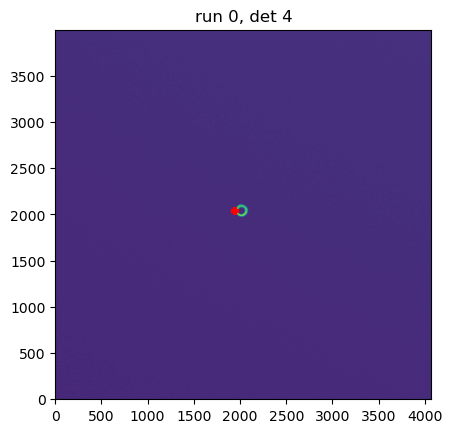

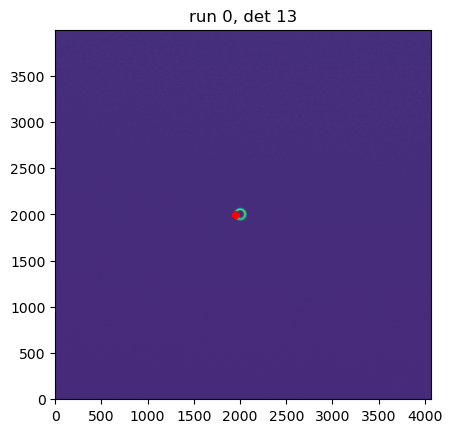

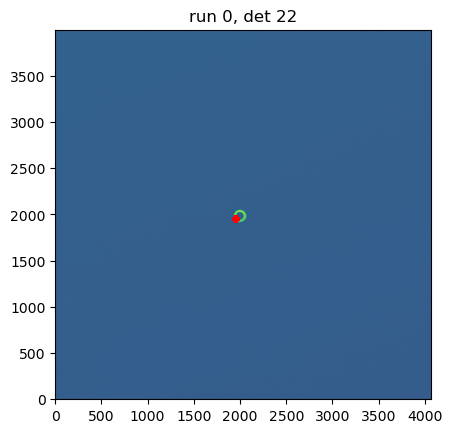

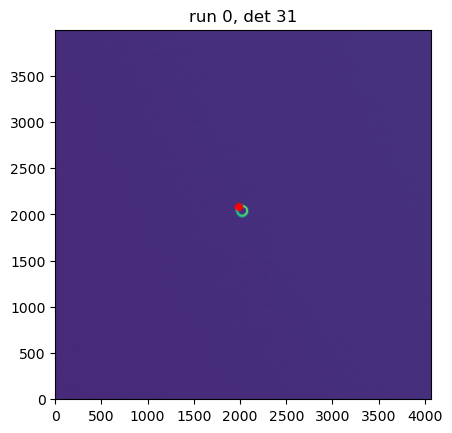

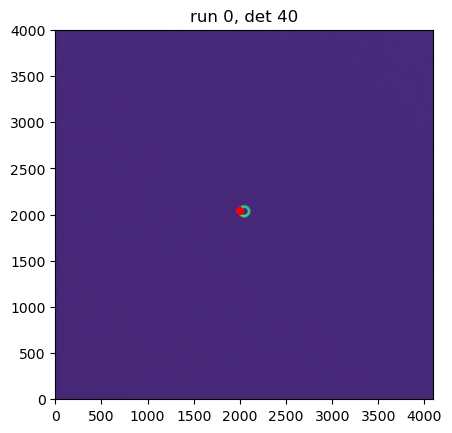

...

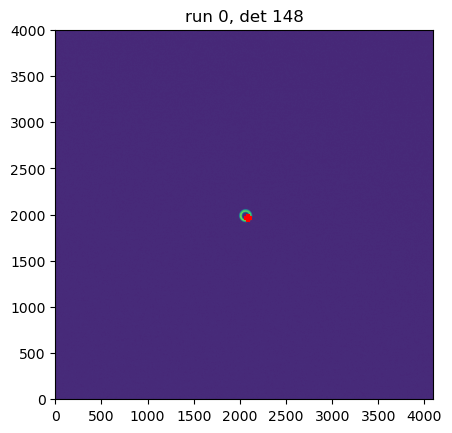

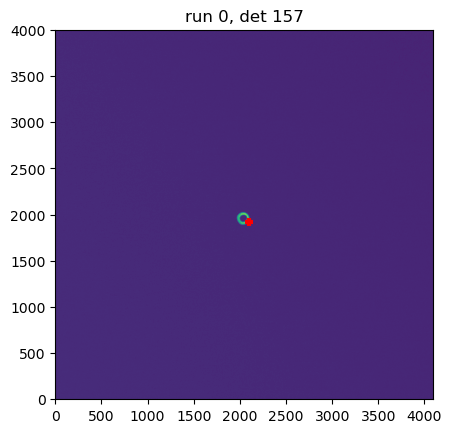

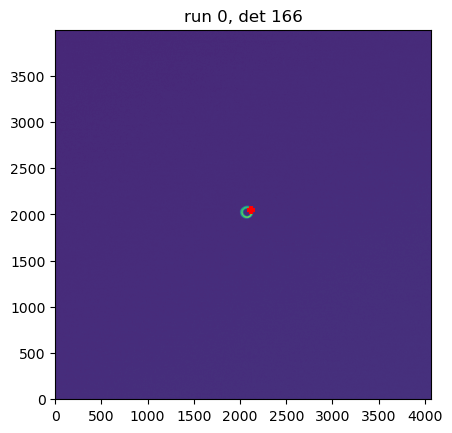

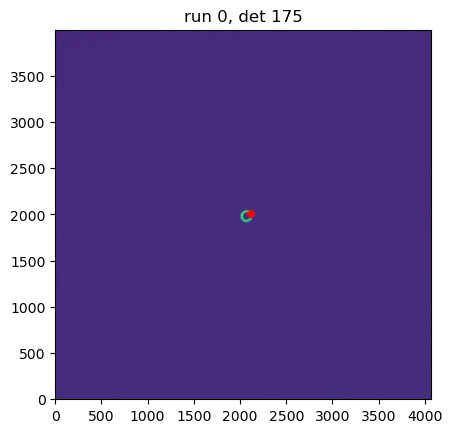

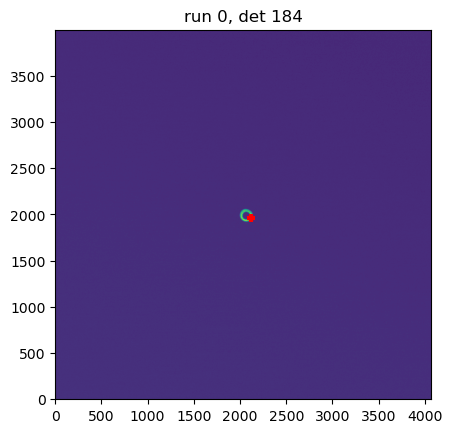

In [183]:

i=0
#xcen,ycen = 2000,2000
#w=100
for detId in np.sort(list(exps.keys())):
    exp = exps[detId]
    fig = plt.figure()
    d = exp.image.array
    #plt.imshow(d[xcen-w:xcen+w, ycen-w:ycen+w], 
    #           origin='lower')
    plt.imshow(d, origin='lower')
    # plt.scatter(donutCats[detId]['centroid_x']-xcen+w, donutCats[detId]['centroid_y']-ycen+w, marker='+', 
    #             lw=3,c='red', )
    plt.scatter(donutCats[detId]['centroid_x'], donutCats[detId]['centroid_y'], marker='+', 
                lw=3,c='red', )

    #wcs = exp.getWcs()
    #x1,y1 = wcs.skyToPixelArray(donutCats[detId]['coord_ra'],donutCats[detId]['coord_dec'],degrees=False)
    #x2,y2 = wcs.skyToPixelArray(inst_cat['Ra'][i], inst_cat['Dec'][i], degrees=True )
    #plt.scatter(x1,y1,marker='o', facecolors="None", edgecolors="orange", lw=2,s=160)
    #plt.scatter(x2,y2,marker='o', facecolors="None", edgecolors="brown", lw=2,s=130)
    plt.title(f'run {idx}, det {detId}')
    i += 1 

It would be really nice if I could plot these quickly in a way that shows their respective orientation... Is there a way to do this with `analysis_tools`? 

### 1) Use cameraGeomUtils   code from old LSST FAM simulation

In [185]:
import lsst.afw.display as afwDisplay
import lsst.afw.cameraGeom as cameraGeom
import lsst.afw.geom as afwGeom

In [186]:
path_cwd = '/home/s/scichris/link_to_scichris/link_to_ncsa_project_aos/'
afwDisplay.setDefaultBackend("matplotlib")
repo_dir = os.path.join(path_cwd, 'AOS/DM-28360/lsstCam/high/extra/9010121/DATA/')


In [188]:
os.listdir(repo_dir)

['gen3.sqlite3', 'butler.yaml', 'LSSTCam', 'run1']

In [189]:
# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )


In [190]:
dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

In [191]:
exposure = dataset.dataId["exposure"]
camera  = butler.get("camera", instrument=instrument, exposure=exposure)


In [195]:
import lsst.afw.cameraGeom.utils as cameraGeomUtils

In [200]:
dataType='postISRCCD'

In [202]:
image = cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True)

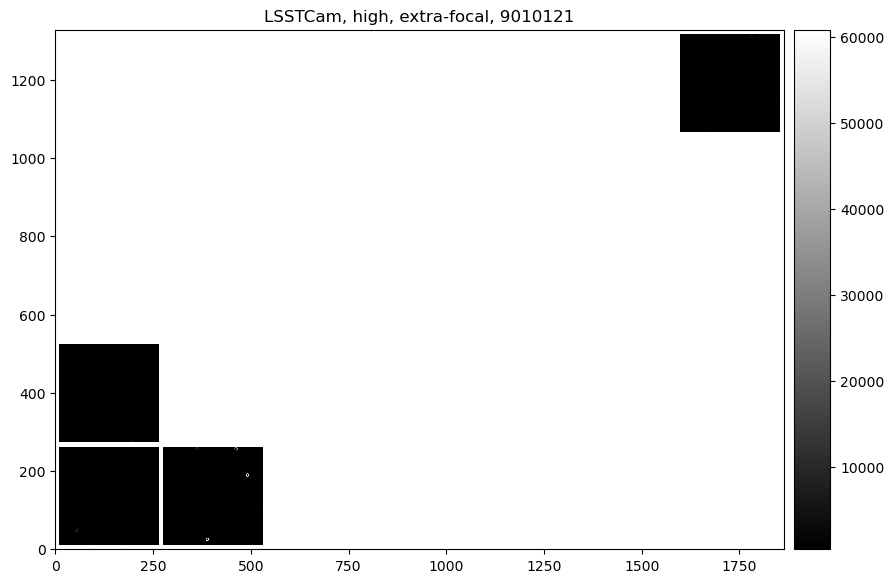

In [208]:
fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )
ax = fig.add_subplot(1, 1, 1)
disp = afwDisplay.Display(fig)
#detectorNameList = None
mos = cameraGeomUtils.showCamera(camera,
                             image,
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=False, title=f'{instrument}, high, extra-focal, 9010121' )
                             

In [ ]:
disp.setImageColormap('viridis')# if False else 'gray')
disp.scale('asinh', 'zscale', Q=2)
disp.mtv(mos)


In [207]:
# plot only few detectors:

detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10', 'R34_S20'] 

In [ ]:

disp.show_colorbar(False)
ax.axis("off")


fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)

disp.setImageColormap('viridis')# if False else 'gray')
disp.scale('asinh', 'zscale', Q=2)
disp.mtv(mos)



Now use this code on imgClosedLoop   simulation for FAM - is there a way to eg. plot the circle? Or does that have to be re-imnvented manually, like Josh's plots? 

I could get the X,Y just like Josh got below, but instead doing  `det.getCorners(FOCAL_PLANE)` which is in `mm`, 

putting these into four corners with `cameraGeom`: 

In [3]:
import os
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import matplotlib.pyplot as plt

from lsst.daf.butler import Butler 
from lsst.afw.cameraGeom import utils as cgUtils
from lsst.obs.lsst.cameraTransforms import LsstCameraTransforms
from lsst.obs.lsst.cameraTransforms import ampPixelToCcdPixel

import lsst.afw.cameraGeom as cameraGeom
import lsst.afw.geom as afwGeom

from lsst.afw.cameraGeom import FIELD_ANGLE, FOCAL_PLANE

In [288]:
butler = Butler("/repo/dc2", )

In [291]:
butler.registry.queryCollections('2.2i/runs/DP*')

['2.2i/runs/DP0.1/coadd/wfd/dr6/v1/u',
 '2.2i/runs/DP0.1/coadd/wfd/dr6/v1/grizy',
 '2.2i/runs/DP0.1/coadd/wfd/dr6/v1',
 '2.2i/runs/DP0.1/calexp/v1',
 '2.2i/runs/DP0.1']

We can see that the desired collection is there. 

NameError: name 'det' is not defined

In [305]:
from lsst.afw.cameraGeom import utils as cgUtils
from lsst.daf.butler import Butler 
butler = Butler("/repo/dc2",collections=['2.2i/runs/DP0.1'])
camera = butler.get('camera',instrument='LSSTCam-imSim')
#cgUtils.plotFocalPlane(camera)

Try out https://github.com/lsst/analysis_tools/tree/main/python/lsst/analysis/tools

In [301]:
det.getId()

188

In [3]:
from lsst.obs.lsst import LsstCam
camera = LsstCam.getCamera()

In [4]:
for det in camera:
    if 'SW' in det.getName() :
        print(det.getId())

191
192
195
196
199
200
203
204


In [22]:
left_xs = []
right_xs = []
bottom_ys = []
top_ys = []
for det in camera:
    corners = [(c.getX(), c.getY()) for c in det.getCorners(FOCAL_PLANE)]
    xcorners = [c.getX() for c in det.getCorners(FIELD_ANGLE)]
    ycorners = [c.getY() for c in det.getCorners(FIELD_ANGLE)]
    left_xs.append(min(xcorners))
    right_xs.append(max(xcorners))
    bottom_ys.append(min(ycorners))
    top_ys.append(max(ycorners))

In [13]:
min(left_xs)

-0.03069277676104021

In [14]:
max(left_xs)

0.026729989523293377

In [15]:
min(bottom_ys)

-0.030648309241516163

In [16]:
max(bottom_ys)

0.026775483248536378

In [21]:
max(right_xs)

0.030693781009582564

In [24]:
max(top_ys)

0.03064637441486585

In [25]:
total_width = abs(min(left_xs)) + max(right_xs)
total_height = abs(min(bottom_ys))+max(top_ys)



In [26]:
total_width

0.061386557770622775

In [27]:
total_height

0.061294683656382014

ok, they're almost exactly the same. 

In [34]:
import numpy as np
shift_left_xs = np.array(left_xs) + max(right_xs)

In [38]:
scaled_left_xs = shift_left_xs / total_width
print(min(scaled_left_xs), max(scaled_left_xs))

1.635942100068126e-05 0.9354453583705703


In [41]:
shift_bottom_ys = np.array(bottom_ys) + max(top_ys)
#shift_bottom_ys


In [42]:
scaled_bottom_ys = shift_bottom_ys / total_height

print(min(scaled_bottom_ys))

-3.1565978236536575e-05


In [43]:
print(max(scaled_bottom_ys))

0.9368162822294532


Let's try adding axes like that ... But store the quantities above in a table as rows so that I can select rows that only correspond to the actual detectors:

In [236]:
from lsst.obs.lsst import LsstCam
from astropy.table import Table
import numpy as np 

camera = LsstCam.getCamera()
left_xs = []
right_xs = []
bottom_ys = []
top_ys = []
detnames = []
detids = []
for det in camera:
    xcorners = [c.getX() for c in det.getCorners(FIELD_ANGLE)]
    ycorners = [c.getY() for c in det.getCorners(FIELD_ANGLE)]
    left_xs.append(min(xcorners))
    right_xs.append(max(xcorners))
    bottom_ys.append(min(ycorners))
    top_ys.append(max(ycorners))
    detnames.append(det.getName())
    detids.append(det.getId())
    
total_width = abs(min(left_xs)) + max(right_xs)
total_height = abs(min(bottom_ys))+max(top_ys)

x_widths =  np.array(right_xs) - np.array(left_xs)
y_heights= np.array(top_ys) - np.array(bottom_ys)
scaled_x_widths = x_widths / total_width
scaled_y_heights = y_heights / total_height

shift_left_xs = np.array(left_xs) + max(right_xs)
scaled_left_xs = shift_left_xs / total_width

shift_bottom_ys = np.array(bottom_ys) + max(top_ys)
scaled_bottom_ys = shift_bottom_ys / total_height


table = Table()
table['shift_left_xs'] = shift_left_xs
table['scaled_left_xs'] = scaled_left_xs
table['shift_bottom_ys'] = shift_bottom_ys
table['scaled_bottom_ys'] = scaled_bottom_ys 
table['scaled_x_widths'] = scaled_x_widths
table['scaled_y_heights'] = scaled_y_heights
table['detname'] = detnames
table['detid'] = detids


In [237]:
table

shift_left_xs,scaled_left_xs,shift_bottom_ys,scaled_bottom_ys,scaled_x_widths,scaled_y_heights,detname,detid
float64,float64,float64,float64,float64,float64,str7,int64
0.012319856106465594,0.20069305974933488,3.839339908402045e-06,6.263740473685098e-05,0.06429673261896059,0.06319161115211637,R01_S00,0
0.016412067508420593,0.2673560483672334,9.68768742923981e-07,1.580510225576656e-05,0.06430385025145667,0.06318470212293571,R01_S01,1
0.020505604593703295,0.3340406326467206,-9.469719244627195e-07,-1.5449495257556822e-05,0.06430503373372488,0.06317585520386762,R01_S02,2
0.012316436631466619,0.2006373557789029,0.004091724270066731,0.06675496186594153,0.06430170047048143,0.0632220167737841,R01_S10,3
0.016409422347300355,0.26731295813353567,0.004089257422112011,0.0667147161577077,0.06431072891854565,0.0632170615277024,R01_S11,4
0.02050372441346708,0.3340100041133007,0.004087611155095618,0.06668785792273219,0.06431384797576221,0.06321019201566744,R01_S12,5
0.012313601916152148,0.2005911776673192,0.00818210209166012,0.1334879569250897,0.06430473474181501,0.06324626006378604,R01_S20,6
0.01640722959864141,0.26727723779444873,0.008180030276227358,0.1334541560257429,0.06431565731206396,0.06324324070984073,R01_S21,7
0.020502165843999835,0.3339846146872789,0.00817864766583077,0.1334315992506017,0.0643206882941483,0.06323832386994252,R01_S22,8


In [62]:
table['detid'].data

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

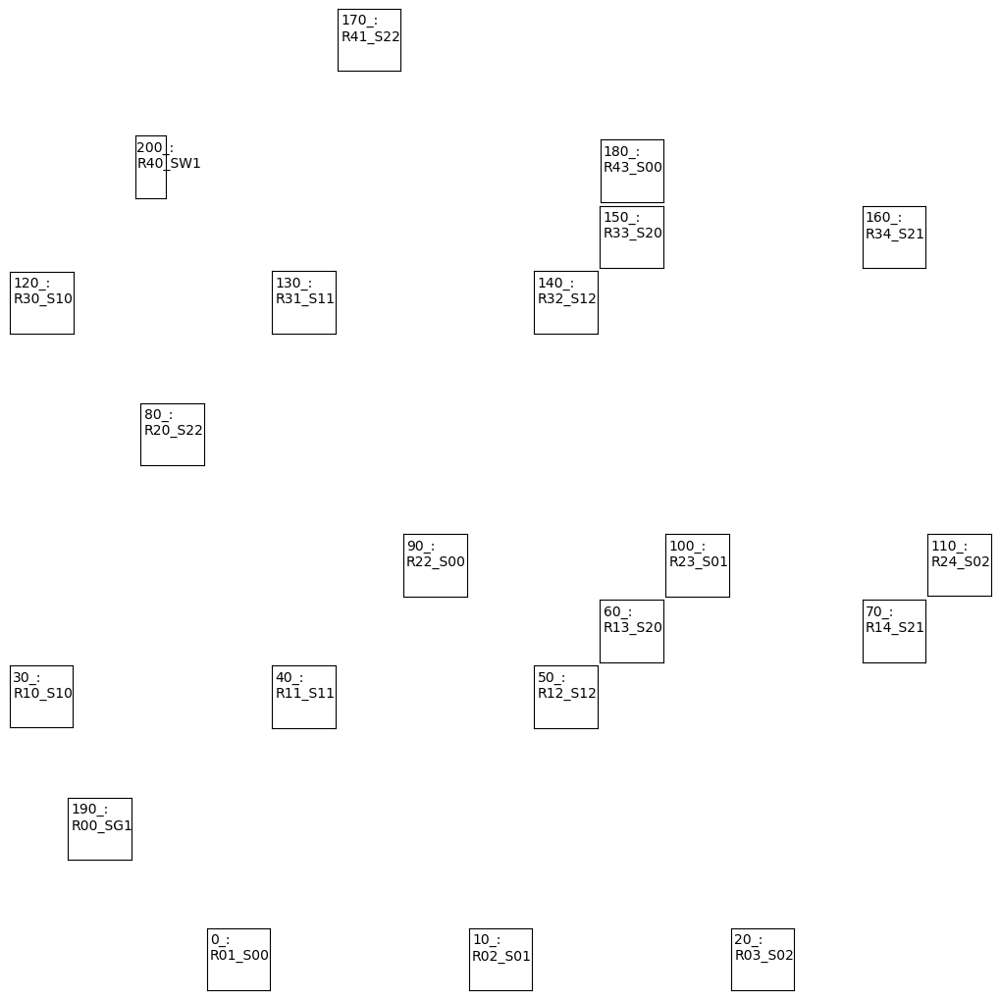

In [238]:
fig= plt.figure(figsize=(10,10))
for detid in table['detid'].data[::10]: # table[5,14,15,155, 200,201,202,203,204]:
    row = table[table['detid'] == detid]
    left = row['scaled_left_xs'].data[0]
    bottom = row['scaled_bottom_ys'].data[0]
    width = row['scaled_x_widths'].data[0]
    height = row['scaled_y_heights'].data[0]
    rect = [left, bottom, width, height]
    ax = fig.add_axes(rect)
    ax.set_xticks([])
    ax.set_yticks([])
    text = f"{row['detid'].data[0]}_:\n{row['detname'].data[0]}"
    ax.text(0.05,0.5, text)

Add few exposures:

#### butler.registry.queryCollections()

A single collection is used for both intra and extra-focal visits: 

In [190]:
dataRefs = butler.registry.queryDatasets('donutCatalog', collections = ['ts_imsim_1002'],
                                        where="instrument='LSSTCam' and detector.id = 76 and visit.seq_num = 1001").expanded()
for ref in dataRefs:
    print(ref)

donutCatalog@{instrument: 'LSSTCam', detector: 76, visit: 7022080901001, band: 'g', day_obs: 20220809, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=b9026ac6-d501-44c3-a13c-7fa1e840c228)


In [239]:
idx=0
repo_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM_direct/imsimData/' 
butler = Butler(repo_dir) 
collections = butler.registry.queryCollections()
for coll in collections:
    if coll.startswith('ts_imsim'):
        print(coll)

ts_imsim_1002


In [242]:
import matplotlib.pyplot as plt
from lsst.daf.butler import Butler 
idx = 0
repo_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM_direct/imsimData/' 
collection = f'ts_imsim_1002' # extra-focal number for the collection 
butler = Butler(repo_dir) 

# select the appropriate donut catalog (intra-focal) and exposure by the seq num 
seq_num = 1002 
dataRefs = butler.registry.queryDatasets('donutCatalog', collections = [collection],
                                        #  where="instrument='LSSTCam'").expanded()
                                        where=f"instrument='LSSTCam' and visit.seq_num = {seq_num}").expanded()

donutCats = {}
exps = {}
for ref in dataRefs:
    print(ref)
    detId = ref.dataId.detector.id
    expId = ref.dataId.visit.id
    donutCats[detId] = butler.get('donutCatalog', dataId=ref.dataId,  collections = [collection])
    #if detId == 191:
    dataId = {'instrument': 'LSSTCam', 'detector': detId, 'visit': expId,'exposure': expId,}
    exps[detId] =  butler.get('postISRCCD', dataId=dataId, collections=[collection])


donutCatalog@{instrument: 'LSSTCam', detector: 4, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=e446b468-a4fd-435c-8a70-2d85b17e5eec)
donutCatalog@{instrument: 'LSSTCam', detector: 13, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=ee96ad89-85a2-4dcf-8d19-2b1c768f931b)
donutCatalog@{instrument: 'LSSTCam', detector: 22, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=659994a3-d76f-4614-9979-6cd6b7409666)
donutCatalog@{instrument: 'LSSTCam', detector: 31, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=07f7948b-5345-4c64-b12a-e6c0dcaaf64f)
donutCatalog@{instrument: 'LSSTCam', detector: 40, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=2e39c81b-ad84-4899-8515-17355

In [163]:
# d = exps[detid].image.array

In [164]:
# x = int(donutCats[detid]['centroid_x'][0])
# y = int(donutCats[detid]['centroid_y'][0])
# w=100

In [243]:
#plt.imshow(exps[detid].image.array, origin='lower')

Text(0.5, 0.98, 'FAM simulation idx=0, iter0, seqNum 1002 \n+/-100 px cutout around donut catalog locations')

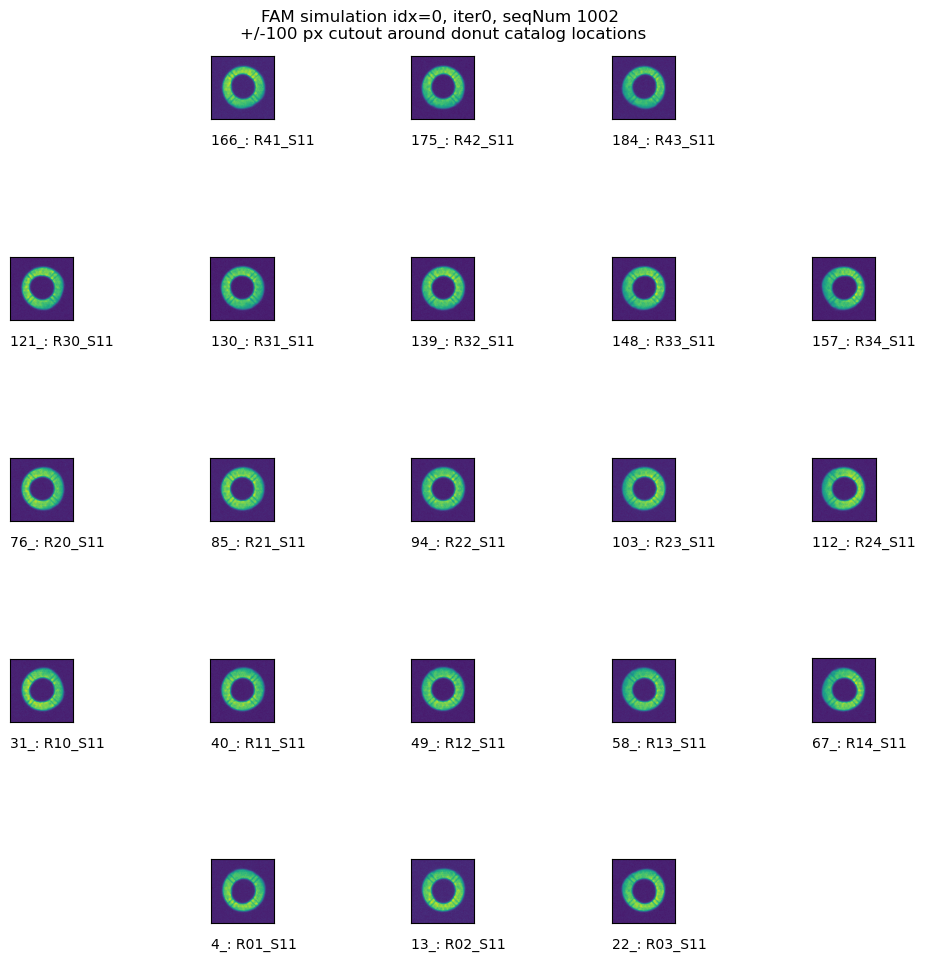

In [245]:
from astropy.table import Table 
num=0

add_text = True
fig= plt.figure(figsize=(10,10))
for detid in list(exps.keys()): #table['detid'].data[::10]: # table[5,14,15,155, 200,201,202,203,204]:
    row = table[table['detid'] == detid]
    left = row['scaled_left_xs'].data[0]
    bottom = row['scaled_bottom_ys'].data[0]
    width = row['scaled_x_widths'].data[0]
    height = row['scaled_y_heights'].data[0]
    rect = [left, bottom, width, height]
    ax = fig.add_axes(rect)
    ax.set_xticks([])
    ax.set_yticks([])
    if add_text:
        text = f"{row['detid'].data[0]}_: {row['detname'].data[0]}"
        ax.text(0.05,-80.4, text)

    # plot entire exposure 
    #ax.imshow(exps[detid].image.array,origin='lower')

    # plot exposure around the donut catalog location
    # how much off-center it is represents how far off is the 
    # WCS-based guess off 
    x = int(donutCats[detid]['centroid_x'][0])
    y = int(donutCats[detid]['centroid_y'][0])
    d = exps[detid].image.array
    w=100
    ax.imshow(d[y-w:y+w, x-w:x+w], origin='lower')
fig.suptitle(f'FAM simulation idx={idx}, iter{num}, seqNum {seq_num} \n+/-{w} px cutout around donut catalog locations')

What about donut stamps, especially idx=1 , 2, 4, 5 , which have surprisingly low FHWMs...

In [246]:
idx = 0

repo_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM/imsimData/' 
collection = f'ts_imsim_1002' # extra-focal number for the collection 
butler = Butler(repo_dir) 

# select the appropriate donut catalog (intra-focal) and exposure by the seq num 
dataRefs = butler.registry.queryDatasets('donutCatalog', collections = [collection],
                                        #  where="instrument='LSSTCam'").expanded()
                                        where="instrument='LSSTCam' and visit.seq_num = 1002").expanded()

donutCats = {}
exps = {}
donutStamps = {}
zernikesRaw = {}
for ref in dataRefs:
    print(ref)
    detId = ref.dataId.detector.id
    expId = ref.dataId.visit.id
    donutCats[detId] = butler.get('donutCatalog', dataId=ref.dataId,  collections = [collection])
    #if detId == 191:
    dataId = {'instrument': 'LSSTCam', 'detector': detId, 'visit': expId,'exposure': expId,}
    #exps[detId] =  butler.get('postISRCCD', dataId=dataId, collections=[collection])
    donutStamps[detId] = butler.get('donutStampsExtra', dataId=dataId, collections=[collection])
    zernikesRaw[detId] = butler.get('zernikeEstimateRaw', dataId=dataId, collections=[collection])

donutCatalog@{instrument: 'LSSTCam', detector: 4, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=ed594c73-ff7f-4768-9616-ef93a0122928)
donutCatalog@{instrument: 'LSSTCam', detector: 13, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=643f4d61-499e-47d8-8bc0-f9cb39440cc8)
donutCatalog@{instrument: 'LSSTCam', detector: 22, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=ebf1c98f-8eaa-466f-acb2-eb6080b54f8b)
donutCatalog@{instrument: 'LSSTCam', detector: 31, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=e2950195-3eff-481a-b926-6ada8c37f29a)
donutCatalog@{instrument: 'LSSTCam', detector: 40, visit: 7023061901002, band: 'g', day_obs: 20230619, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1002 id=a5c2ceb8-a261-49f2-8493-c9883

In [247]:
len(donutStamps)

21

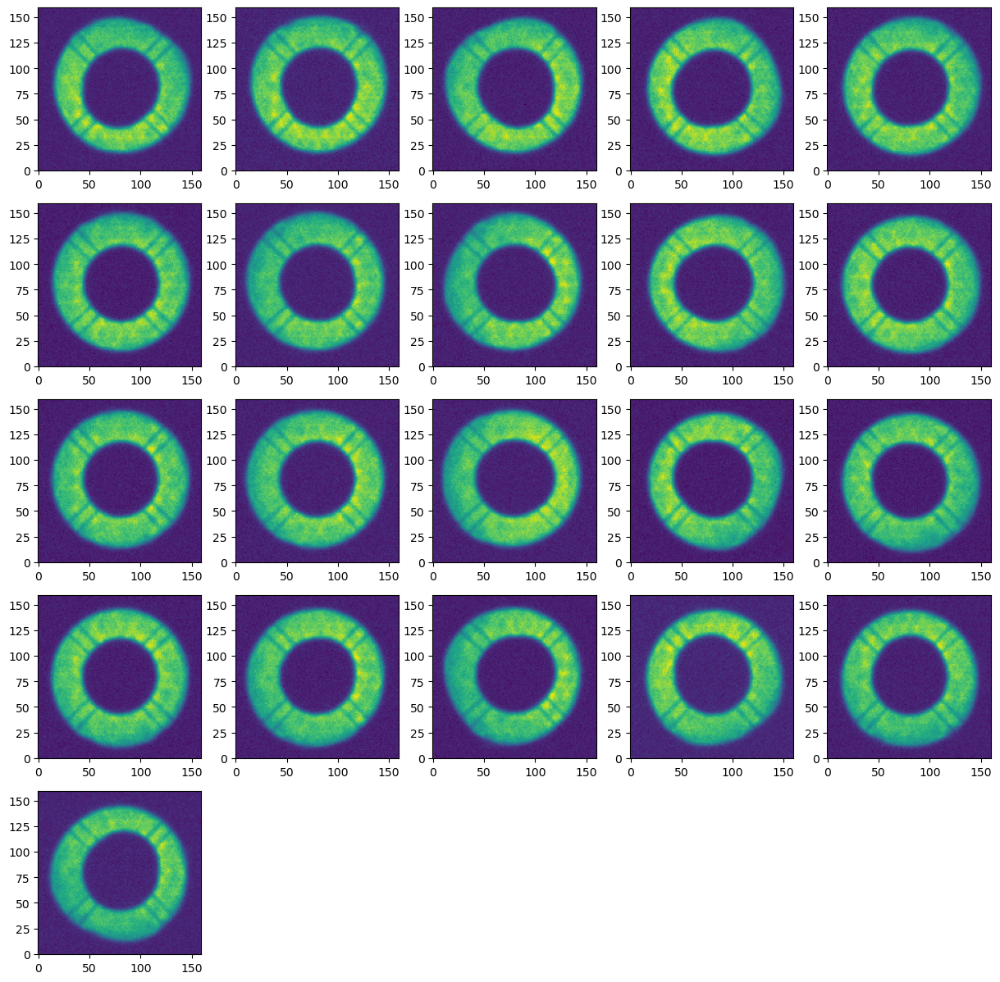

In [248]:
fig,axs = plt.subplots(5,5, figsize=(15,15))
ax = np.ravel(axs)
i=0
for detId in donutStamps.keys():
    ax[i].imshow(donutStamps[detId][0].stamp_im.image.array, origin='lower')
    i += 1 
if len(donutStamps.keys())<len(ax):
    for i in range(len(donutStamps.keys()), len(ax)):
        ax[i].axis('off')

plot Zernikes vs OPD:

In [250]:
import yaml
data_dir =  f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM_direct/'
fpath = os.path.join(data_dir,'iter0/img/opd.zer')
#opdData = Table.read(fpath,)# allow_pickle=True)

with open(fpath, "r") as f:
            opdData = yaml.safe_load(f)
    

In [153]:
#opdData.keys()

It's not per detector, since or is it ?  There are 189 detectors after all ... 

In [251]:
len(opd)

25

In [252]:
opd = np.asarray(opdData[detId][0].split()).astype(float)
len(opd)

25

In [255]:
zk

array([-21246.25770068,   4920.13780947, -23909.16448897,  35094.48324736,
         1516.91443046, -12097.9475016 ,  -6148.48611939,   9149.89832589,
        10895.98276348,   2916.94852803,  -2008.34816259,  -3168.83235006,
         5366.47049987,   1713.92912649,   3079.44295293, -16646.21321742,
         4942.66411582,   3908.3137078 ,  -2713.61806684,   3139.73536614,
        -9822.44932977,    346.40216672,  -3320.89214834,   6381.91588484,
         5104.91431169])

In [254]:
opd

array([-4.64427308e+02,  3.40724039e+02,  5.58311154e+01,  9.47419470e+01,
       -2.76332483e+01,  5.60796044e+01,  2.45587493e+01,  1.26516865e+01,
       -4.77726213e+00, -3.09823620e+00,  3.42426671e+01,  6.01075376e+01,
       -1.10714279e-01, -8.74913078e+00, -2.70422033e+01, -2.11295107e+01,
       -1.44547269e+01,  1.27591914e+01, -6.66286670e+00,  1.48606572e+01,
        7.24138697e+00, -1.91374900e+01, -3.68154513e+00,  7.90188321e-01,
        5.40329780e+00])

In [126]:
#convertZernikesToPsfWidth?

In [261]:
from lsst.ts.wep.utils  import convertZernikesToPsfWidth
from lsst.ts.imsim.utils import  get_zk_from_file

idx=0
data_dir =  f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM_direct/'
iterNum = 1
iterPlot = 0

# Read in the data 
opdDataDic = {}
wfsDataDic = {}
#pssn_data = []
#fwhm_data = []
for iterCount in range(iterNum):
    # load the OPD data 
    opdZkFilePath = os.path.join(data_dir, f'iter{iterCount}/img/opd.zer')
    #opd = fits.getdata(self.opd_file_path, idx)

    # convert from nm to microns 
    # opd.zer is in nm  
    opdData = get_zk_from_file(opdZkFilePath)
    opdDataDic[iterCount] = opdData
    
    
    # load the wavefront error data 
    # wfs.zer is in microns 
    wfsZkFilePath = os.path.join(data_dir, f'iter{iterCount}/img/wfs.zer')
    wfsData = get_zk_from_file(wfsZkFilePath)
    
    wfsDataDic[iterCount] = wfsData
    


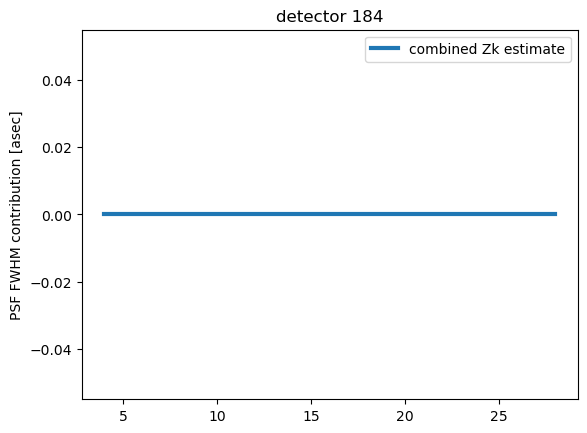

In [262]:
for det in donutStamps.keys():

    opdDataNm = opdDataDic[iterCount][det]
    opdData =  1e-3*opdDataNm
    wfsData = wfsDataDic[iterCount][det]
    
    # this function assumes Zk in um  (microns) 
    opd_fwhm = convertZernikesToPsfWidth(opdData)
    wfsData_fwhm = convertZernikesToPsfWidth(wfsData)
                   
                    
    #meanOpdData_fwhm = np.mean(opd_fwhm, axis=0)
    zernikeErrorsDiff_fwhm = np.sqrt((wfsData_fwhm - opd_fwhm)**2.)
    #zernikeErrors_fwhm = np.transpose(zernikeErrorsDiff_fwhm, axes=(1,0))
    zernikeRms_fwhm = np.sqrt(np.mean(np.square(zernikeErrorsDiff_fwhm), axis=0))
    #print(zernikeRms_fwhm)
    
    #ax[k].plot(np.arange(19)+4, zernikeRms_fwhm, 
    #                      '-o', lw=3, label='iter%d'%iterCount)
    #ax[k].set_ylabel('RMS(WFS-OPD) FWHM [asec]', size=18)
    
    
    
plt.title(f'detector {det}')
plt.plot(np.arange(25)+4, wfsData_fwhm, lw=3,ls='-' , label='combined Zk estimate')
plt.ylabel('PSF FWHM contribution [asec]')
plt.legend()

In [265]:
wfsData

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0.])

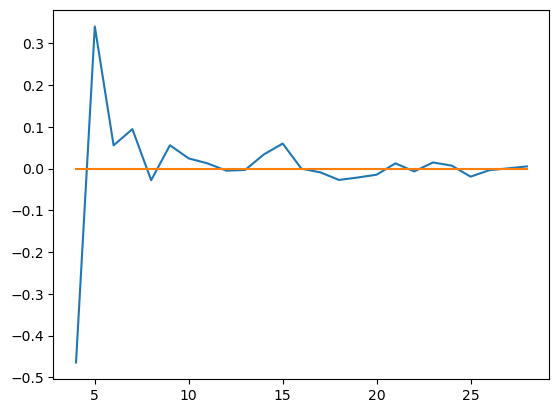

In [263]:
plt.plot(np.arange(25)+4, opdData)
plt.plot(np.arange(25)+4, wfsData)

In [101]:
detId = 90
opd = np.asarray(opdData[detId][0].split()).astype(float)
zk = zernikesRaw[detId][0]

plt.scatter(np.arange(4,29), opd, c='orange')
plt.scatter(np.arange(4,29), zk, c='blue')

AttributeError: 'numpy.float64' object has no attribute 'split'

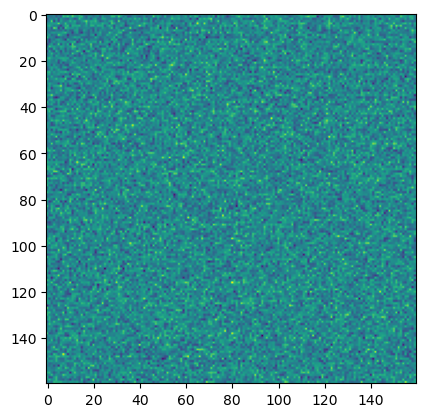

In [40]:
plt.imshow(stamp[0].stamp_im.image.array)

In [27]:
plt.imshow(donutStamps[67].stamp.image.array)

AttributeError: 'DonutStamps' object has no attribute 'stamp'

In [53]:
What about the convergence?  

0.9354058745621229

In [234]:
#plot_PSSN_FWHM??

In [ ]:
plot_pssn_of_iters(pssn_files)

In [146]:
def plot_fwhm_of_iters(pssn_files):
    
    # Collect the FWHM data. The row is the FWHM for each field. The final row
    # is the GQ FWHM. The column is the iterations.
    num_of_iter = len(pssn_files)
    
    num_of_fwhm_data = 0
    fwhm_data_all = np.array([])
    for pssn_file in pssn_files:
        fwhm_data = np.loadtxt(pssn_file)[1, :]
        if num_of_fwhm_data == 0:
            num_of_fwhm_data = len(fwhm_data)
    
        fwhm_data_all = np.append(fwhm_data_all, fwhm_data)
    
    reshaped_fwhm_data = fwhm_data_all.reshape((num_of_iter, num_of_fwhm_data)).T
    
    plt.figure()
    plt.plot(reshaped_fwhm_data[:-1, :].T, "bx-")
    plt.plot(reshaped_fwhm_data[-1, :], "ro-", label="GQ FWHM_eff")
    plt.xlabel("Iteration")
    plt.ylabel("Arcsec")
    plt.legend()


In [243]:
def plot_pssn_of_iters(pssn_files):
    # Collect the PSSN data. The rows is the PSSN for each field.
    # The final row is the GQ PSSN. 
    num_of_iter = len(pssn_files)
    
    num_of_pssn_data = 0 
    pssn_data_all = np.array([])
    for pssn_file in pssn_files:
        pssn_data = np.loadtxt(pssn_file)[0, :]
        if num_of_pssn_data == 0:
            num_of_pssn_data = len(pssn_data)

        pssn_data_all = np.append(pssn_data_all, pssn_data)
    reshaped_pssn_data = pssn_data_all.reshape((num_of_iter, num_of_fwhm_data)).T
    
    plt.figure()
    plt.plot(reshaped_pssn_data[:-1, :].T, "bx-")
    plt.plot(reshaped_pssn_data[-1, :], "ro-", label="PSSN")
    plt.xlabel("Iteration")
    plt.ylabel("Arcsec")
    plt.legend()



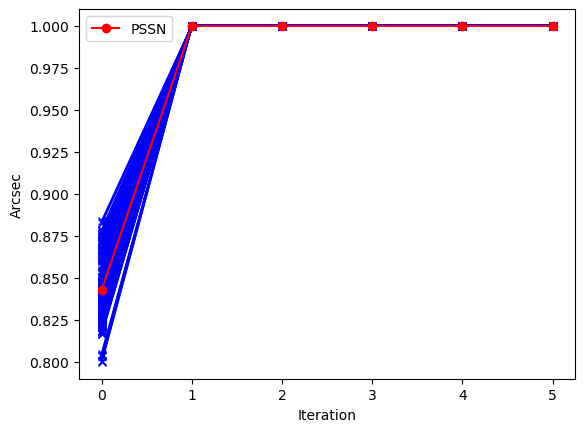

In [244]:
plot_pssn_of_iters(pssn_files)

In [ ]:
def plot_fwhm_of_iters(pssn_files):
    
    # Collect the FWHM data. The row is the FWHM for each field. The final row
    # is the GQ FWHM. The column is the iterations.
    num_of_iter = len(pssn_files)
    
    num_of_fwhm_data = 0
    fwhm_data_all = np.array([])
    for pssn_file in pssn_files:
        fwhm_data = np.loadtxt(pssn_file)[1, :]
        if num_of_fwhm_data == 0:
            num_of_fwhm_data = len(fwhm_data)
    
        fwhm_data_all = np.append(fwhm_data_all, fwhm_data)
    
    reshaped_fwhm_data = fwhm_data_all.reshape((num_of_iter, num_of_fwhm_data)).T
    
    plt.figure()
    plt.plot(reshaped_fwhm_data[:-1, :].T, "bx-")
    plt.plot(reshaped_fwhm_data[-1, :], "ro-", label="GQ FWHM_eff")
    plt.xlabel("Iteration")
    plt.ylabel("Arcsec")
    plt.legend()


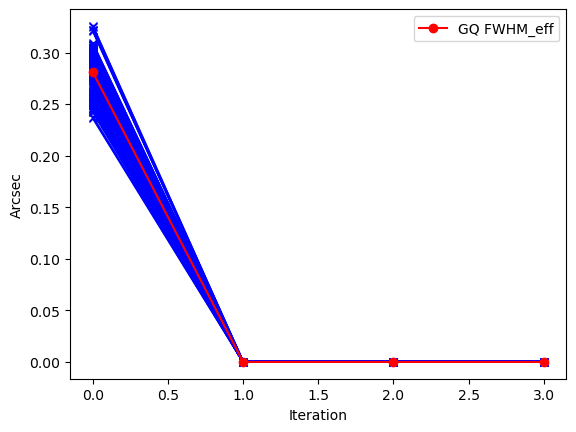

In [280]:
idx=5
data_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM/'
iter_num = 4
pssn_files = [os.path.join(data_dir,'iter%i' % num, 'img/%s'%opdPssnFileName) for num in range(iter_num)]
plot_fwhm_of_iters(pssn_files)

How many iterations were completed? 

For idx=5 there are 4 completed iterations


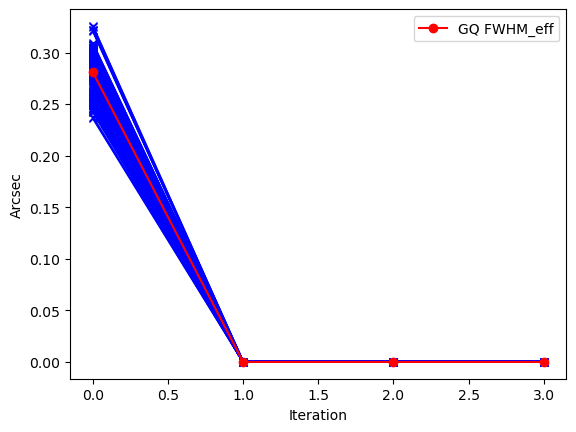

In [273]:
idx=5
data_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM/'
files = os.listdir(data_dir)
iterfiles = [file   for file in files if file.startswith('iter')]
iter_num = len(iterfiles)
print(f'For idx={idx} there are {iter_num} completed iterations')
pssn_files = [os.path.join(data_dir,'iter%i' % num, 'img/%s'%opdPssnFileName) for num in range(iter_num)]
plot_fwhm_of_iters(pssn_files)

In [252]:
iterfiles

['iter1', 'iter0']

In [ ]:
#plot_gq_fwhm(
for idx in [0,1,2,3,]:
    data_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_FAM/'
    iter_num = 3
    pssn_files = [
                os.path.join(
                data_dir,'iter%i' % num, 'img/%s'%opdPssnFileName
            )
            for num in range(iter_num)
        ]
    

In [ ]:
def plot_pssn_of_iters(pssn_files):
    # Collect the PSSN data. The rows is the PSSN for each field.
    # The final row is the GQ PSSN. 
    num_of_iter = len(pssn_files)
    
    num_of_pssn_data = 0 
    pssn_data_all = np.array([])
    for pssn_file in pssn_files:
        pssn_data = np.loadtxt(pssn_file)[0, :]
        if num_of_pssn_data == 0:
            num_of_pssn_data = len(pssn_data)

        pssn_data_all = np.append(pssn_data_all, pssn_data)
    reshaped_pssn_data = pssn_data_all.reshape((num_of_iter, num_of_fwhm_data)).T
    
    plt.figure()
    plt.plot(reshaped_pssn_data[:-1, :].T, "bx-")
    plt.plot(reshaped_pssn_data[-1, :], "ro-", label="PSSN")
    plt.xlabel("Iteration")
    plt.ylabel("Arcsec")
    plt.legend()

plot_gq_pssn only:

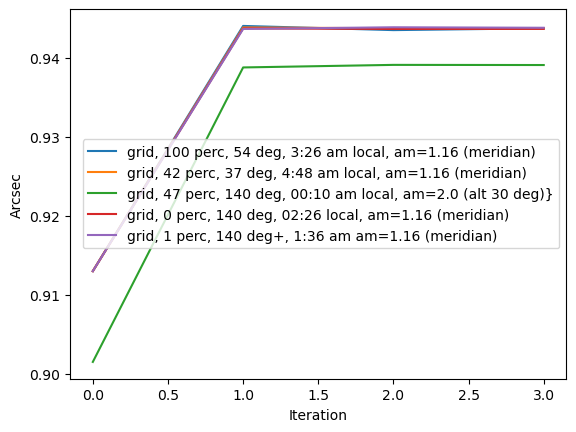

In [276]:
#Plot all idx:
from matplotlib.ticker import MaxNLocator
#fig,ax = plt.subplots(1,2,figsize=(13,5))
num_ccds=4 ; iterNum=8

plt.figure()
for idx in [1,2,3,4,5]:
    data_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct_long_grid/'
    
    opdPssnFileName='PSSN.txt'
    aos_fwhm_arcsec_level = 0.089
    label='grid, ' + illumination_dic[idx]


    pssn_files = [os.path.join(data_dir,'iter%i' % num, 'img/%s'%opdPssnFileName) for num in range(iter_num)]
    num_of_iter = len(pssn_files)
    num_of_pssn_data = 0 
    pssn_data_all = np.array([])
    for pssn_file in pssn_files:
        pssn_data = np.loadtxt(pssn_file)[0, :]
        if num_of_pssn_data == 0:
            num_of_pssn_data = len(pssn_data)

        pssn_data_all = np.append(pssn_data_all, pssn_data)
    reshaped_pssn_data = pssn_data_all.reshape((num_of_iter, num_of_pssn_data)).T
    plt.plot(reshaped_pssn_data[-1, :], label=label)

    plt.xlabel("Iteration")
    plt.ylabel("Arcsec")
    plt.legend()
   
# on all : turn on the grid and set the x-label to be on integers only
# since we're plotting Zernikes and iteration, both of which are integers
# for i in range(len(ax)):
#     ax[i].grid()
#     ax[i].xaxis.set_major_locator(MaxNLocator(integer=True))
# fig.subplots_adjust(hspace=0.4)
#     #fig.suptitle(suptitle, fontsize=20)
#     # plt.savefig(figname, bbox_inches='tight')
#     # print('Saved fig as %s'%figname)
# ax[1].legend()



In [10]:
ycorners

[235.885, 235.885, 215.885, 215.885]

Text(0, 0.5, 'Focal Plane Y (mm)')

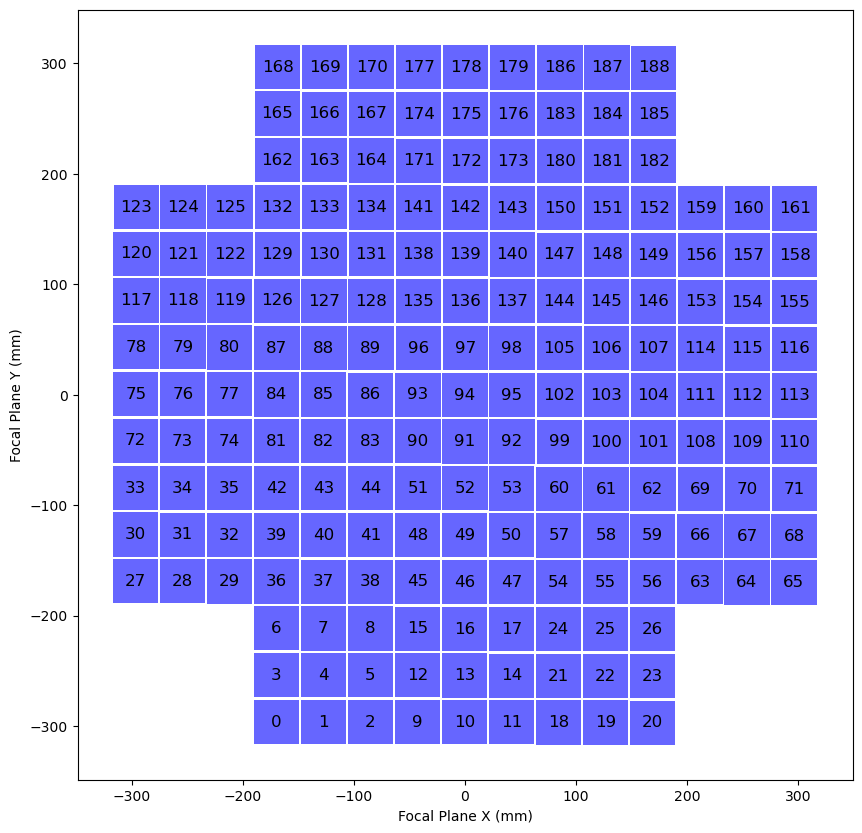

In [296]:
fig= plt.figure(figsize=(10,10))
ax = plt.gca()

xvals,yvals = [],[]
colors,patches = [],[]
for det in camera:
    corners = [(c.getX(), c.getY()) for c in det.getCorners(FOCAL_PLANE)]
    for corner in corners:
        xvals.append(corner[0])
        yvals.append(corner[1])
    colors.append('b')
    patches.append(Polygon(corners))
    center = det.getOrientation().getFpPosition()
    text = det.getId()
    rot = 90 if text in (195,196,199,200) else 0
    ax.text(center.getX(), center.getY(), text,
            ha='center', va='center', size=12, rotation=rot)

patchCollection = PatchCollection(patches, alpha=0.6, facecolor=colors)
ax.add_collection(patchCollection)

ax.set_xlim(min(xvals) - abs(0.1*min(xvals)),
            max(xvals) + abs(0.1*max(xvals)))
ax.set_ylim(min(yvals) - abs(0.1*min(yvals)),
            max(yvals) + abs(0.1*max(yvals)))
ax.set_xlabel('Focal Plane X (mm)')
ax.set_ylabel('Focal Plane Y (mm)')

In [19]:
idx=0
img_dir = f"/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}/"
path_to_repo = os.path.join(img_dir, 'imsimData')
butler = dafButler.Butler(path_to_repo, collections=['ts_imsim_1000','LSSTCam/calib'])



In [312]:
#butler.registry.queryCollections()

In [20]:
camera = butler.get('camera',instrument='LSSTCam')

In [315]:
camera.getName()

'LSSTCam'

In [21]:
for det in camera:
    if 'SW' in det.getName() :
        print(det.getId())

191
192
195
196
199
200
203
204


In [25]:
from lsst.afw.cameraGeom import PIXELS, FIELD_ANGLE
det.getTransform(PIXELS, FIELD_ANGLE)

lsst.afw.geom.TransformPoint2ToPoint2[2->2]

In [26]:
det.getCorners(PIXELS)

[Point2D(-0.5, -0.5),
 Point2D(4071.5, -0.5),
 Point2D(4071.5, 1999.5),
 Point2D(-0.5, 1999.5)]

Plot all detectors in correct location:

Text(0, 0.5, 'Focal Plane Y (mm)')

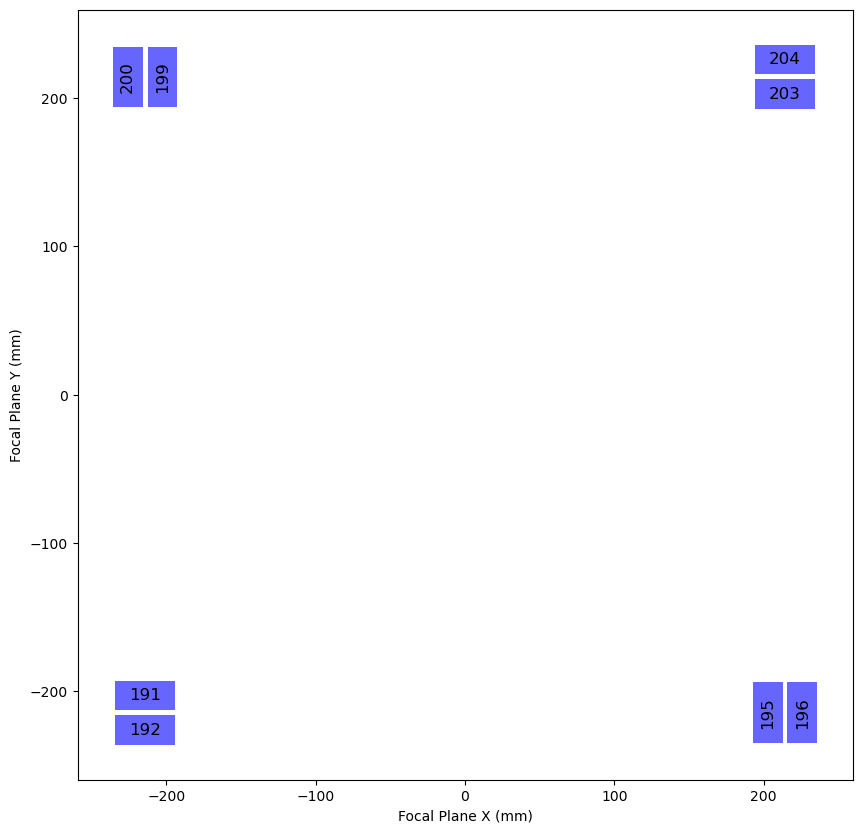

In [318]:
fig= plt.figure(figsize=(10,10))
ax = plt.gca()

xvals,yvals = [],[]
colors,patches = [],[]
for det in camera:
    if 'SW' in det.getName() :
        corners = [(c.getX(), c.getY()) for c in det.getCorners(FOCAL_PLANE)]
        for corner in corners:
            xvals.append(corner[0])
            yvals.append(corner[1])
        colors.append('b')
        patches.append(Polygon(corners))
        center = det.getOrientation().getFpPosition()
        text = det.getId()
        rot = 90 if text in (195,196,199,200) else 0
        ax.text(center.getX(), center.getY(), text,
                ha='center', va='center', size=12, rotation=rot)

patchCollection = PatchCollection(patches, alpha=0.6, facecolor=colors)
ax.add_collection(patchCollection)

ax.set_xlim(min(xvals) - abs(0.1*min(xvals)),
            max(xvals) + abs(0.1*max(xvals)))
ax.set_ylim(min(yvals) - abs(0.1*min(yvals)),
            max(yvals) + abs(0.1*max(yvals)))
ax.set_xlabel('Focal Plane X (mm)')
ax.set_ylabel('Focal Plane Y (mm)')

And below code from  https://github.com/jmeyers314/wfsim/blob/main/notebooks/Focal%20Plane%20Coordinate%20Systems.ipynb  :


Working as of  9/30/2023,  `w_2024_37`:  

In [30]:
LsstCam.getCamera()

In [102]:
corners = det.getCorners(PIXELS)

[Point2D(-0.5, -0.5),
 Point2D(4071.5, -0.5),
 Point2D(4071.5, 1999.5),
 Point2D(-0.5, 1999.5)]

In [31]:
import matplotlib.pyplot as plt
import lsst.afw.cameraGeom as cameraGeom
from lsst.afw.cameraGeom import FOCAL_PLANE, PIXELS
from lsst.obs.lsst import LsstCam
from lsst.geom import Point2D
from astropy.table import Table
import numpy as np

names = []
cenxs = []
cenys = []
c1xs = []
c1ys = []
c2xs = []
c2ys = []
c3xs = []
c3ys = []
c4xs = []
c4ys = []
nxs = []
nys = []
zeroxs = []
zeroys = []
xhatxs = []
xhatys = []
yhatxs = []
yhatys = []

camera = LsstCam().getCamera()
for det in camera:
    name = det.getName()
    names.append(name)
    center = det.getCenter(FOCAL_PLANE)
    cenxs.append(center.x)
    cenys.append(center.y)
    corners = det.getCorners(FOCAL_PLANE)
    c1xs.append(corners[0].x)
    c1ys.append(corners[0].y)
    c2xs.append(corners[1].x)
    c2ys.append(corners[1].y)
    c3xs.append(corners[2].x)
    c3ys.append(corners[2].y)
    c4xs.append(corners[3].x)
    c4ys.append(corners[3].y)
    bbox = det.getBBox()
    nxs.append(bbox.endX)
    nys.append(bbox.endY)
    transform = det.getTransform(PIXELS, FOCAL_PLANE)
    zero = transform.applyForward(Point2D(0, 0))
    zeroxs.append(zero.x)
    zeroys.append(zero.y)
    xhat = transform.applyForward(Point2D(1000, 0))
    xhatxs.append(xhat.x)
    xhatys.append(xhat.y)
    yhat = transform.applyForward(Point2D(0, 1000))
    yhatxs.append(yhat.x)
    yhatys.append(yhat.y)

In [32]:
table = Table()
table['name'] = names
table['cenx'] = np.array(cenxs, dtype=np.float32)
table['ceny'] = np.array(cenys, dtype=np.float32)
table['c1x'] = np.array(c1xs, dtype=np.float32)
table['c1y'] = np.array(c1ys, dtype=np.float32)
table['c2x'] = np.array(c2xs, dtype=np.float32)
table['c2y'] = np.array(c2ys, dtype=np.float32)
table['c3x'] = np.array(c3xs, dtype=np.float32)
table['c3y'] = np.array(c3ys, dtype=np.float32)
table['c4x'] = np.array(c4xs, dtype=np.float32)
table['c4y'] = np.array(c4ys, dtype=np.float32)
table['nx'] = np.array(nxs, dtype=np.int16)
table['ny'] = np.array(nys, dtype=np.int16)
table['zerox'] = np.array(zeroxs, dtype=np.float32)
table['zeroy'] = np.array(zeroys, dtype=np.float32)
table['xhatx'] = np.array(xhatxs, dtype=np.float32)
table['xhaty'] = np.array(xhatys, dtype=np.float32)
table['yhatx'] = np.array(yhatxs, dtype=np.float32)
table['yhaty'] = np.array(yhatys, dtype=np.float32)

In [33]:
table.write("sensors.txt", format='ascii.fixed_width', overwrite=True)

In [37]:
table[:4]

name,cenx,ceny,c1x,c1y,c2x,c2y,c3x,c3y,c4x,c4y,nx,ny,zerox,zeroy,xhatx,xhaty,yhatx,yhaty
str7,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,float32,float32,float32,float32,float32,float32
R01_S00,-169.26,-296.26,-189.62,-316.26,-148.9,-316.26,-148.9,-276.26,-189.62,-276.26,4072,4000,-189.615,-316.255,-179.615,-316.255,-189.615,-306.255
R01_S01,-127.01,-296.26,-147.37,-316.26,-106.65,-316.26,-106.65,-276.26,-147.37,-276.26,4072,4000,-147.365,-316.255,-137.365,-316.255,-147.365,-306.255
R01_S02,-84.76,-296.26,-105.12,-316.26,-64.4,-316.26,-64.4,-276.26,-105.12,-276.26,4072,4000,-105.115,-316.255,-95.115,-316.255,-105.115,-306.255
R01_S10,-169.26,-254.01,-189.62,-274.01,-148.9,-274.01,-148.9,-234.01,-189.62,-234.01,4072,4000,-189.615,-274.005,-179.615,-274.005,-189.615,-264.005


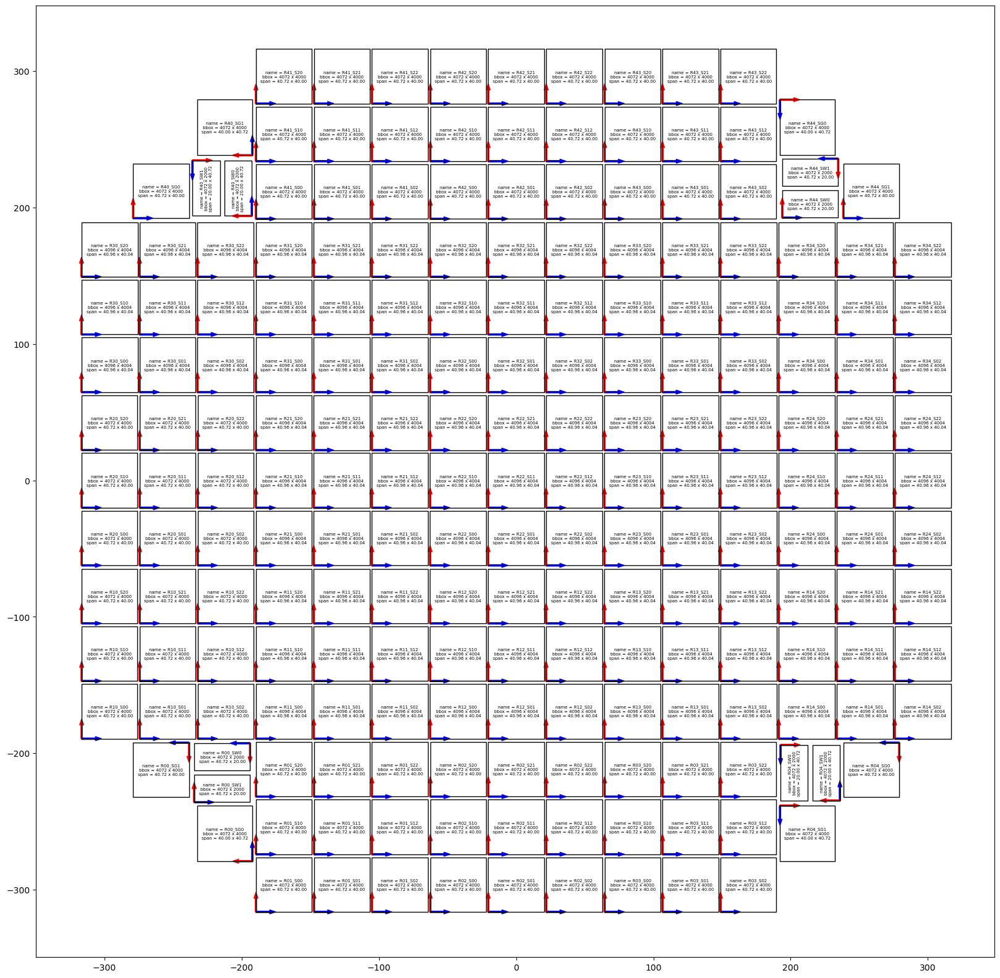

In [34]:
fig, ax = plt.subplots(figsize=(20, 20))
for row in table:
    plt.plot(
        [row['c1x'], row['c2x'], row['c3x'], row['c4x'], row['c1x']],
        [row['c1y'], row['c2y'], row['c3y'], row['c4y'], row['c1y']],
        c='k', lw=1
    )
    xspan = np.ptp([row['c1x'], row['c2x'], row['c3x'], row['c4x']])
    yspan = np.ptp([row['c1y'], row['c2y'], row['c3y'], row['c4y']])
    txt = (
        f"name = {row['name']}\n"
        f"bbox = {row['nx']} x {row['ny']}\n"
        f"span = {xspan:.2f} x {yspan:.2f}"
    )
    rotation = 'horizontal'
    if row['name'] in ['R04_SW0', 'R04_SW1', 'R40_SW0', 'R40_SW1']:
        rotation = 'vertical'
    
    plt.text(row['cenx'], row['ceny'], txt, fontsize=5, horizontalalignment='center', verticalalignment='center', rotation=rotation)    
    plt.arrow(row['zerox'], row['zeroy'], row['xhatx']-row['zerox'], row['xhaty']-row['zeroy'], color='blue', width=1)
    plt.arrow(row['zerox'], row['zeroy'], row['yhatx']-row['zerox'], row['yhaty']-row['zeroy'], color='red', width=1)
plt.show()

Try plotting only the corner sensors, and shift them closer to origin:

In [40]:
table[:3]

name,cenx,ceny,c1x,c1y,c2x,c2y,c3x,c3y,c4x,c4y,nx,ny,zerox,zeroy,xhatx,xhaty,yhatx,yhaty
str7,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,float32,float32,float32,float32,float32,float32
R01_S00,-169.26,-296.26,-189.62,-316.26,-148.9,-316.26,-148.9,-276.26,-189.62,-276.26,4072,4000,-189.615,-316.255,-179.615,-316.255,-189.615,-306.255
R01_S01,-127.01,-296.26,-147.37,-316.26,-106.65,-316.26,-106.65,-276.26,-147.37,-276.26,4072,4000,-147.365,-316.255,-137.365,-316.255,-147.365,-306.255
R01_S02,-84.76,-296.26,-105.12,-316.26,-64.4,-316.26,-64.4,-276.26,-105.12,-276.26,4072,4000,-105.115,-316.255,-95.115,-316.255,-105.115,-306.255


In [61]:
camera.get

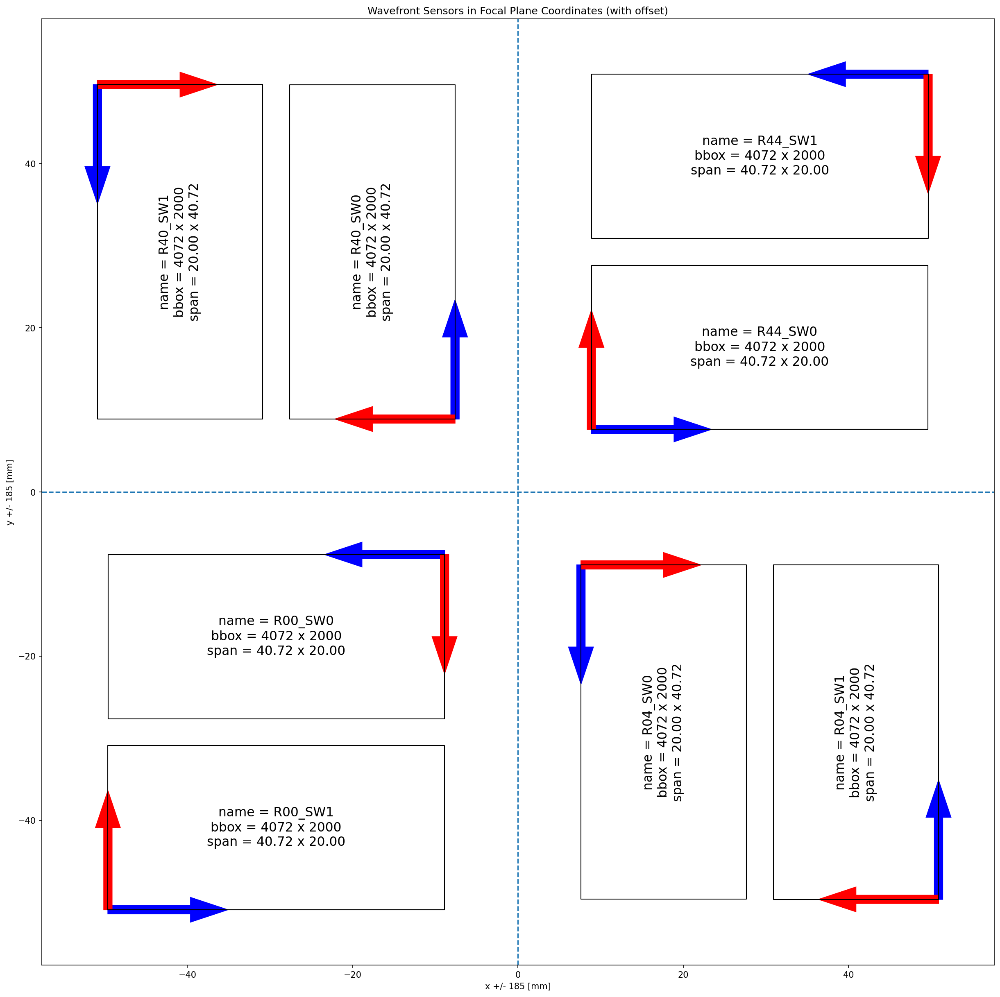

In [60]:
fig, ax = plt.subplots(figsize=(20, 20), dpi=150)
for row in table:
    if 'SW' in row['name']:
        #print(row.name)
        w = 185 # (amount of shift) 
        
        xshift = w # shift to the right by default from LHS 
       
        if row['c1x'] > 0:
            xshift = -w # shift to the left the RHS 
        
        yshift = w # shift up from bottom by default 
        if row['c1y'] > 0:
            yshift = -w
        plt.plot(
            [row['c1x']+xshift, row['c2x']+xshift, row['c3x']+xshift, row['c4x']+xshift, row['c1x']+xshift],
            [row['c1y']+yshift, row['c2y']+yshift, row['c3y']+yshift, row['c4y']+yshift, row['c1y']+yshift],
            c='k', lw=1
        )
        # span doesn't need any changes 
        xspan = np.ptp([row['c1x'], row['c2x'], row['c3x'], row['c4x']])
        yspan = np.ptp([row['c1y'], row['c2y'], row['c3y'], row['c4y']])
        txt = (
            f"name = {row['name']}\n"
            f"bbox = {row['nx']} x {row['ny']}\n"
            f"span = {xspan:.2f} x {yspan:.2f}"
        )
        rotation = 'horizontal'
        if row['name'] in ['R04_SW0', 'R04_SW1', 'R40_SW0', 'R40_SW1']:
            rotation = 'vertical'
        
        plt.text(row['cenx']+xshift, row['ceny']+yshift, txt, fontsize=15, 
                 horizontalalignment='center', verticalalignment='center', rotation=rotation)    
        plt.arrow(row['zerox']+xshift, row['zeroy']+yshift, row['xhatx']-row['zerox'], row['xhaty']-row['zeroy'], color='blue', width=1)
        plt.arrow(row['zerox']+xshift, row['zeroy']+yshift, row['yhatx']-row['zerox'], row['yhaty']-row['zeroy'], color='red', width=1)
plt.axvline(0,ls='--')
plt.axhline(0, ls='--')
plt.title('Wavefront Sensors in Focal Plane Coordinates (with offset)')
plt.xlabel(f'x +/- {w} [mm]')
plt.ylabel(f'y +/- {w} [mm]')
plt.savefig('focal_plane_wavefront_sensors.png', dpi=150, bbox_inches='tight')
plt.show()

Ok, given that this is the orientation, plot all corners together: 

In [80]:
camera = LsstCam().getCamera()
name_to_detid = {}
detid_to_name = {}
for det in camera:
    if 'SW' in det.getName():
        name_to_detid[det.getName()] = det.getId()
        detid_to_name[det.getId()] = det.getName()

In [104]:
#ax.arrow?

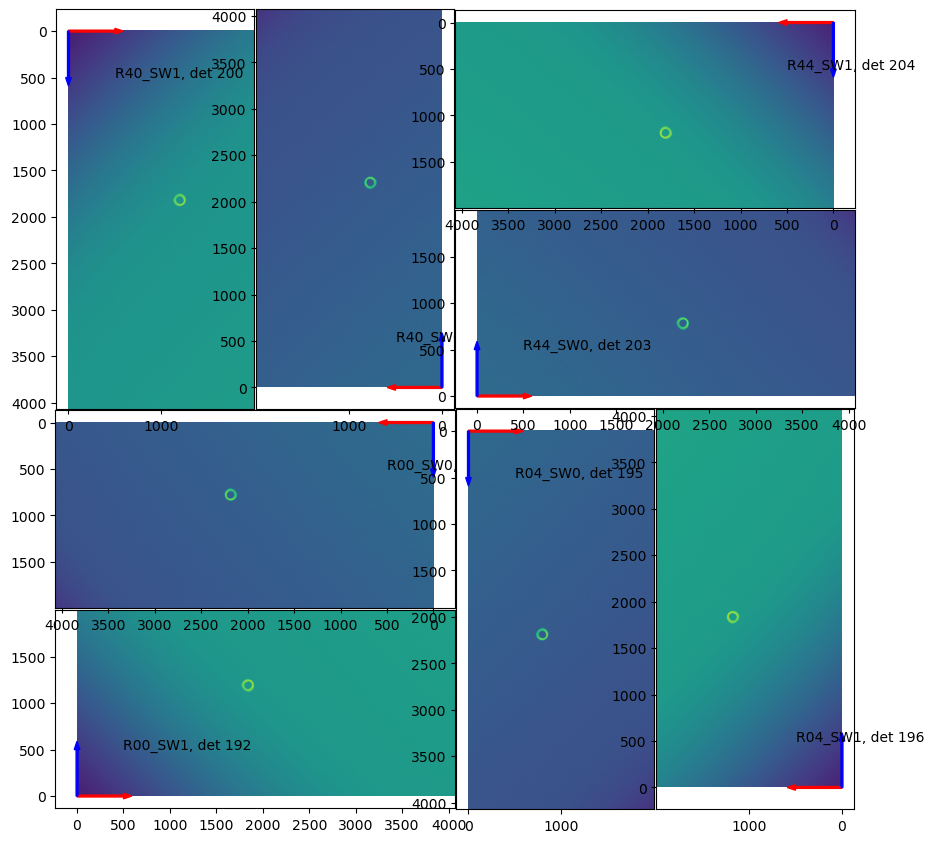

In [145]:
fig = plt.figure(figsize=(10,10))
#rect = tuple(left, bottom, width, height)
l = 0.4
s = 0.2
dh=0.01
dw=dh
ax00_sw1 = fig.add_axes([0,0,l,s])
ax00_sw0 = fig.add_axes([0,0+s,l,s])

ax04_sw0 = fig.add_axes([l,0,s,l])
ax04_sw1 = fig.add_axes([l+s,0,s,l]  )   

ax40_sw1 =  fig.add_axes([0, 2*s,  s, l])
ax40_sw0 = fig.add_axes([0+s,  2*s, s, l ] )

ax44_sw0 = fig.add_axes([l,  2*s, l, s])
ax44_sw1 = fig.add_axes([l,  3*s, l, s])



ax_dict = {  'R00_SW0': ax00_sw0,
             'R00_SW1': ax00_sw1,
           
             'R04_SW0': ax04_sw0,
             'R04_SW1': ax04_sw1,
           
             'R40_SW0': ax40_sw0,
             'R40_SW1': ax40_sw1,
           
             'R44_SW0': ax44_sw0,
             'R44_SW1': ax44_sw1
          }




import matplotlib.pyplot as plt
for detId in exps.keys():
    name = detid_to_name[detId]
    exp = exps[detId]
    data = exp.image.array
    ax = ax_dict[name]
    if ('R40_SW1' in name) or ('R04_SW0' in name) :
        #print(name)
        ax.imshow(data.T)
        #ax.arrow(0, 0, dx, 0, color='red', width=20)
        #ax.arrow(0, 0, 0, dy, color='blue', width=20)
    if 'R40_SW0' in name or ('R04_SW1' in name) :
        ax.imshow(data.T, origin='lower' )
        ax.invert_xaxis()
       # ax.arrow(0, 0, dx, 0, color='red', width=20)
       # ax.arrow(0, 0, 0, dy, color='blue', width=20)
    if ('R44_SW0' in name) or ('R00_SW1' in name):
        ax.imshow(data, origin='lower')#origin='lower' )
       # ax.arrow(0, 0, dx, 0, color='red', width=20)
       # ax.arrow(0, 0, 0, dy, color='blue', width=20)
    if ('R44_SW1' in name) or ('R00_SW0' in name):
        ax.imshow(data, origin='upper')
        ax.invert_xaxis()
    dx = 500
    dy = 500
    ax.text(500,500,f'{name}, det {detId}')
    ax.arrow(0, 0, dx, 0, color='red', width=20)   
    ax.arrow(0, 0, 0, dy, color='blue', width=20)
    
    
    #




This figure shows where we're loosing illumination due to focal plane edges. But it was too much work to get the orientation right. 


**NEXT:**  

* plot convergence levels (PSSN as a function of iteration) for different cases 
* change default MJD if the convergence is to lower level 

In [116]:
import matplotlib.pyplot as plt
import numpy as np 
def plot_PSSN_FWHM(data_dir, num_ccds=4, iterNum=5,
                   opdPssnFileName='PSSN.txt',
                   aos_fwhm_arcsec_level = 0.089,
                   suptitle=''
                  ):
    pssn_data = []
    fwhm_data = []
    for iterCount in range(iterNum):

        # load the PSSN and FWHM data 
        pssn_filename = os.path.join(data_dir, 'iter%i' % iterCount, 
                                     'img/%s'%opdPssnFileName)
        pssn_file_array = np.genfromtxt(pssn_filename)
        pssn_data.append(pssn_file_array[0])
        fwhm_data.append(pssn_file_array[1])
    pssn_data = np.array(pssn_data)
    fwhm_data = np.array(fwhm_data)


    fig,ax = plt.subplots(1,2,figsize=(13,5))

    # 2: plot PSSN 
    # if plot_pssn:
    k=0
    for i in range(num_ccds):
        ax[k].plot(np.arange(iterNum), pssn_data[:,i], c='b', marker='x')
    ax[k].plot(np.arange(iterNum), pssn_data[:,num_ccds], lw=4, marker='+',
             ms=20, markeredgewidth=5, c='r', label='GQ PSSN')
    ax[k].legend()
    ax[k].set_xlabel('Iteration')
    ax[k].set_ylabel('PSSN')
    ax[k].set_title('PSSN')
    k+=1

    # 3: plot the FWHM 
    # if plot_fwhm:
    for i in range(num_ccds):
        ax[k].plot(np.arange(iterNum), fwhm_data[:,i], c='b', marker='x')
    ax[k].plot(np.arange(iterNum), fwhm_data[:,num_ccds], lw=4, marker='+',
             ms=20, markeredgewidth=5, c='r', label='GQ FWHM_eff')
    #if plot_aos_fwhm_line:
    #ax[k].axhline(aos_fwhm_arcsec_level, c='orange', ls='--',lw=3, 
    #                  label=f'{aos_fwhm_arcsec_level} line')
    ax[k].legend()

    ax[k].set_xlabel('Iteration')
    ax[k].set_ylabel('FWHM_eff [asec] ')
    ax[k].set_title('FWHM_eff')
    k+=1

    # on all : turn on the grid and set the x-label to be on integers only
    # since we're plotting Zernikes and iteration, both of which are integers
    for i in range(len(ax)):
        ax[i].grid()
        ax[i].xaxis.set_major_locator(MaxNLocator(integer=True))
    fig.subplots_adjust(hspace=0.4)
    fig.suptitle(suptitle, fontsize=20)
    # plt.savefig(figname, bbox_inches='tight')
    # print('Saved fig as %s'%figname)




In [107]:

illumination_dic = {0:"default, 0 perc,", 
                   1:"100 perc, 54 deg, 3:26 am local, am=1.16 (meridian)",
                   2: "42 perc, 37 deg, 4:48 am local, am=1.16 (meridian)",
                   3: "47 perc, 140 deg, 00:10 am local, am=2.0 (alt 30 deg)}",
                   4: "0 perc, 140 deg, 02:26 local, am=1.16 (meridian) ",
                   5: "1 perc, 140 deg+, 1:36 am am=1.16 (meridian)"}

In [220]:
illumination_dic

{0: 'default, 0 perc, 105 deg, 9pm local, am=1.35 (alt 47.8 deg)',
 1: '100 perc, 54 deg, 3:26 am local, am=1.16 (meridian)',
 2: '42 perc, 37 deg, 4:48 am local, am=1.16 (meridian)',
 3: '47 perc, 140 deg, 00:10 am local, am=2.0 (alt 30 deg)}',
 4: '0 perc, 140 deg, 02:26 local, am=1.16 (meridian) '}

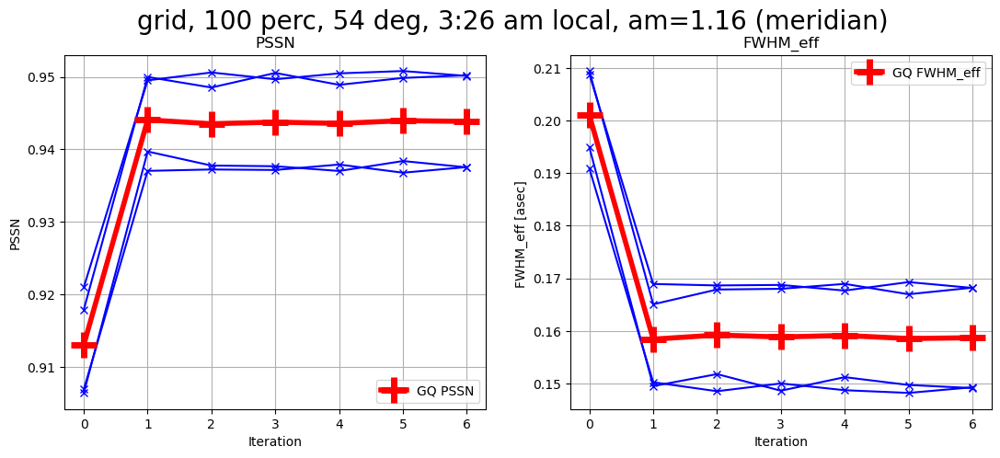

In [146]:
import galsim
import yaml
from matplotlib.ticker import MaxNLocator
idx = 1
data_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct_long_grid/'
plot_PSSN_FWHM(data_dir, num_ccds=4, iterNum=7,
                   opdPssnFileName='PSSN.txt',
                  aos_fwhm_arcsec_level = 0.089,
                   suptitle='grid, '+illumination_dic[idx]
                  )

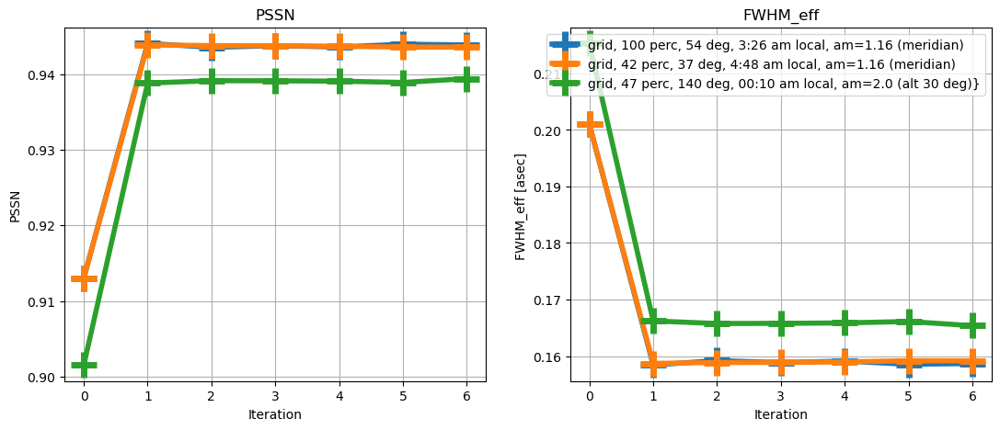

In [112]:
#Plot all idx:
from matplotlib.ticker import MaxNLocator
fig,ax = plt.subplots(1,2,figsize=(13,5))

for idx in [1,2,3]:
    data_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct_long_grid/'
    num_ccds=4 ; iterNum=7
    opdPssnFileName='PSSN.txt'
    aos_fwhm_arcsec_level = 0.089
    label='grid, ' + illumination_dic[idx]


    pssn_data = []
    fwhm_data = []
    for iterCount in range(iterNum):

        # load the PSSN and FWHM data 
        pssn_filename = os.path.join(data_dir, 'iter%i' % iterCount, 
                                     'img/%s'%opdPssnFileName)
        pssn_file_array = np.genfromtxt(pssn_filename)
        pssn_data.append(pssn_file_array[0])
        fwhm_data.append(pssn_file_array[1])
    pssn_data = np.array(pssn_data)
    fwhm_data = np.array(fwhm_data)

    # 1: plot PSSN 
    # if plot_pssn:
    k=0
    #for i in range(num_ccds):
    #    ax[k].plot(np.arange(iterNum), pssn_data[:,i], marker='x')
    ax[k].plot(np.arange(iterNum), pssn_data[:,num_ccds], lw=4, marker='+',
             ms=20, markeredgewidth=5, label=label)
    
    ax[k].set_xlabel('Iteration')
    ax[k].set_ylabel('PSSN')
    ax[k].set_title('PSSN')
    k+=1

    # 2: plot the FWHM 
    # if plot_fwhm:
    # for i in range(num_ccds):
    #     ax[k].plot(np.arange(iterNum), fwhm_data[:,i], c='b', marker='x')
    ax[k].plot(np.arange(iterNum), fwhm_data[:,num_ccds], lw=4, marker='+',
             ms=20, markeredgewidth=5, label=label)
    #if plot_aos_fwhm_line:
    #ax[k].axhline(aos_fwhm_arcsec_level, c='orange', ls='--',lw=3, 
    #                  label=f'{aos_fwhm_arcsec_level} line')
    

    ax[k].set_xlabel('Iteration')
    ax[k].set_ylabel('FWHM_eff [asec] ')
    ax[k].set_title('FWHM_eff')
    k+=1

# on all : turn on the grid and set the x-label to be on integers only
# since we're plotting Zernikes and iteration, both of which are integers
for i in range(len(ax)):
    ax[i].grid()
    ax[i].xaxis.set_major_locator(MaxNLocator(integer=True))
fig.subplots_adjust(hspace=0.4)
    #fig.suptitle(suptitle, fontsize=20)
    # plt.savefig(figname, bbox_inches='tight')
    # print('Saved fig as %s'%figname)
ax[1].legend()



For idx= 2, and idx=4,  I'm getting the following error:

    lsst.ctrl.mpexec.singleQuantumExecutor ERROR: Execution of task 'cutOutDonutsCwfsTask' on quantum {instrument: 'LSSTCam', exposure: 7022071901010, band: 'g', day_obs: 20220719, grou
    p: '1010', physical_filter: 'g_6'} failed. Exception LengthError: 
      File "src/image/Image.cc", line 70, in static lsst::afw::image::ImageBase<PixelT>::_view_t lsst::afw::image::ImageBase<PixelT>::_makeSubView(const lsst::geom::Extent2I&, const lss
    t::geom::Extent2I&, const _view_t&) [with PixelT = float; _view_t = boost::gil::image_view<boost::gil::memory_based_2d_locator<boost::gil::memory_based_step_iterator<boost::gil::pix
    el<float, boost::gil::layout<boost::mp11::mp_list<boost::gil::gray_color_t> > >*> > >; lsst::geom::Extent2I = lsst::geom::Extent<int, 2>]
        Box2I(Point2I(-160,611),lsst::geom::Extent2I(160,160)) doesn't fit in image 4072x2000 {0}
    lsst::pex::exceptions::LengthError: 'Box2I(Point2I(-160,611),lsst::geom::Extent2I(160,160)) doesn't fit in image 4072x2000'
    
    Process task-{instrument: 'LSSTCam', exposure: 7022071901010, band: 'g', day_obs: 20220719, group: '1010', physical_filter: 'g_6'}:
    Traceback (most recent call last):
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
        self.run()
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/lib/python3.11/multiprocessing/process.py", line 108, in run
        self._target(*self._args, **self._kwargs)
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/share/eups/Linux64/ctrl_mpexec/g366e7aaf77+272fe60019/python/lsst/ctrl/mpexec/m
    pGraphExecutor.py", line 172, in _executeJob
        _, report = quantumExecutor.execute(task_node, quantum)
                    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/share/eups/Linux64/ctrl_mpexec/g366e7aaf77+272fe60019/python/lsst/ctrl/mpexec/s
    ingleQuantumExecutor.py", line 184, in execute
        result = self._execute(task_node, quantum)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/share/eups/Linux64/ctrl_mpexec/g366e7aaf77+272fe60019/python/lsst/ctrl/mpexec/s
    ingleQuantumExecutor.py", line 296, in _execute
        self.runQuantum(task, quantum, task_node, limited_butler)
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/share/eups/Linux64/ctrl_mpexec/g366e7aaf77+272fe60019/python/lsst/ctrl/mpexec/s
    ingleQuantumExecutor.py", line 524, in runQuantum
        task.runQuantum(butlerQC, inputRefs, outputRefs)
      File "/sdf/data/rubin/user/scichris/WORK/aos_packages/ts_wep/python/lsst/ts/wep/task/cutOutDonutsCwfsTask.py", line 144, in runQuantum
        outputs = self.run(expInputs, dCatInputs, camera)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/share/eups/Linux64/utils/g944305d433+b86e4b8053/python/lsst/utils/timer.py", li
    ne 300, in timeMethod_wrapper
        res = func(self, *args, **keyArgs)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
      File "/sdf/data/rubin/user/scichris/WORK/aos_packages/ts_wep/python/lsst/ts/wep/task/cutOutDonutsCwfsTask.py", line 200, in run
        donutStampsIntra = self.cutOutStamps(
                           ^^^^^^^^^^^^^^^^^^
      File "/sdf/data/rubin/user/scichris/WORK/aos_packages/ts_wep/python/lsst/ts/wep/task/cutOutDonutsBase.py", line 597, in cutOutStamps
        finalCutout = exposure[finalBBox].clone()
                      ~~~~~~~~^^^^^^^^^^^
      File "/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2024_32/conda/envs/lsst-scipipe-9.0.0-exact-ext/share/eups/Linux64/afw/g7f102674c4+ae0b5e0d9c/python/lsst/afw/image/_image/_sli
    cing.py", line 283, in __getitem__
        return self.subset(box, origin=origin)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
    lsst.pex.exceptions.wrappers.LengthError: 
      File "src/image/Image.cc", line 70, in static lsst::afw::image::ImageBase<PixelT>::_view_t lsst::afw::image::ImageBase<PixelT>::_makeSubView(const lsst::geom::Extent2I&, const lss
    t::geom::Extent2I&, const _view_t&) [with PixelT = float; _view_t = boost::gil::image_view<boost::gil::memory_based_2d_locator<boost::gil::memory_based_step_iterator<boost::gil::pix
    el<float, boost::gil::layout<boost::mp11::mp_list<boost::gil::gray_color_t> > >*> > >; lsst::geom::Extent2I = lsst::geom::Extent<int, 2>]
        Box2I(Point2I(-160,611),lsst::geom::Extent2I(160,160)) doesn't fit in image 4072x2000 {0}
    lsst::pex::exceptions::LengthError: 'Box2I(Point2I(-160,611),lsst::geom::Extent2I(160,160)) doesn't fit in image 4072x2000'


Reproduce that error with the donut catalog and exposure: 

In [25]:
from lsst.daf.butler import Butler 
import os
dataId = {'instrument': 'LSSTCam', 'exposure': 7022071901010,  'visit': 7022071901010, 'band': 'g', 'detector': 192}
idx = 2
data_dir = f'/sdf/group/rubin/shared/scichris/DM-41460_moon/imgClosedLoop_{idx}_direct_long_grid/'
butler_dir = os.path.join(data_dir, 'imsimData')
butler  = Butler(butler_dir, collections=['ts_imsim_1010'])

exp = butler.get('postISRCCD', dataId=dataId)

In [26]:
donutCat = butler.get('donutCatalog', dataId=dataId)

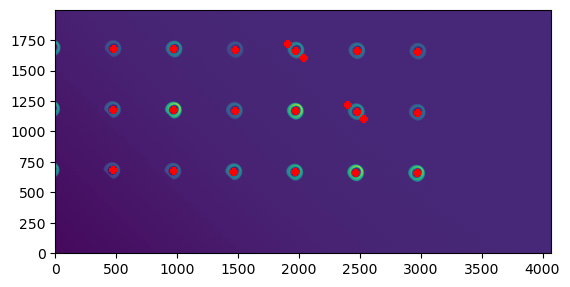

In [30]:
fig = plt.figure()
plt.imshow(exp.image.array, origin='lower')
plt.scatter(donutCat['centroid_x'], donutCat['centroid_y'], marker='+', 
            lw=3,c='red', )


In [154]:
config

lsst.ts.wep.task.cutOutDonutsCwfsTask.CutOutDonutsCwfsTaskConfig(saveLogOutput=True, donutStampSize=160, initialCutoutPadding=5, opticalModel='offAxis', subtractBackground={'statisticsProperty': 'MEANCLIP', 'undersampleStyle': 'REDUCE_INTERP_ORDER', 'binSize': 128, 'binSizeX': 0, 'binSizeY': 0, 'algorithm': 'AKIMA_SPLINE', 'ignoredPixelMask': ['BAD', 'EDGE', 'DETECTED', 'DETECTED_NEGATIVE', 'NO_DATA'], 'isNanSafe': False, 'useApprox': True, 'approxOrderX': 6, 'approxOrderY': -1, 'weighting': True}, maxRecenterDistance=35, sourceErosionIter=1, bkgDilationIter=3, connections={'exposures': 'postISRCCD', 'donutCatalog': 'donutCatalog', 'camera': 'camera', 'donutStampsExtra': 'donutStampsExtra', 'donutStampsIntra': 'donutStampsIntra'})

donutCatalog@{instrument: 'LSSTCam', detector: 192, visit: 7022071901010, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1010 id=932d11f9-3b2d-46e0-8f1c-7b1c0efb5a5b)
donutCatalog@{instrument: 'LSSTCam', detector: 195, visit: 7022071901010, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1010 id=510119c8-3885-4e8b-8780-5cb773eb6b3b)
donutCatalog@{instrument: 'LSSTCam', detector: 203, visit: 7022071901010, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1010 id=da48a7c0-edf3-4dd4-bbe7-2254ff7fe6e1)
donutCatalog@{instrument: 'LSSTCam', detector: 200, visit: 7022071901010, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1010 id=a0792b1a-18fd-4b4f-8cb5-dbe426ed7d36)
donutCatalog@{instrument: 'LSSTCam', detector: 196, visit: 7022071901010, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=DataFrame] (run=ts_imsim_1010 id=f6ecacfd-7304-4f0d-b72a

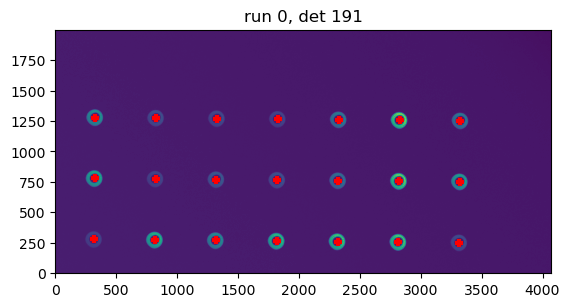

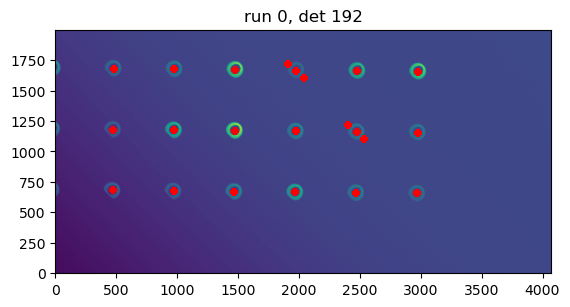

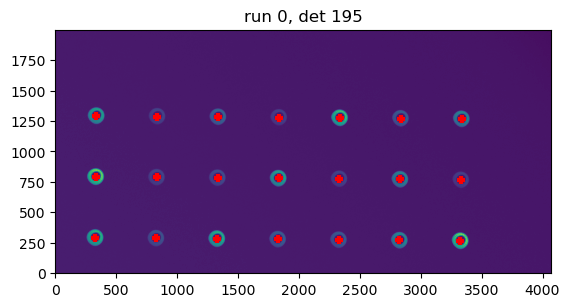

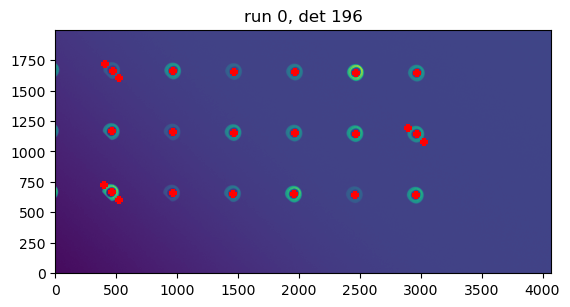

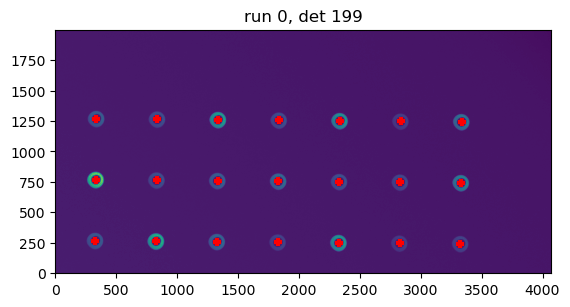

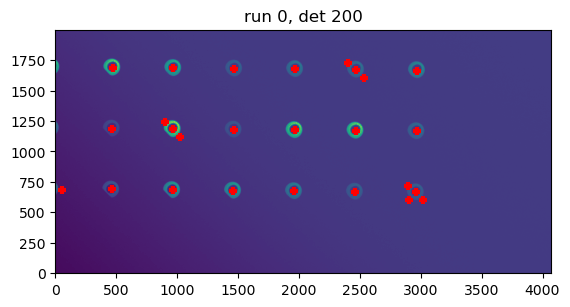

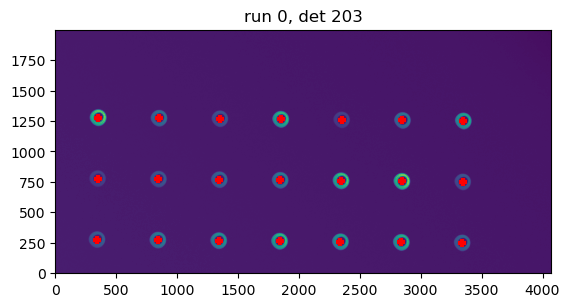

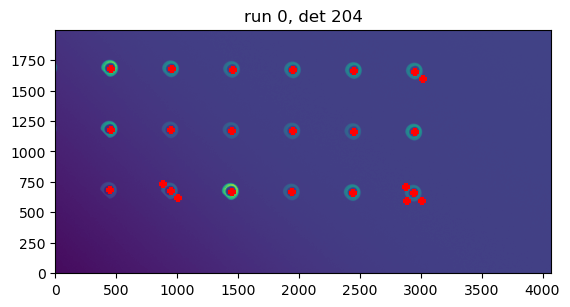

In [47]:
idx = 0

dataRefs = butler.registry.queryDatasets('donutCatalog', collections = ['ts_imsim_1010']).expanded()
donutCats = {}
for ref in dataRefs:
    print(ref)
    donutCats[ref.dataId.detector.id] = butler.get('donutCatalog', dataId=ref.dataId,  collections = ['ts_imsim_1010'])
   # print(ref.dataId.detector.id, len(

i=0
for detId in np.sort(list(exps.keys())):
    exp = exps[detId]
    fig = plt.figure()
    plt.imshow(exp.image.array, origin='lower')
    print(len(donutCats[detId]), detId)
    plt.scatter(donutCats[detId]['centroid_x'], donutCats[detId]['centroid_y'], marker='+', 
                lw=3,c='red', )

    #wcs = exp.getWcs()
    #x1,y1 = wcs.skyToPixelArray(donutCats[detId]['coord_ra'],donutCats[detId]['coord_dec'],degrees=False)
    #x2,y2 = wcs.skyToPixelArray(inst_cat['Ra'][i], inst_cat['Dec'][i], degrees=True )
    #plt.scatter(x1,y1,marker='o', facecolors="None", edgecolors="orange", lw=2,s=160)
    #plt.scatter(x2,y2,marker='o', facecolors="None", edgecolors="brown", lw=2,s=130)
    plt.title(f'run {idx}, det {detId}')
    i += 1 

What would donuts look like? I wonder specifically about cases of multiple detections... 

In [32]:
dataRefs = butler.registry.queryDatasets('donutStampsExtra', collections = ['ts_imsim_1010']).expanded()
donutStampsExtra = {}
donutStampsIntra = {}
for ref in dataRefs:
    print(ref)
    donutStampsExtra[ref.dataId.detector.id] = butler.get('donutStampsExtra', dataId=ref.dataId,  collections = ['ts_imsim_1010'])
    donutStampsIntra[ref.dataId.detector.id] = butler.get('donutStampsIntra', dataId=ref.dataId,  collections = ['ts_imsim_1010'])

donutStampsExtra@{instrument: 'LSSTCam', detector: 191, visit: 7022071901010, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1010 id=307bff2e-dd8b-452d-a0ee-9b5aca12dd12)
donutStampsExtra@{instrument: 'LSSTCam', detector: 195, visit: 7022071901010, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1010 id=41756011-9636-4cae-9d79-2cb1ec02d179)


These are the only ones available (191,192), and (195,196(  because with (199,200) pair  we have issues. 

Text(0.5, 0.98, '191')

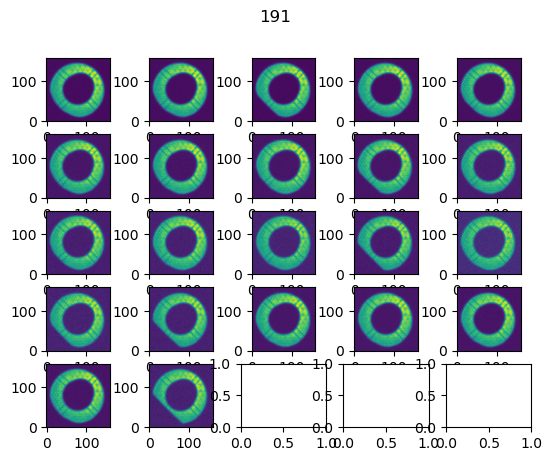

In [43]:
fig,axs = plt.subplots(5,5)
ax = np.ravel(axs)
detId = 191
for i in range(len(donutStampsIntra[detId])):
    ax[i].imshow(donutStampsIntra[detId][i].stamp_im.image.array, origin='lower')
fig.suptitle(detId)

Run then 199, 200 with cutOutDonutsCwfsTask:

In [50]:
from lsst.ts.wep.task.cutOutDonutsCwfsTask import (
    CutOutDonutsCwfsTask,
    CutOutDonutsCwfsTaskConfig,
)
config = CutOutDonutsCwfsTaskConfig()
config.maxRecenterDistance = 35

cutoutTask = CutOutDonutsCwfsTask(config=config)


cutoutResults = cutoutTask.run([exps[199], exps[200]],
                  [donutCats[199],donutCats[200]],
                  camera)



INFO:lsst.CutOutDonutsCwfsTask:Median Recentering Shift: (3.0, -3.0)
INFO:lsst.CutOutDonutsCwfsTask:Median Recentering Shift: (-2.0, 5.0)


LengthError: 
  File "src/image/Image.cc", line 70, in static lsst::afw::image::ImageBase<PixelT>::_view_t lsst::afw::image::ImageBase<PixelT>::_makeSubView(const lsst::geom::Extent2I&, const lsst::geom::Extent2I&, const _view_t&) [with PixelT = float; _view_t = boost::gil::image_view<boost::gil::memory_based_2d_locator<boost::gil::memory_based_step_iterator<boost::gil::pixel<float, boost::gil::layout<boost::mp11::mp_list<boost::gil::gray_color_t> > >*> > >; lsst::geom::Extent2I = lsst::geom::Extent<int, 2>]
    Box2I(Point2I(-26,604),lsst::geom::Extent2I(160,160)) doesn't fit in image 4072x2000 {0}
lsst::pex::exceptions::LengthError: 'Box2I(Point2I(-26,604),lsst::geom::Extent2I(160,160)) doesn't fit in image 4072x2000'


In [ ]:
donutStamps = butler.get('donutStampsIntra' 

Following code from https://github.com/suberlak/AOS/blob/main/AOS_PS1_lsstCam_high_Pert00_qck.ipynb :

In [324]:
exposure = exps[204]

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 0, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_

Reading 0: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 0, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 1: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure A

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 18, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset

Reading 19: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 19, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 20: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposur

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 36, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset

Reading 37: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 37, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 38: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposur

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 55, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset

Reading 55: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 55, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 56: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposur

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 72, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset

Reading 72: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 72, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 73: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposur

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 90, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset

Reading 90: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 90, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 91: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposur

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 107, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".datase

Reading 107: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 107, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 108: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".expo

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 124, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".datase

Reading 124: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 124, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 125: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".expo

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 141, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".datase

Reading 141: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 141, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 142: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".expo

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 158, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".datase

Reading 158: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 158, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 159: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".expo

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 176, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".datase

Reading 176: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 176, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 177: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".expo

[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 195, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".datase

Reading 195: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".exposure AS exposure, "postISRCCD_tags".instrument AS instrument, ? AS "t!postISRCCD:collection", "postISRCCD_tags".dataset_id AS "t!postISRCCD:dataset_id", "postISRCCD_tags".detector AS detector 
FROM dataset_tags_00000002 AS "postISRCCD_tags" 
WHERE "postISRCCD_tags".dataset_type_id = ? AND "postISRCCD_tags".collection_id = ? AND "postISRCCD_tags".instrument = ? AND "postISRCCD_tags".detector = ? AND "postISRCCD_tags".exposure = ?]
[parameters: (157, 157, 12, 157, 'LSSTCam', 195, <lsst.afw.image._exposure.ExposureF object at 0x7feff15a7770>)]
(Background on this error at: https://sqlalche.me/e/20/f405)
Reading 196: (sqlite3.ProgrammingError) Error binding parameter 7: type 'lsst.afw.image._exposure._exposure.ExposureF' is not supported
[SQL: SELECT ? AS "t!postISRCCD:run", "postISRCCD_tags".expo

AssertionError: minimum and maximum values must not be equal

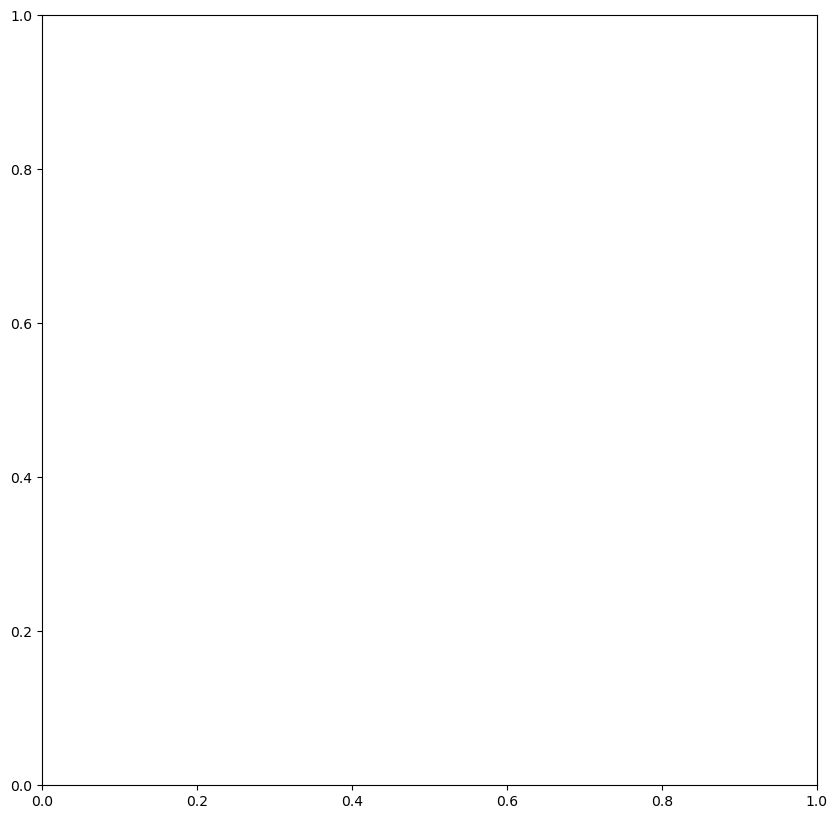

In [326]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"

detectorNameList = None
dataType = 'postISRCCD'
instrument='LSSTCam'
mos = cgUtils.showCamera(camera,
                             cgUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=False, title=f'{instrument}, high, extra-focal, 9010121' )
                             
disp.show_colorbar(False)
ax.axis("off")


Check self-consistency of the instance catalog and the created sources. Why would there be such an offset? 

It's all over the place -  for default  MJD! I'd need to test the first step - why  merely using a different MJD brings a different offset. 

In [206]:
path_imsim_cat  = os.path.join(img_dir, 'iter0/pert/', 'instCat.txt')
imsim_inst_cat = Table.read(path_imsim_cat, format='ascii')

In [208]:
imsim_inst_cat.rename_columns(['col3', 'col4'],['ra','dec'])

In [260]:
imsim_inst_cat[['ra','dec']]

ra,dec
float64,float64
358.858111,-1.17363
358.729011,-1.171809
358.82637,1.141889
358.828191,1.270989
1.17363,-1.141889
1.171809,-1.270989
1.141889,1.17363
1.270989,1.171809


Given this instance catalog, read in the raws 

In [262]:
raw_image_path = os.path.join(img_dir, 'iter0/img/','raw_IM_P_20220810_001000-0-g-R00_SW0-det191.fits.fz')
amp_image_path = os.path.join(img_dir, 'iter0/img/', 'amp_IM_P_20220810_001000-0-g-R00_SW0-det191.fits.fz')

In [263]:
from astropy.io import fits
hdul_raw = fits.open(raw_image_path)
hdul_amp = fits.open(amp_image_path)

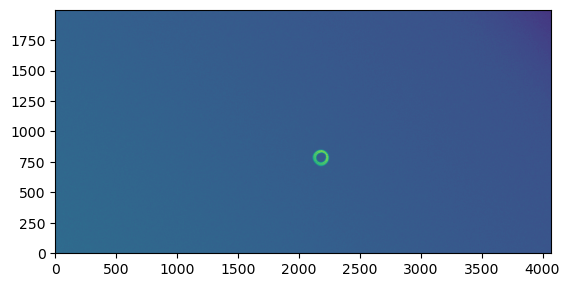

In [267]:
plt.imshow(hdul_raw[1].data, origin='lower')

Following https://learn.astropy.org/tutorials/celestial_coords1.html , I use the header information to get the WCS:

In [264]:
from astropy.wcs import WCS
wcs_fits_raw = WCS(hdul_raw[1].header)
wcs_fits_amp = WCS(hdul_amp[1].header)

In [265]:
wcs_fits_raw

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP' 'DEC--TAN-SIP' 
CRVAL : 358.846303023945 -1.1650375005931628 
CRPIX : 2035.4404555626372 999.4317987398414 
CD1_1 CD1_2  : -1.24837411119e-06 -5.5511604966391e-05 
CD2_1 CD2_2  : -5.551128494163e-05 1.35885973895873e-06 
NAXIS : 4072  2000

In [266]:
wcs_fits_amp

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP' 'DEC--TAN-SIP' 
CRVAL : 358.846303023945 -1.1650375005931628 
CRPIX : -1526.4404555626372 3000.5682012601587 
CD1_1 CD1_2  : 1.24837411119002e-06 5.55116049663915e-05 
CD2_1 CD2_2  : 5.55112849416305e-05 -1.3588597389587e-06 
NAXIS : 576  2048

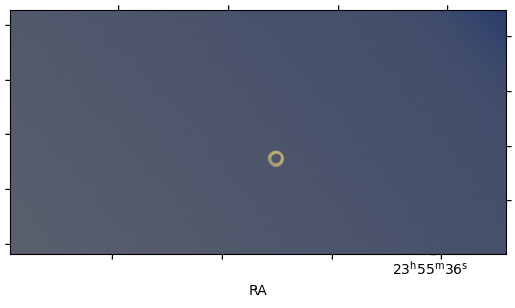

In [225]:
fig = plt.figure()# figsize=(10, 10))
ax = plt.subplot(projection=wcs_fits)
plt.imshow(hdul[1].data, origin='lower', cmap='cividis', aspect='equal')
plt.xlabel(r'RA')
plt.ylabel(r'Dec')
#overlay = ax.get_coords_overlay('icrs')
#overlay.grid(color='white', ls='dotted')
#plt.scatter(imsim_inst_cat['ra'], imsim_inst_cat['dec'])

After that  : https://joseph-long.com/writing/from-sky-coordinates-to-pixels-and-back/

In [229]:
x,y = wcs_fits.all_world2pix(imsim_inst_cat['ra'], imsim_inst_cat['dec'], 0)

In [238]:
det_name  = hdul[1].header['DET_NAME']

(0.0, 2000.0)

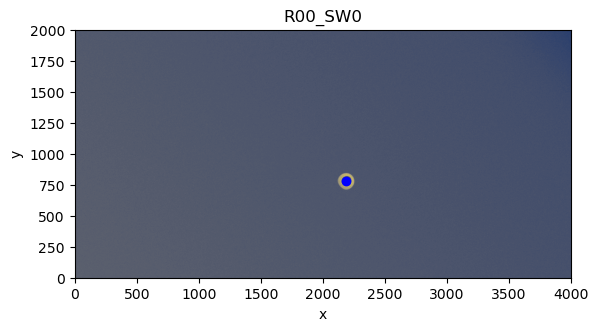

In [239]:
fig = plt.figure()# figsize=(10, 10))
ax = plt.subplot() # projection=wcs_fits)
plt.imshow(hdul[1].data, origin='lower', cmap='cividis', aspect='equal')
plt.xlabel(r'x')
plt.ylabel(r'y')
plt.title(det_name)
plt.scatter(x,y,c='blue')
plt.xlim(0,4000)
plt.ylim(0,2000)

compare the exposure WCS to FITS WCS. Do they differ? 

In [246]:
for detId in exps.keys():
    print(detId, exps[detId].detector.getName())

204 R44_SW1
199 R40_SW0
203 R44_SW0
195 R04_SW0
192 R00_SW1
196 R04_SW1
191 R00_SW0
200 R40_SW1


Show the WCS for 191, i.e. `R00_SW0`, shown above: 

In [247]:
wcs_exp = exps[191].getWcs()

In [253]:
imsim_inst_cat['ra']

358.858111
358.729011
358.82637
358.828191
1.17363
1.171809
1.141889
1.270989


In [273]:
x_exp, y_exp = wcs_exp.skyToPixelArray(imsim_inst_cat['ra'], imsim_inst_cat['dec'], degrees=True)
x_fits, y_fits = wcs_fits.all_world2pix(imsim_inst_cat['ra'], imsim_inst_cat['dec'], 0)
x_fits_amp,  y_fits_amp = wcs_fits.all_world2pix(imsim_inst_cat['ra'], imsim_inst_cat['dec'], 0)

In [255]:
print(x_exp, y_exp)
print(x_fits, y_fits)

[  2355.63375105   2394.88057024 -39320.90874743 -41649.1033031
    543.90874743   2872.1033031  -41132.63375105 -41171.88057024] [   665.97050652   2993.66211656   2478.0653775    2516.33110908
 -41002.0653775  -41040.33110908 -39189.97050652 -41517.66211656]
[  2183.94314268   2208.19296853 -39758.24190249 -42141.91117293
    729.08205124   3083.12891687 -41791.23346294 -41861.62142315] [   782.4035947    3107.42029627   2304.46973662   2325.00578169
 -41441.27067263 -41483.709824   -40110.12371763 -42534.09549981]


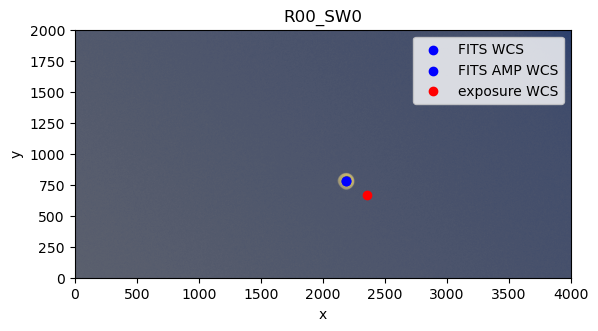

In [274]:
fig = plt.figure()# figsize=(10, 10))
ax = plt.subplot() # projection=wcs_fits)
plt.imshow(hdul[1].data, origin='lower', cmap='cividis', aspect='equal')
plt.xlabel(r'x')
plt.ylabel(r'y')
plt.title(det_name)
plt.scatter(x_fits,y_fits,c='blue', label='FITS WCS')
plt.scatter(x_fits_amp,y_fits_amp,c='blue', label='FITS AMP WCS')
plt.scatter(x_exp,y_exp,c='red', label='exposure WCS')
plt.xlim(0,4000)
plt.ylim(0,2000)
plt.legend()

In [ ]:
**next**

#### donutCats[detId]

Consider the donut stamps:

In [397]:
dataRefs = butler.registry.queryDatasets('donutStampsExtra', collections = ['ts_imsim_1000']).expanded()
donutStampsExtra = {}
for ref in dataRefs:
    print(ref)
    donutStampsExtra[ref.dataId.detector.id] = butler.get('donutStampsExtra', dataId=ref.dataId,  collections = ['ts_imsim_1000'])

donutStampsExtra@{instrument: 'LSSTCam', detector: 191, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=898b56cb-5d2a-4f9d-9ccf-a8fe7367c4cd)
donutStampsExtra@{instrument: 'LSSTCam', detector: 195, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=96035941-0ba7-4201-b56f-c1e323436122)
donutStampsExtra@{instrument: 'LSSTCam', detector: 199, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=c2389566-13f7-4820-a409-b3cbf15a41a1)
donutStampsExtra@{instrument: 'LSSTCam', detector: 203, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=92267f04-2935-42df-b70b-4072fafca62c)


In [398]:
dataRefs = butler.registry.queryDatasets('donutStampsIntra', collections = ['ts_imsim_1000']).expanded()
donutStampsIntra = {}
for ref in dataRefs:
    print(ref)
    donutStampsIntra[ref.dataId.detector.id] = butler.get('donutStampsIntra', 
                                                          dataId=ref.dataId,  collections = ['ts_imsim_1000'])

donutStampsIntra@{instrument: 'LSSTCam', detector: 191, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=9aa59aa9-fdac-49e4-964e-08b25b6a36ea)
donutStampsIntra@{instrument: 'LSSTCam', detector: 195, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=ff77791b-816b-4e6d-b1ef-17469021b0ab)
donutStampsIntra@{instrument: 'LSSTCam', detector: 199, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=ec1bd9e9-beb0-4b5a-97c5-f5c76ad03a5b)
donutStampsIntra@{instrument: 'LSSTCam', detector: 203, visit: 7022071901000, band: 'g', day_obs: 20220719, physical_filter: 'g_6'} [sc=StampsBase] (run=ts_imsim_1000 id=fd0eb7b1-ac35-4f40-a12b-c3ffd8686f4b)


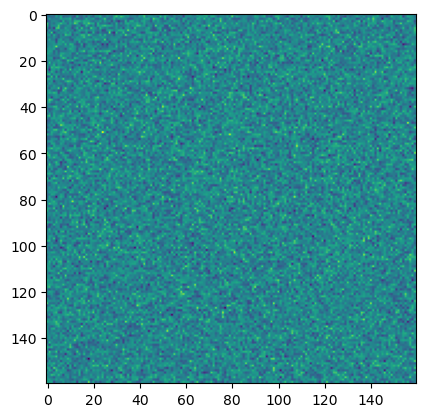

In [399]:
plt.imshow(donutStampsExtra[191][0].stamp_im.image.array)

what??? How can this be that the donut stamp is empty??? 

## Running direct detect instead